In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier

In [3]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

2024-10-25 01:27:29.572543: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-25 01:27:29.669767: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-25 01:27:29.697623: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-25 01:27:29.850116: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-25 01:27:31.653132: W tensorflow/compiler/tf2

In [4]:
# List of file names
file_names = [
    'Bot.csv', 'Brute Force-Web.csv', 'Brute Force-XSS.csv', 'DDOS attack-HOIC.csv', 
    'DDOS attack-LOIC-UDP.csv', 'DDoS attacks-LOIC-HTTP.csv', 'DoS attacks-GoldenEye.csv', 
    'DoS attacks-Hulk.csv', 'DoS attacks-SlowHTTPTest.csv', 'DoS attacks-Slowloris.csv', 
    'FTP-BruteForce.csv', 'Infilteration.csv', 'SQL Injection.csv', 'SSH-Bruteforce.csv'
]

In [5]:
# DataFrames to store the top 25 features
df_rf = pd.DataFrame(columns=['File', 'Feature', 'Importance'])
df_autoencoder = pd.DataFrame(columns=['File', 'Feature', 'Weight'])
df_lda = pd.DataFrame(columns=['File', 'Feature', 'Coefficient'])

In [8]:
# Lists to store the feature data
rf_features = []
autoencoder_features = []
lda_features = []

### Only Features

In [9]:
for file in file_names:
    print(f"Processing {file}...")
    
    # Load the dataset
    df = pd.read_csv(file)
    
    # Preprocess data
    X = df.drop('Label', axis=1)
    y = df['Label']
    
    # Encode target variable if it's categorical
    le = LabelEncoder()
    y = le.fit_transform(y)
    
    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Scale features for LDA and Autoencoder
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    ## Random Forest Feature Extraction
    rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(X_train, y_train)
    
    importances = rf.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    # Top 25 features for Random Forest
    for i in range(25):
        rf_features.append({
            'File': file,
            'Feature': X.columns[indices[i]],
            'Importance': importances[indices[i]]
        })
    # for i in range(25):
    #     df_rf = df_rf.add()append({
    #         'File': file,
    #         'Feature': X.columns[indices[i]],
    #         'Importance': importances[indices[i]]
    #     }, ignore_index=True)
    
    ## Autoencoder Feature Extraction
    input_dim = X_train_scaled.shape[1]
    encoding_dim = 20  # Adjust this as needed
    
    # Define the autoencoder architecture
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(encoding_dim, activation='relu')(input_layer)
    decoder = Dense(input_dim, activation='sigmoid')(encoder)
    
    autoencoder = Model(inputs=input_layer, outputs=decoder)
    autoencoder.compile(optimizer='adam', loss='mse')
    
    autoencoder.fit(X_train_scaled, X_train_scaled, epochs=50, batch_size=128, validation_split=0.2, verbose=0)
    
    # Extract the encoder part
    encoder_model = Model(inputs=input_layer, outputs=encoder)
    
    # Get the weights of the encoder layer
    encoder_weights = autoencoder.get_weights()[0]
    
    # Create a DataFrame for feature importance based on weights
    feature_importance = pd.DataFrame({
        'Feature': X.columns,
        'Weight': np.abs(encoder_weights).sum(axis=1)  # Sum of absolute weights for each feature
    }).sort_values(by='Weight', ascending=False)
    
    # Top 25 features for Autoencoder
    top_features_autoencoder = feature_importance.head(25)
    for index, row in top_features_autoencoder.iterrows():
        autoencoder_features.append({
            'File': file,
            'Feature': row['Feature'],
            'Weight': row['Weight']
        })
    # for index, row in top_features_autoencoder.iterrows():
    #     df_autoencoder = df_autoencoder.append({
    #         'File': file,
    #         'Feature': row['Feature'],
    #         'Weight': row['Weight']
    #     }, ignore_index=True)
    
    ## LDA Feature Extraction
    lda = LinearDiscriminantAnalysis(n_components=1)
    X_train_lda = lda.fit_transform(X_train_scaled, y_train)
    
    lda_coefficients = lda.coef_[0]
    
    # Create a DataFrame for feature importance based on LDA coefficients
    feature_importance_lda = pd.DataFrame({
        'Feature': X.columns,
        'Coefficient': lda_coefficients
    })
    
    # Sort features by absolute value of coefficients
    feature_importance_lda['Abs_Coefficient'] = np.abs(feature_importance_lda['Coefficient'])
    feature_importance_lda = feature_importance_lda.sort_values(by='Abs_Coefficient', ascending=False)
    
    # Top 25 features for LDA
    top_features_lda = feature_importance_lda.head(25)
    for index, row in top_features_lda.iterrows():
        lda_features.append({
            'File': file,
            'Feature': row['Feature'],
            'Coefficient': row['Coefficient']
        })
    # for index, row in top_features_lda.iterrows():
    #     df_lda = df_lda.append({
    #         'File': file,
    #         'Feature': row['Feature'],
    #         'Coefficient': row['Coefficient']
    #     }, ignore_index=True)

    print(f"Processed file: {file}")
    
# Convert the lists of dictionaries to DataFrames
df_rf1 = pd.DataFrame(rf_features)
df_autoencoder1 = pd.DataFrame(autoencoder_features)
df_lda1 = pd.DataFrame(lda_features)

# Save the DataFrames to CSV files for each extraction method
df_rf1.to_csv('random_forest_features.csv', index=False)
df_autoencoder1.to_csv('autoencoder_features.csv', index=False)
df_lda1.to_csv('lda_features.csv', index=False)

print("Feature extraction complete. Results saved to CSV files.")

Processing Bot.csv...


I0000 00:00:1729803041.882592   13738 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729803042.021443   13738 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729803042.021720   13738 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729803042.023691   13738 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

Processed file: Bot.csv
Processing Brute Force-Web.csv...
Processed file: Brute Force-Web.csv
Processing Brute Force-XSS.csv...
Processed file: Brute Force-XSS.csv
Processing DDOS attack-HOIC.csv...


2024-10-25 02:26:38.663053: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 465653760 exceeds 10% of free system memory.


Processed file: DDOS attack-HOIC.csv
Processing DDOS attack-LOIC-UDP.csv...
Processed file: DDOS attack-LOIC-UDP.csv
Processing DDoS attacks-LOIC-HTTP.csv...
Processed file: DDoS attacks-LOIC-HTTP.csv
Processing DoS attacks-GoldenEye.csv...
Processed file: DoS attacks-GoldenEye.csv
Processing DoS attacks-Hulk.csv...
Processed file: DoS attacks-Hulk.csv
Processing DoS attacks-SlowHTTPTest.csv...
Processed file: DoS attacks-SlowHTTPTest.csv
Processing DoS attacks-Slowloris.csv...
Processed file: DoS attacks-Slowloris.csv
Processing FTP-BruteForce.csv...
Processed file: FTP-BruteForce.csv
Processing Infilteration.csv...
Processed file: Infilteration.csv
Processing SQL Injection.csv...
Processed file: SQL Injection.csv
Processing SSH-Bruteforce.csv...
Processed file: SSH-Bruteforce.csv
Feature extraction complete. Results saved to CSV files.


Processing file: Bot.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        22         6         257024            11            11   
1         0         0      112641101             3             0   
2         0         0      112639047             3             0   
3         0         0      112640744             3             0   
4        22         6        5707641            14            11   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0             1249           1969.0              736                0   
1                0              0.0                0                0   
2                0              0.0                0                0   
3                0              0.0                0                0   
4             1123           1969.0              648                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0        113.545455  ...                20          0.0 

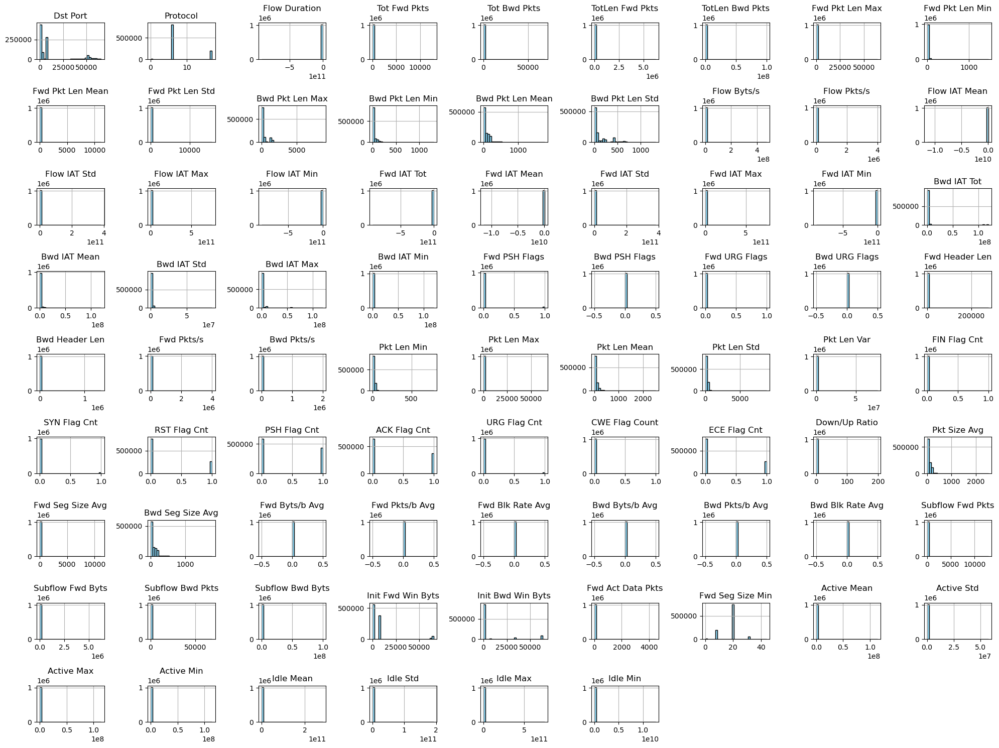

Label
Benign    731712
Bot       286191
Name: count, dtype: int64


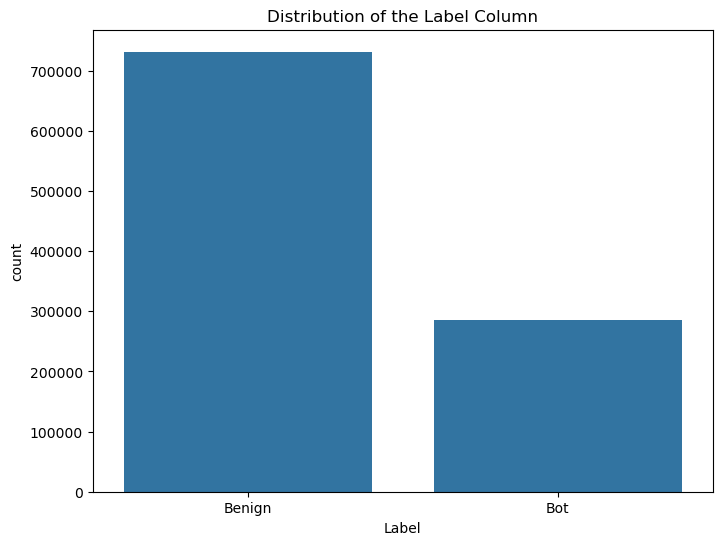

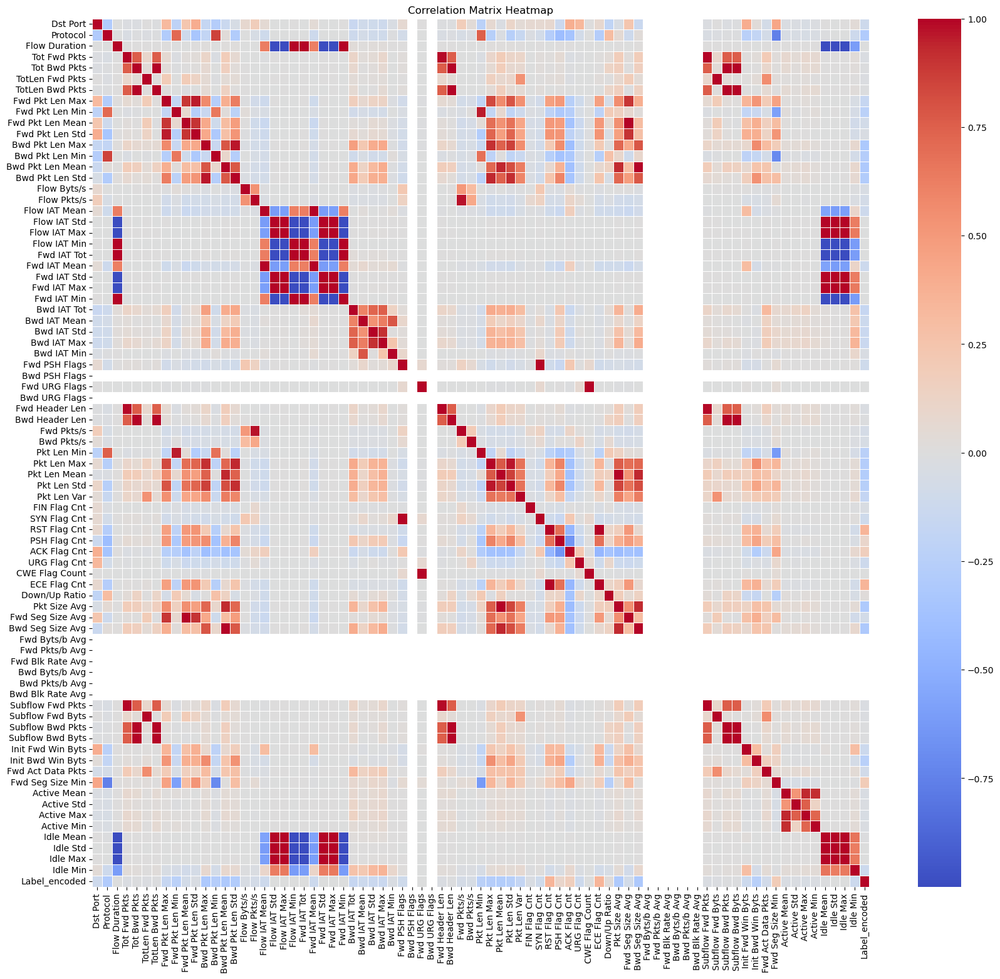

Top 10 features most positively correlated with the Label:
Label_encoded       1.000000
ECE Flag Cnt        0.351442
RST Flag Cnt        0.351439
Fwd Seg Size Min    0.188936
ACK Flag Cnt        0.168256
PSH Flag Cnt        0.096794
Down/Up Ratio       0.023372
Idle Std           -0.000965
Flow IAT Min       -0.001581
Fwd IAT Min        -0.001619
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Bwd Pkt Len Mean   -0.309813
Bwd Pkt Len Max    -0.313555
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


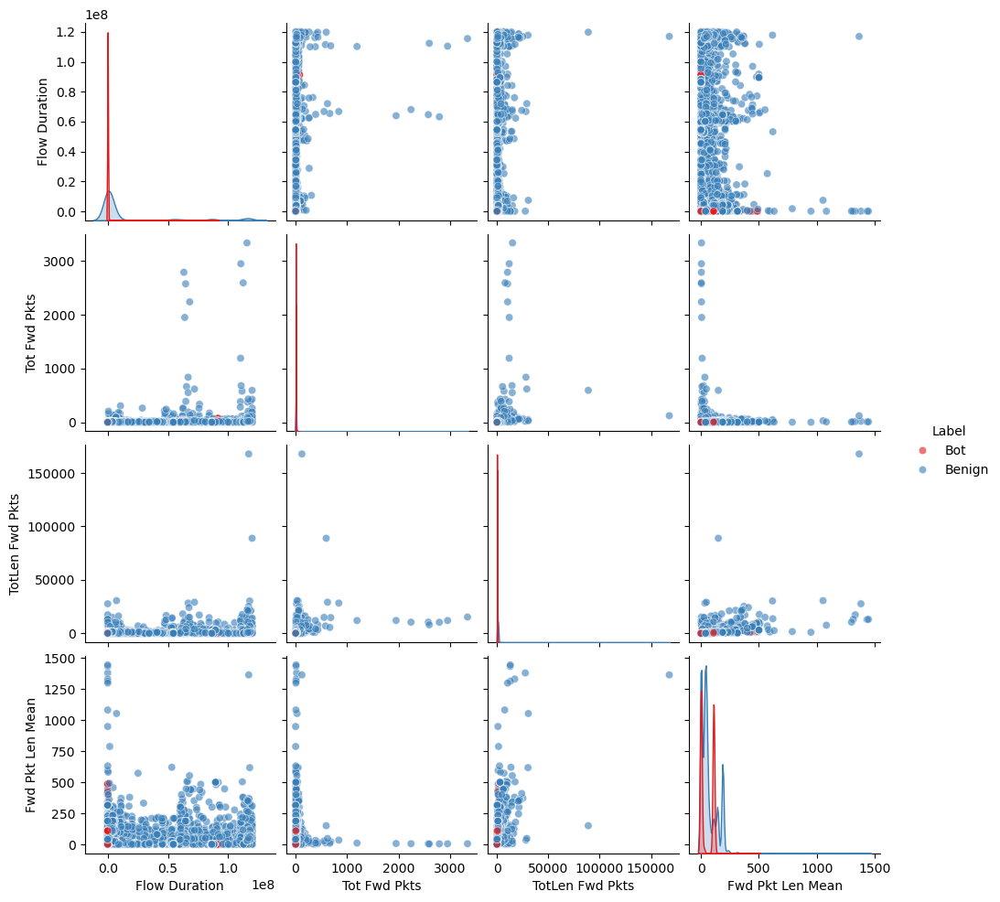

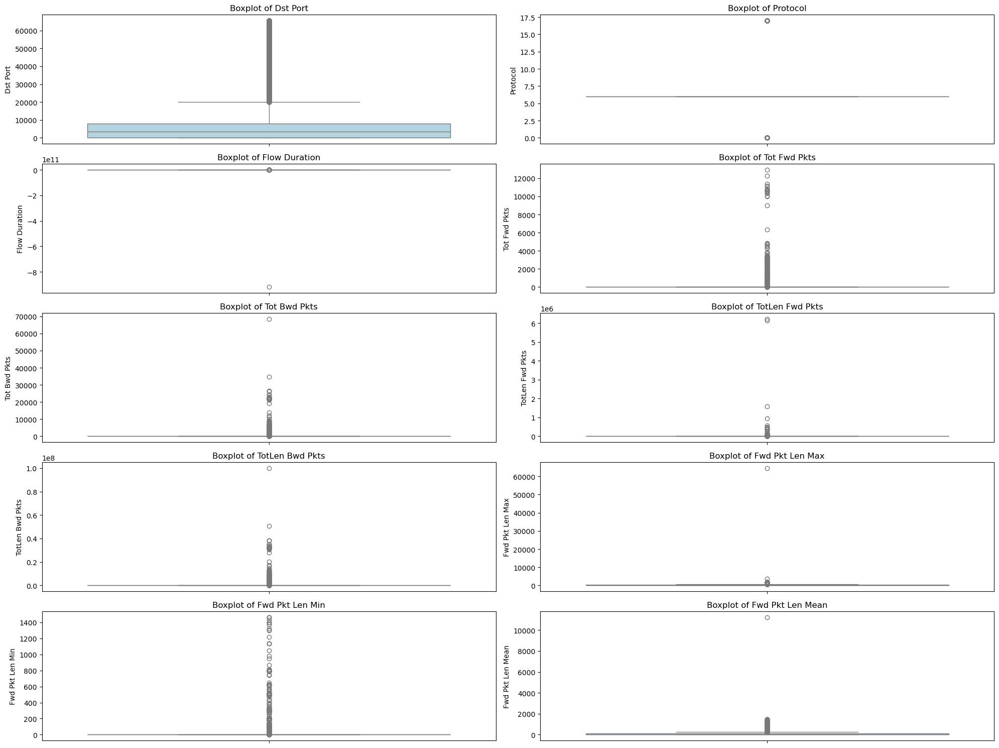

Top 25 important features:
Dst Port: 0.10729199447298562
Fwd IAT Tot: 0.08753843984109724
Fwd IAT Max: 0.08694721806910956
Flow Pkts/s: 0.0619169772221685
Bwd Seg Size Avg: 0.05613186738665865
Flow IAT Mean: 0.05566959524975006
Fwd Pkts/s: 0.05088674663316292
Fwd IAT Min: 0.04858739556477647
Fwd IAT Mean: 0.037187893251677984
Flow IAT Max: 0.0357664050783698
Init Fwd Win Byts: 0.033947507555432396
Pkt Size Avg: 0.029573936496394213
Bwd Pkt Len Mean: 0.025573795431608957
Flow Byts/s: 0.02145181186913354
Flow Duration: 0.020945795794813538
Flow IAT Min: 0.017574381905482373
Bwd Pkt Len Std: 0.01750699456972487
Pkt Len Mean: 0.01683061922751759
Subflow Fwd Pkts: 0.01638988369661165
Bwd Pkts/s: 0.013081585580277324
Fwd Pkt Len Mean: 0.012464124438404002
ECE Flag Cnt: 0.011213891468902093
TotLen Bwd Pkts: 0.010356906594670964
Fwd Header Len: 0.009289962861320918
Fwd Pkt Len Std: 0.00923377266100819


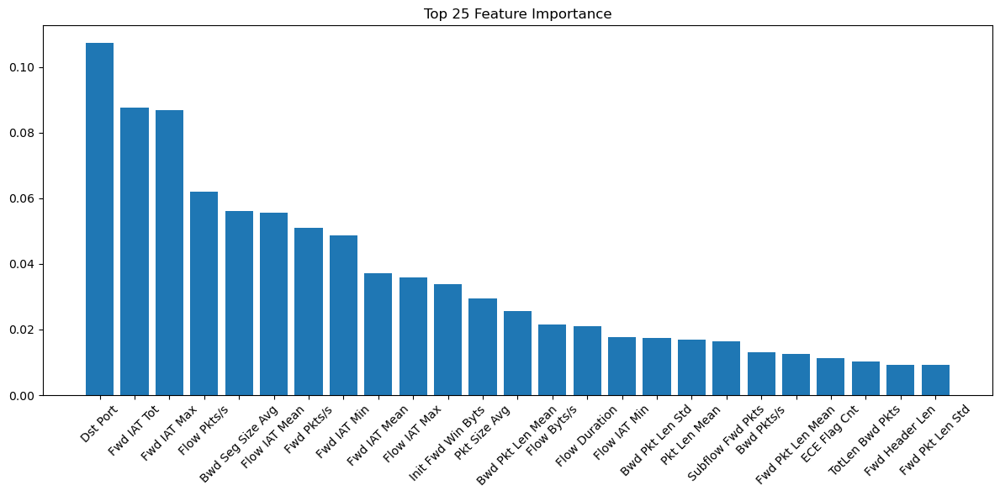

Epoch 1/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 7s 1ms/step - loss: 0.6652 - val_loss: 0.7663
Epoch 2/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step - loss: 0.5924 - val_loss: 0.7641
Epoch 3/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6035 - val_loss: 0.7637
Epoch 4/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6086 - val_loss: 0.7633
Epoch 5/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 6s 1ms/step - loss: 0.5748 - val_loss: 0.7632
Epoch 6/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6016 - val_loss: 0.7630
Epoch 7/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6473 - val_loss: 0.7629
Epoch 8/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 996us/step - loss: 0.6007 - val_loss: 0.7628
Epoch 9/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6737 - val_loss: 0.7628
Epoch 10/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.5821 - val_loss: 0.7628
Epoch 11/50
5090/5090 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6142 - val_loss: 0.7628
Epoch 12/50
5090/5090 ━━━━━━

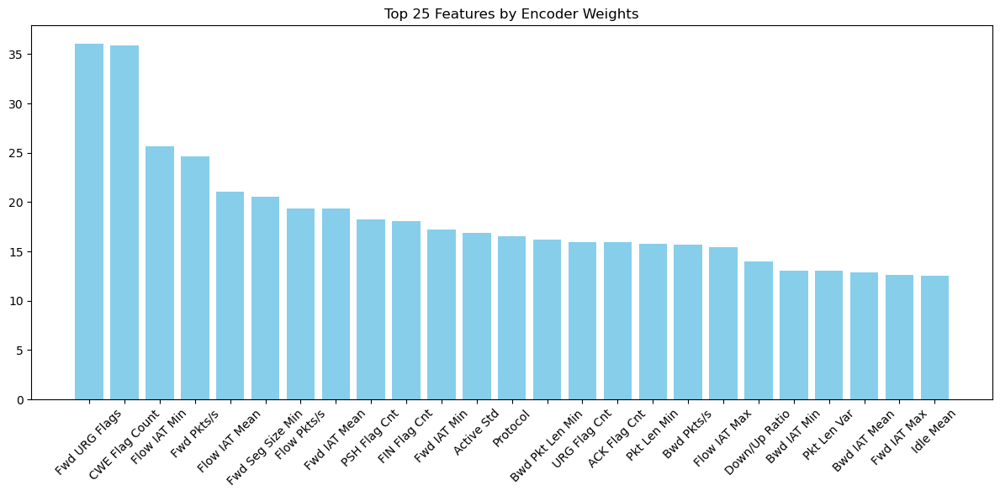

25448/25448 ━━━━━━━━━━━━━━━━━━━━ 19s 762us/step
6362/6362 ━━━━━━━━━━━━━━━━━━━━ 5s 762us/step
Encoded features shape: (814322, 20)
Top 25 features by LDA coefficients:
             Feature  Coefficient
6    TotLen Bwd Pkts    90.926395
65  Subflow Bwd Byts   -82.374642
51      ECE Flag Cnt     9.012211
74         Idle Mean     7.679862
77          Idle Min    -7.369435
48      ACK Flag Cnt     6.641842
10   Fwd Pkt Len Std     6.528091
53      Pkt Size Avg    -6.203342
46      RST Flag Cnt    -5.891305
36    Bwd Header Len    -5.629575
17     Flow IAT Mean    -5.379862
7    Fwd Pkt Len Max    -5.341896
47      PSH Flag Cnt     3.980893
14   Bwd Pkt Len Std    -3.766008
22      Fwd IAT Mean    -3.718375
25       Fwd IAT Min     3.673324
11   Bwd Pkt Len Max     3.219476
41      Pkt Len Mean     3.195101
20      Flow IAT Min     2.827662
2      Flow Duration    -2.507869
69  Fwd Seg Size Min    -2.249294
40       Pkt Len Max    -2.172534
76          Idle Max     1.886751
0           Dst P

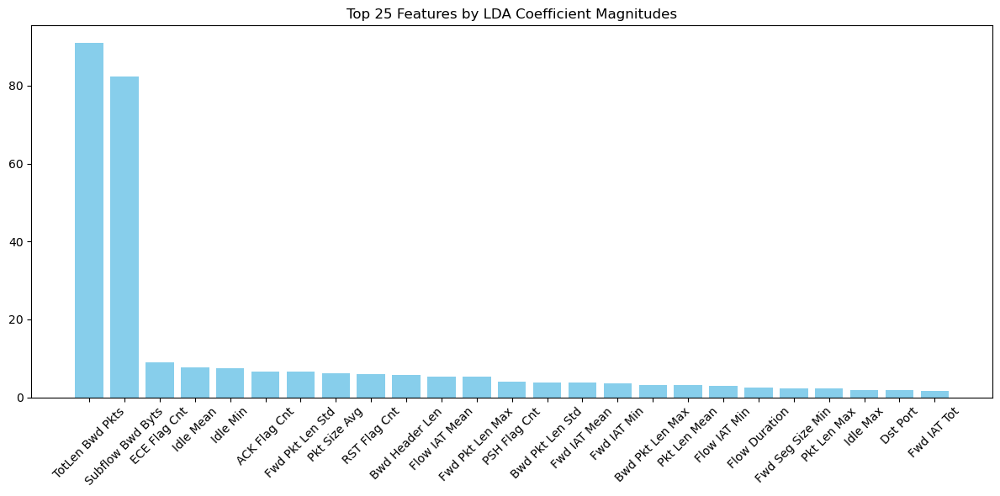

Processing file: Brute Force-Web.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        80         6        6192788             4             4   
1        80         6            791             3             4   
2        80         6        3802027            15            27   
3        53        17            384             1             1   
4       443         6         132185            10             8   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0               97            231.0               97                0   
1              161            488.0              161                0   
2              407          33409.0              407                0   
3               56             72.0               56               56   
4              510           7523.0              194                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0         24.250000  ...                20  

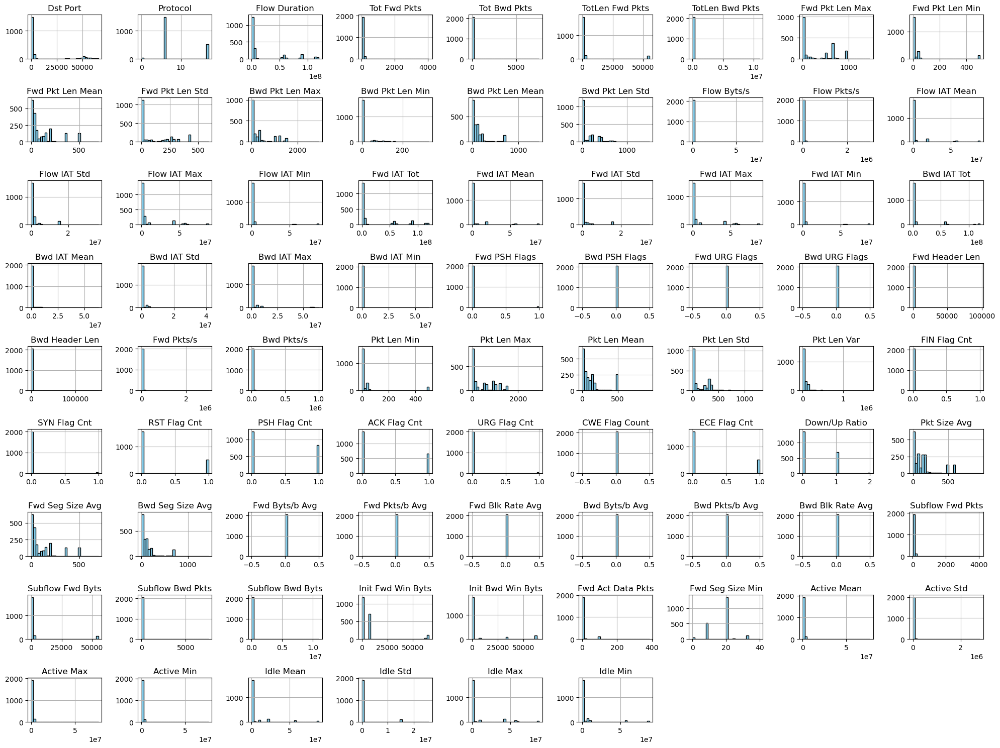

Label
Benign              1462
Brute Force -Web     611
Name: count, dtype: int64


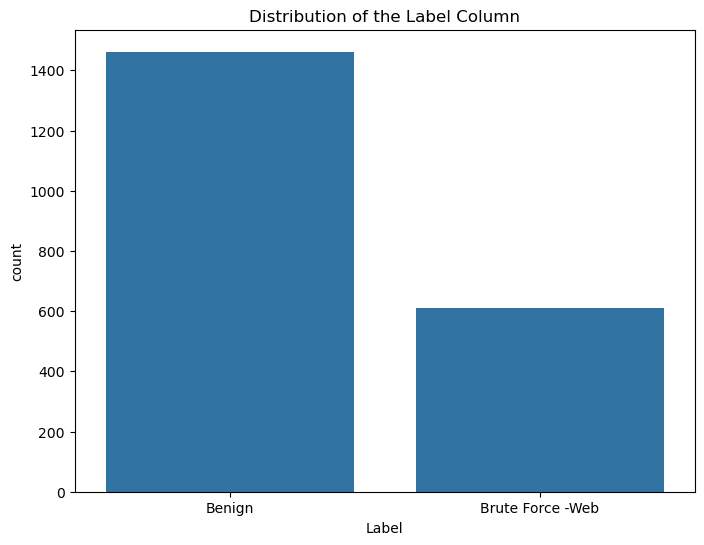

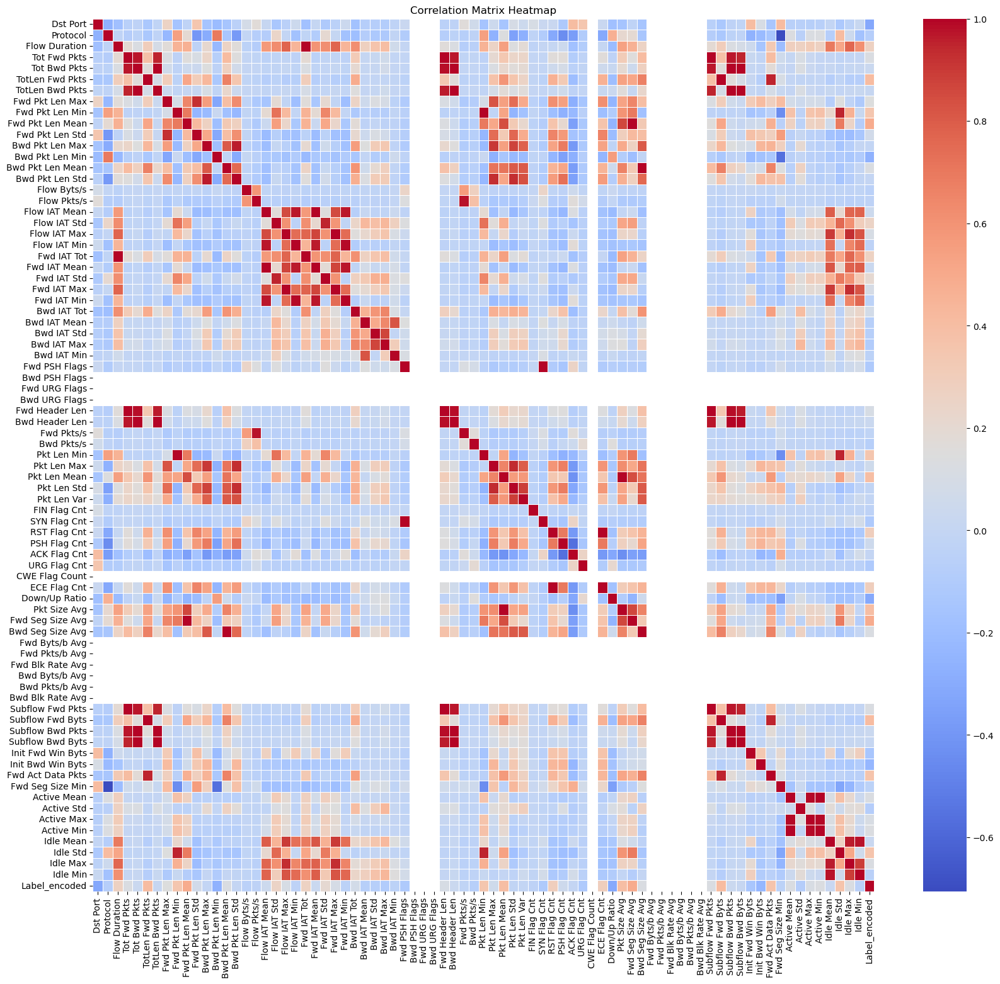

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Fwd Seg Size Avg     0.492203
Fwd Pkt Len Mean     0.492203
TotLen Fwd Pkts      0.412910
Subflow Fwd Byts     0.412910
Pkt Len Mean         0.399433
Pkt Size Avg         0.395223
Idle Std             0.364897
Fwd Act Data Pkts    0.364086
Pkt Len Min          0.353498
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Bwd PSH Flags      NaN
Fwd URG Flags      NaN
Bwd URG Flags      NaN
CWE Flag Count     NaN
Fwd Byts/b Avg     NaN
Fwd Pkts/b Avg     NaN
Fwd Blk Rate Avg   NaN
Bwd Byts/b Avg     NaN
Bwd Pkts/b Avg     NaN
Bwd Blk Rate Avg   NaN
Name: Label_encoded, dtype: float64


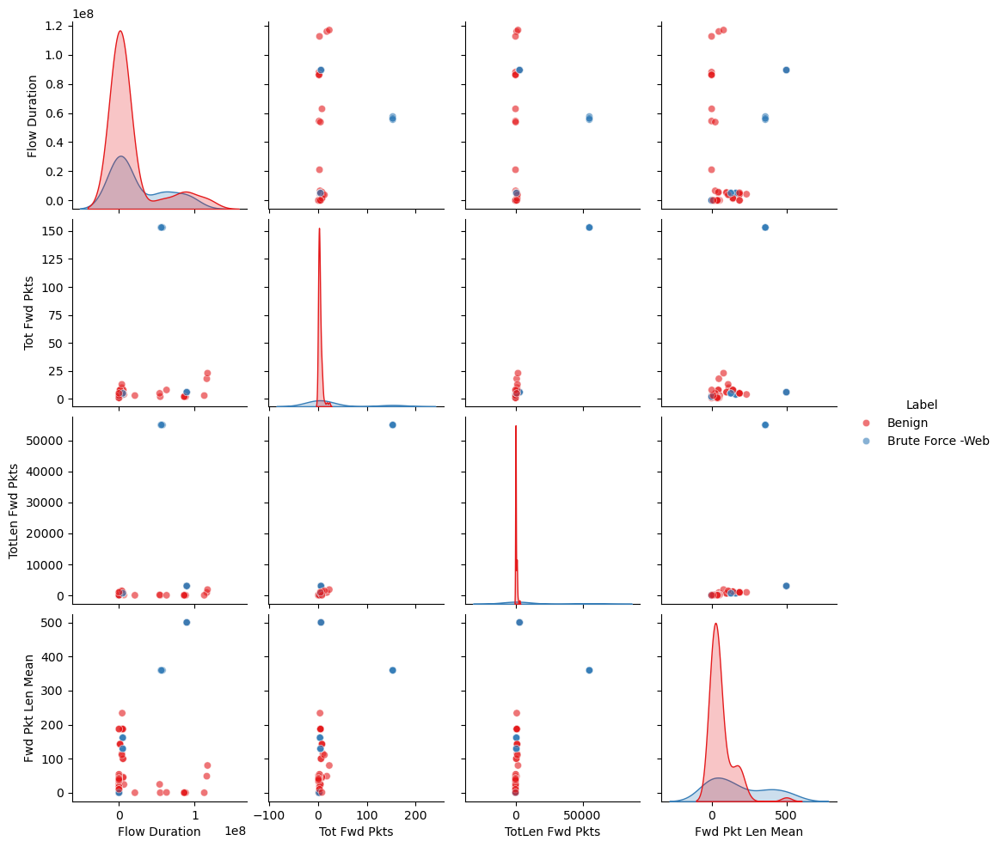

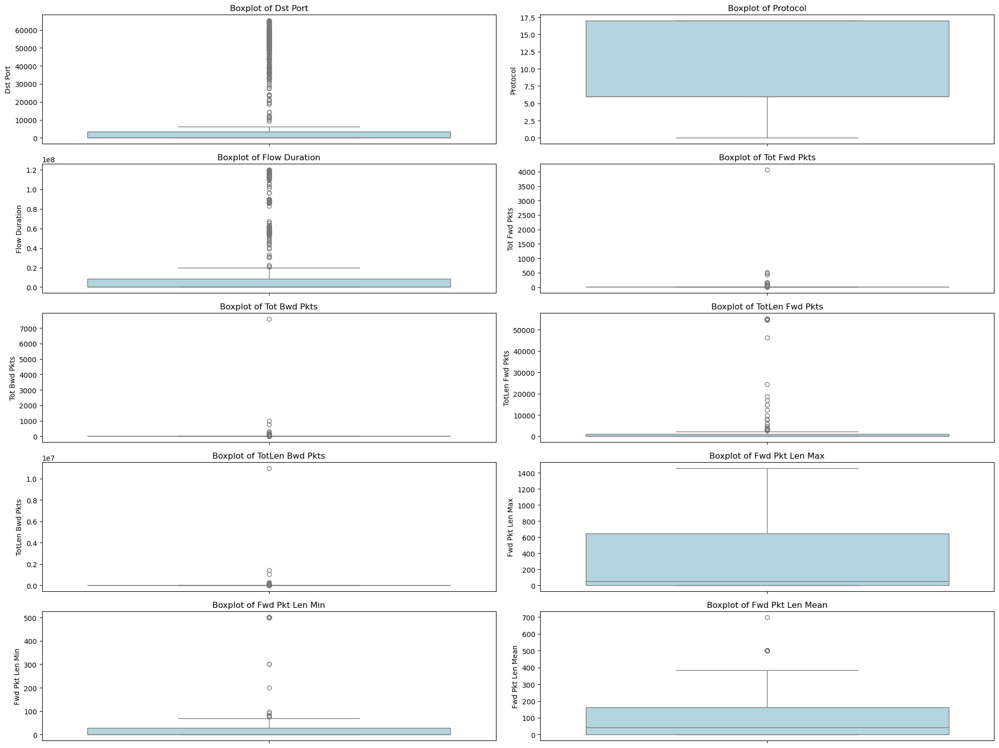

Top 25 important features:
Init Fwd Win Byts: 0.08579386856038368
Dst Port: 0.08153531816346735
Fwd Seg Size Avg: 0.07050067840829209
Fwd Pkt Len Mean: 0.05376433226595597
Bwd Pkts/s: 0.04581378230486108
TotLen Fwd Pkts: 0.04288966831123092
Subflow Fwd Byts: 0.03758352306038479
Flow Byts/s: 0.03582603506415636
Fwd IAT Min: 0.03487990596626376
Pkt Len Mean: 0.0342563222348563
Flow IAT Std: 0.02639596854272943
Flow Duration: 0.02541106390650781
Flow IAT Max: 0.024024563236410435
Flow IAT Mean: 0.023461723649094993
Pkt Size Avg: 0.023343836617309176
Fwd Pkts/s: 0.0187162845468939
Fwd Pkt Len Max: 0.017475843385261418
Fwd IAT Tot: 0.01742048863082722
Subflow Bwd Pkts: 0.016328269814462542
Fwd IAT Mean: 0.016279311687611597
Flow Pkts/s: 0.01606344669540943
Fwd IAT Max: 0.015089819113184246
ECE Flag Cnt: 0.01323324186025787
Fwd Header Len: 0.011702423735858804
Pkt Len Max: 0.01165723737036804


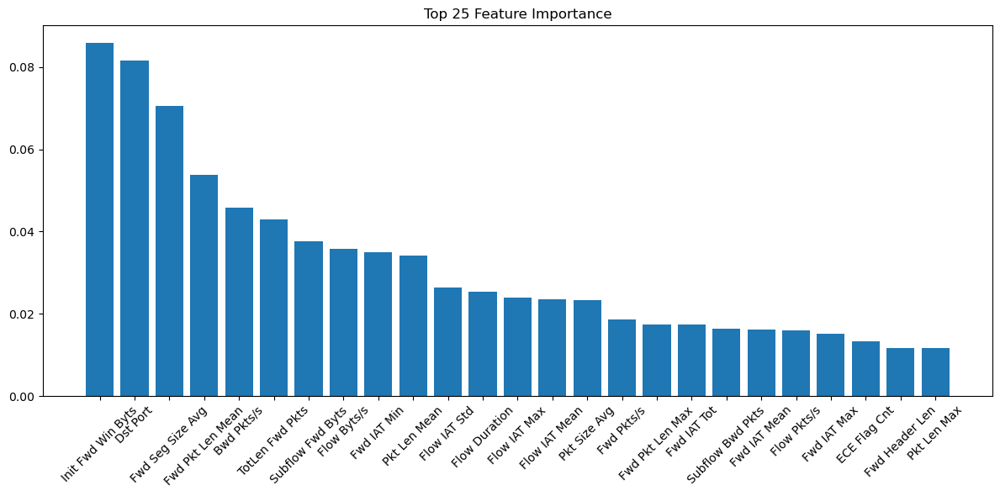

Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 1.1070 - val_loss: 1.1053
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1288 - val_loss: 1.0722
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0319 - val_loss: 1.0341
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9729 - val_loss: 0.9898
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8944 - val_loss: 0.9407
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8753 - val_loss: 0.8897
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9339 - val_loss: 0.8407
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8032 - val_loss: 0.7966
Epoch 9/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7796 - val_loss: 0.7583
Epoch 10/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7640 - val_loss: 0.7268
Epoch 11/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6929 - val_loss: 0.7013
Epoch 12/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6838 - val_l

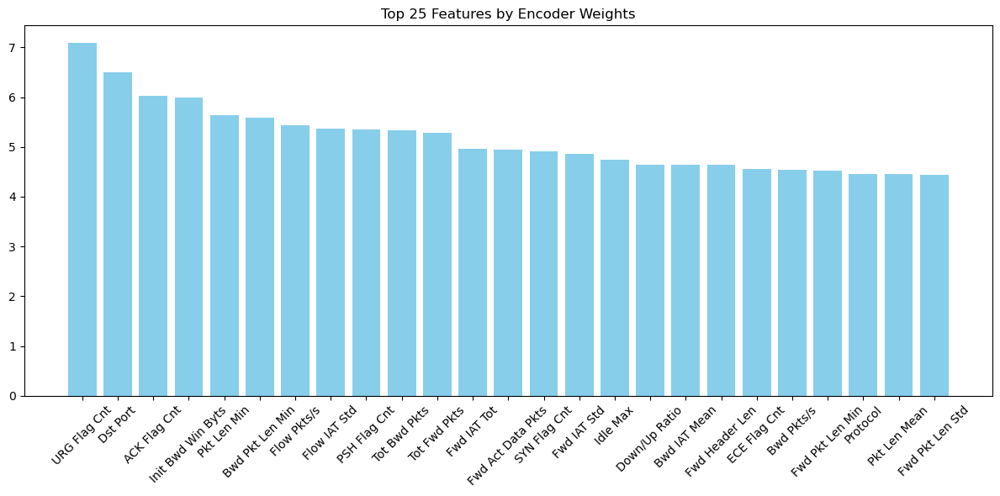

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Encoded features shape: (1658, 20)
Top 25 features by LDA coefficients:
             Feature  Coefficient
35    Fwd Header Len    29.408249
36    Bwd Header Len   -24.557743
62  Subflow Fwd Pkts   -18.363065
3       Tot Fwd Pkts   -18.363065
25       Fwd IAT Min    17.475438
76          Idle Max    15.884626
24       Fwd IAT Max   -14.671898
22      Fwd IAT Mean   -14.362963
73        Active Min    13.916798
20      Flow IAT Min    13.908721
17     Flow IAT Mean   -13.697813
64  Subflow Bwd Pkts    12.969674
4       Tot Bwd Pkts    12.969674
39       Pkt Len Min    11.291088
2      Flow Duration    10.761023
53      Pkt Size Avg   -10.329350
10   Fwd Pkt Len Std    10.089527
23       Fwd IAT Std     9.990494
70       Active Mean    -9.407780
74         Idle Mean    -8.780502
48      ACK Flag Cnt     7.421273
11   Bwd Pkt Len Max     6.661194
40       Pkt Len Max    -6.588284
21       Fwd IAT Tot    -6.353066


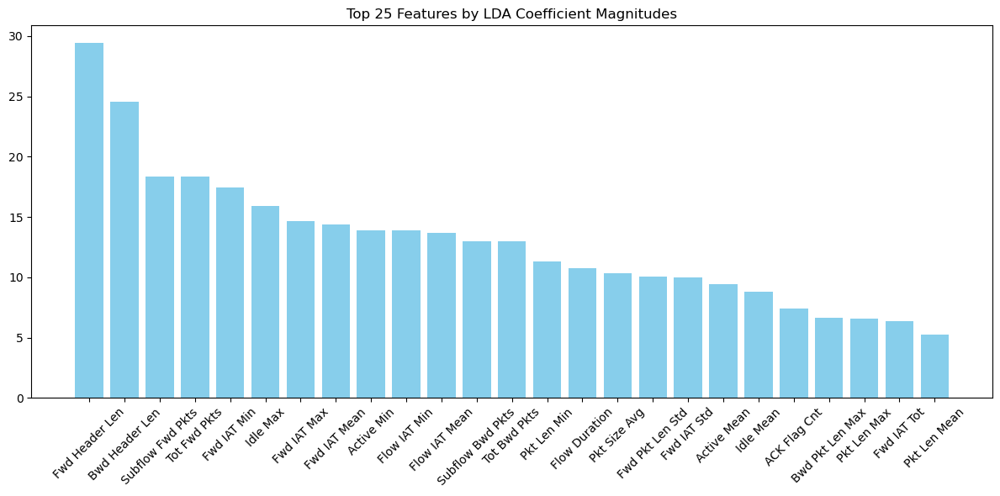

Processing file: Brute Force-XSS.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0       443         6      117744692            17            18   
1        80         6            137             2             0   
2     53774         6             13             1             1   
3        53        17            591             1             1   
4       443         6        5357920             8             6   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0             1253           7853.0              603                0   
1                0              0.0                0                0   
2                0              0.0                0                0   
3               65            193.0               65               65   
4              351           3957.0              194                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean     Active Std  \
0         73.705882  ...                2

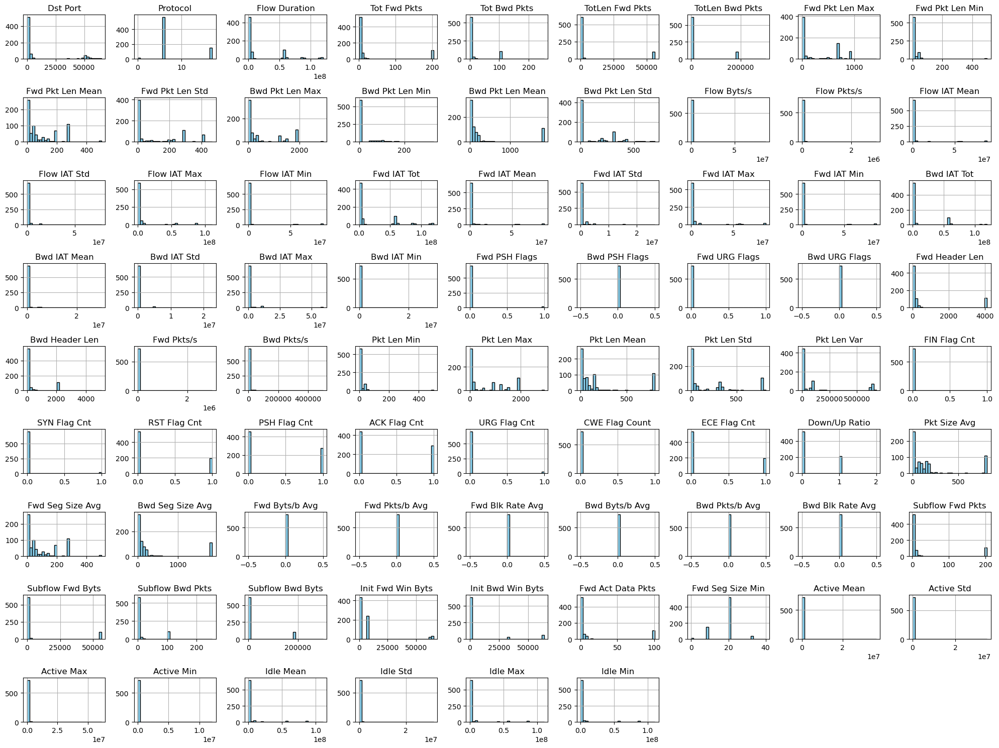

Label
Benign              504
Brute Force -XSS    230
Name: count, dtype: int64


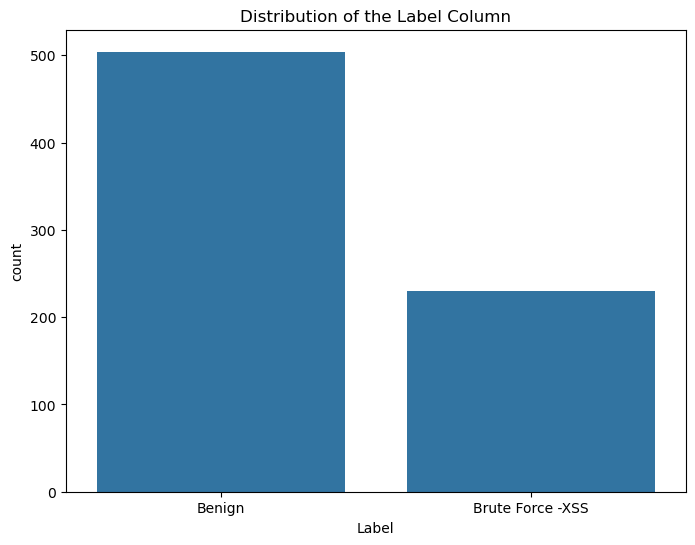

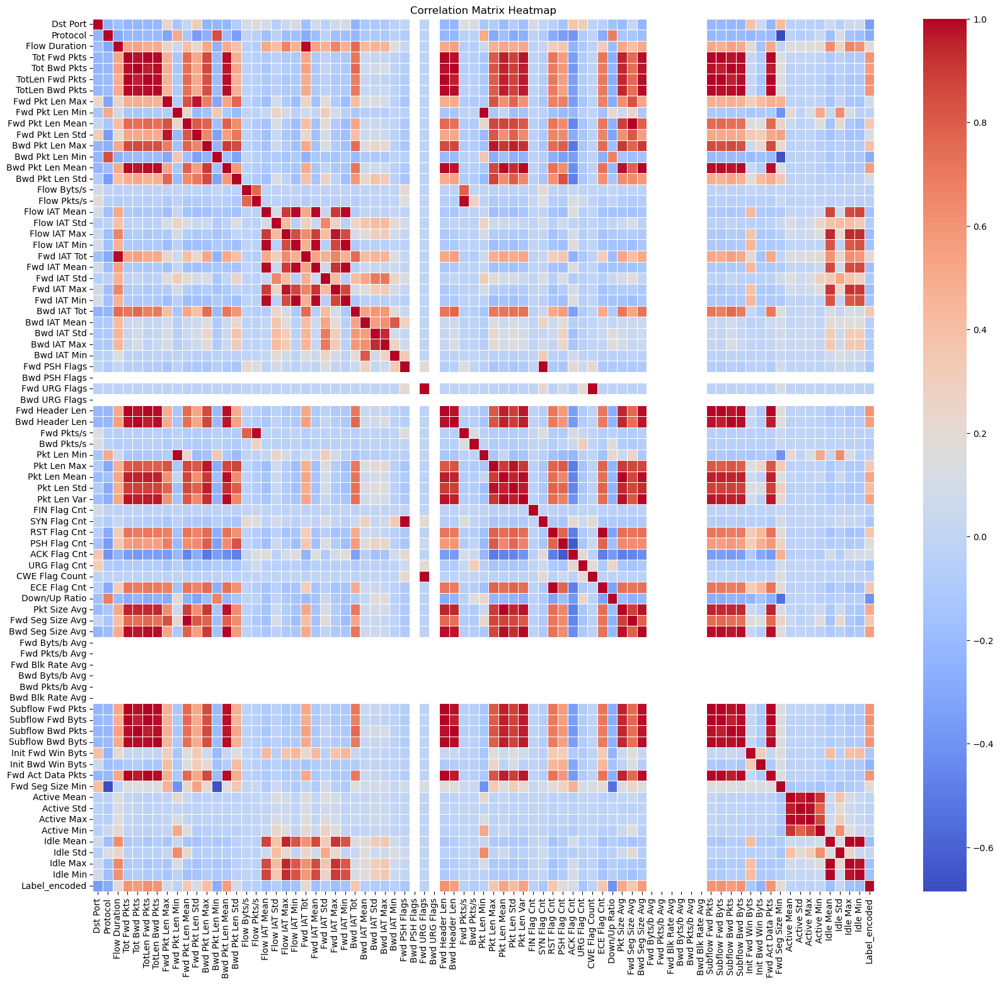

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
TotLen Fwd Pkts      0.612382
Subflow Fwd Byts     0.612382
Tot Fwd Pkts         0.603929
Subflow Fwd Pkts     0.603929
Fwd Header Len       0.603233
TotLen Bwd Pkts      0.602679
Subflow Bwd Byts     0.602679
Fwd Act Data Pkts    0.602502
Bwd Pkt Len Mean     0.562741
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Dst Port           -0.346066
Down/Up Ratio      -0.407779
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


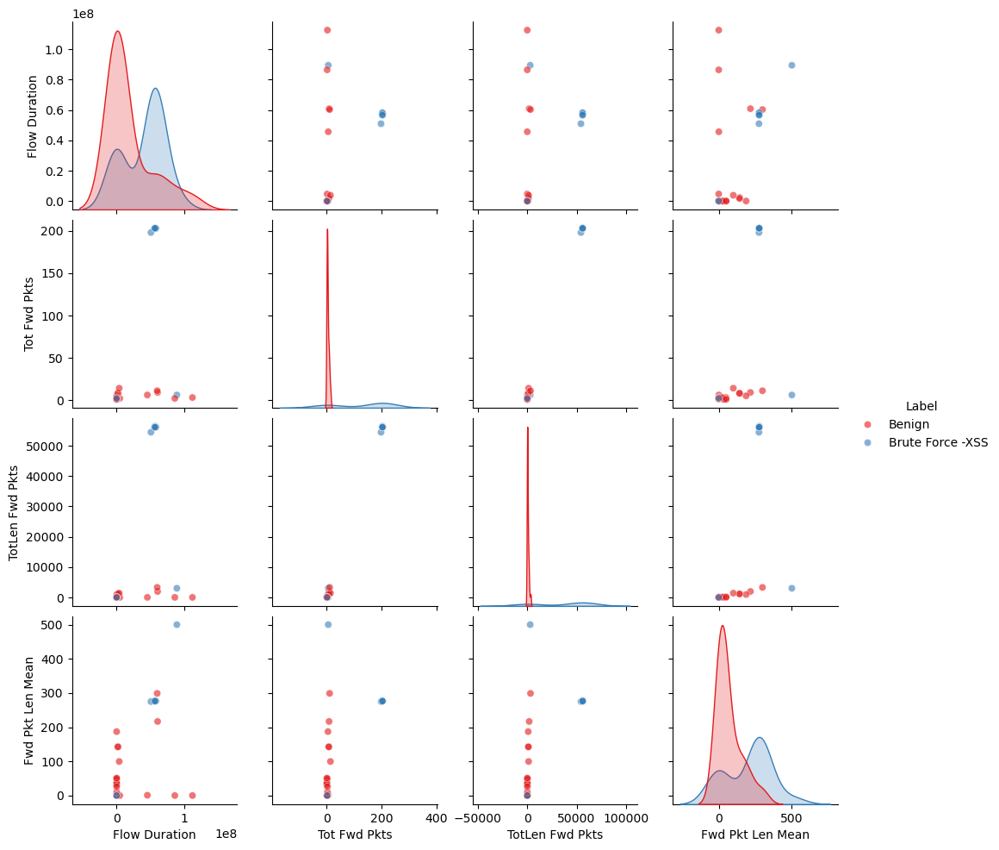

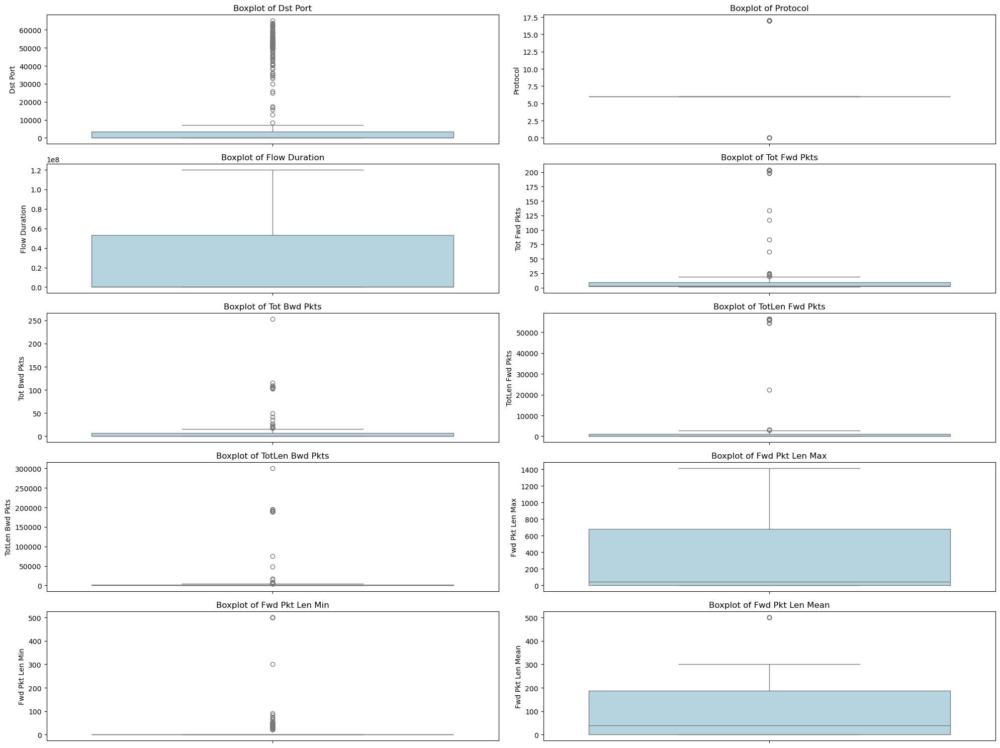

Top 25 important features:
Init Fwd Win Byts: 0.1071263533363431
Fwd Pkt Len Mean: 0.05434880550885858
TotLen Fwd Pkts: 0.05307555039207723
Fwd Seg Size Avg: 0.04964259058202066
Dst Port: 0.0418525415081445
Pkt Len Mean: 0.03629844781545109
Pkt Len Var: 0.033584388944548925
Fwd Header Len: 0.03225920189639106
Subflow Fwd Byts: 0.03198914468762277
Flow IAT Max: 0.031189205982189
Fwd IAT Max: 0.030708248374273838
Bwd Pkt Len Max: 0.02886609921436209
Bwd Seg Size Avg: 0.028855878244695224
Pkt Size Avg: 0.026967751024275666
Flow Duration: 0.026911978621926205
Pkt Len Std: 0.026898609567743686
Bwd Pkts/s: 0.024624785298565068
Pkt Len Max: 0.02322839006319977
Subflow Fwd Pkts: 0.022042983640802483
Bwd Header Len: 0.021700021380925846
Fwd IAT Tot: 0.021236294028186133
Fwd Pkts/s: 0.018379442359820246
Flow IAT Mean: 0.017062755590633968
Fwd IAT Mean: 0.0168210566645941
Fwd Act Data Pkts: 0.016760314588952812


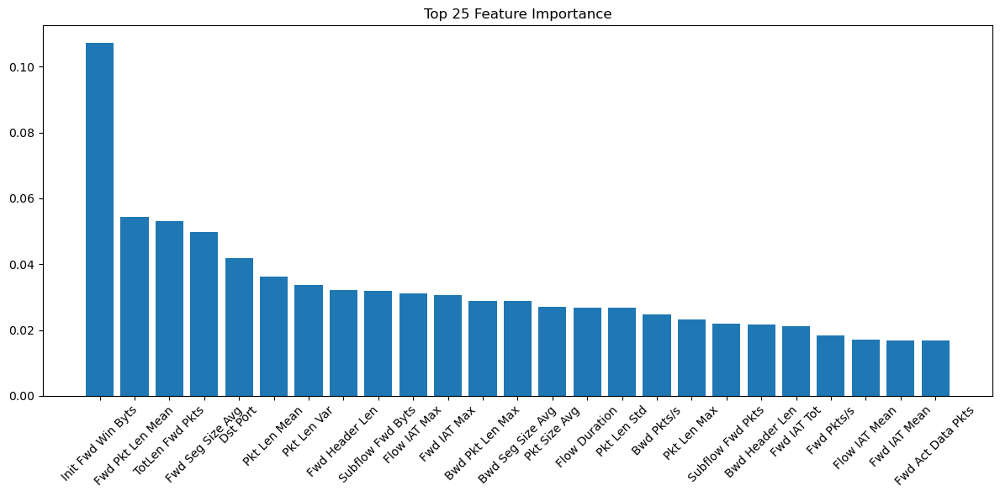

Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 183ms/step - loss: 1.1745 - val_loss: 1.0171
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.2588 - val_loss: 1.0028
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.2341 - val_loss: 0.9886
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.1805 - val_loss: 0.9745
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 1.1031 - val_loss: 0.9597
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.1211 - val_loss: 0.9441
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.0923 - val_loss: 0.9271
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0585 - val_loss: 0.9088
Epoch 9/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 1.1322 - val_loss: 0.8894
Epoch 10/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0537 - val_loss: 0.8690
Epoch 11/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 1.0398 - val_loss: 0.8478
Epoch 12/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.9712 - val_loss: 0.8259
Epoch 13/50

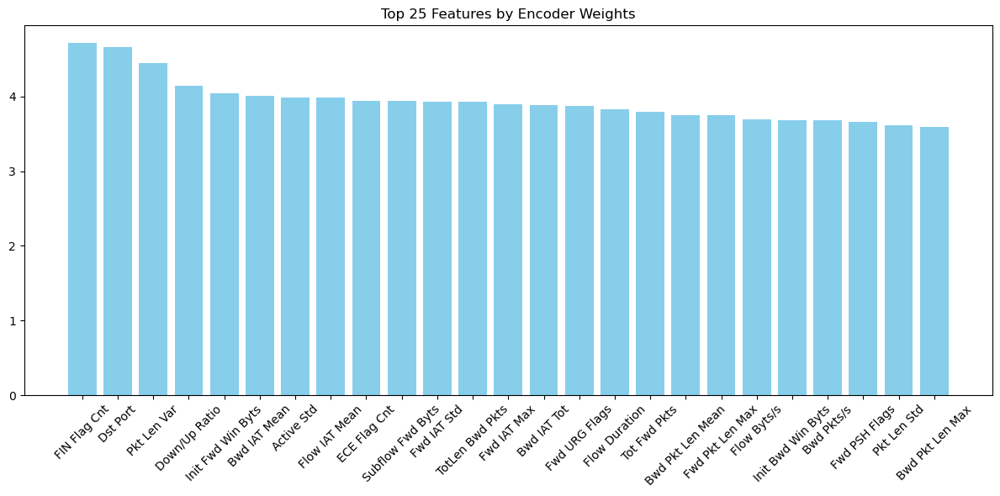

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Encoded features shape: (587, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
70        Active Mean   180.900569
71         Active Std  -180.416471
25        Fwd IAT Min  -127.232595
74          Idle Mean    89.812281
41       Pkt Len Mean    87.039391
73         Active Min   -86.462424
17      Flow IAT Mean    82.476030
76           Idle Max   -77.978014
72         Active Max    74.138362
53       Pkt Size Avg   -71.014886
35     Fwd Header Len    60.187258
4        Tot Bwd Pkts   -49.960043
64   Subflow Bwd Pkts   -49.960043
68  Fwd Act Data Pkts   -40.086400
5     TotLen Fwd Pkts   -36.375425
63   Subflow Fwd Byts   -36.375425
3        Tot Fwd Pkts    35.952052
62   Subflow Fwd Pkts    35.952052
11    Bwd Pkt Len Max    27.568140
65   Subflow Bwd Byts    27.100582
6     TotLen Bwd Pkts    27.100582
20       Flow IAT Min    24.667885
36     Bwd Header Len    24.560205
40        Pk

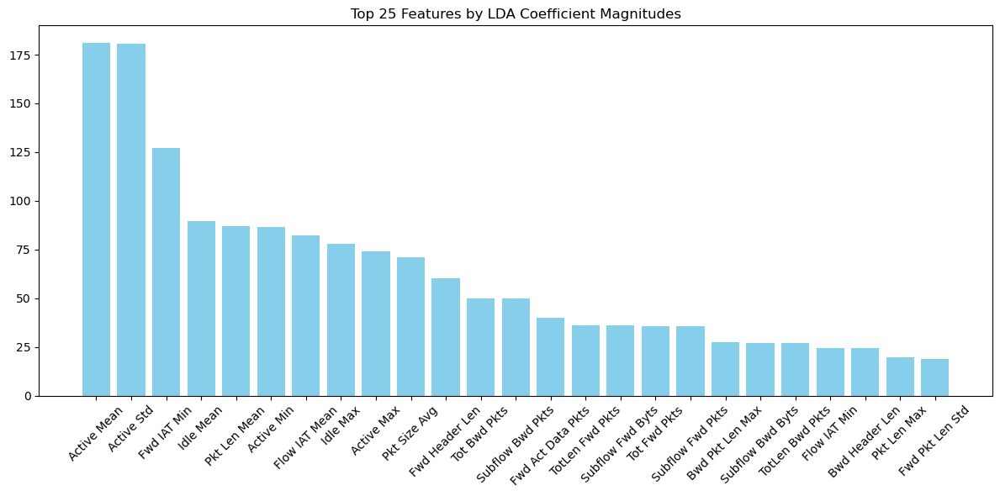

Processing file: DDOS attack-HOIC.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0         0         0      112642712             3             0   
1         0         0      112642760             3             0   
2        22         6        2036636            14            11   
3        22         6        1331500            13            11   
4         0         0      112642748             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0                0              0.0                0                0   
1                0              0.0                0                0   
2             1123           1969.0              648                0   
3             1244           1969.0              736                0   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          0.000000  ...                 0 

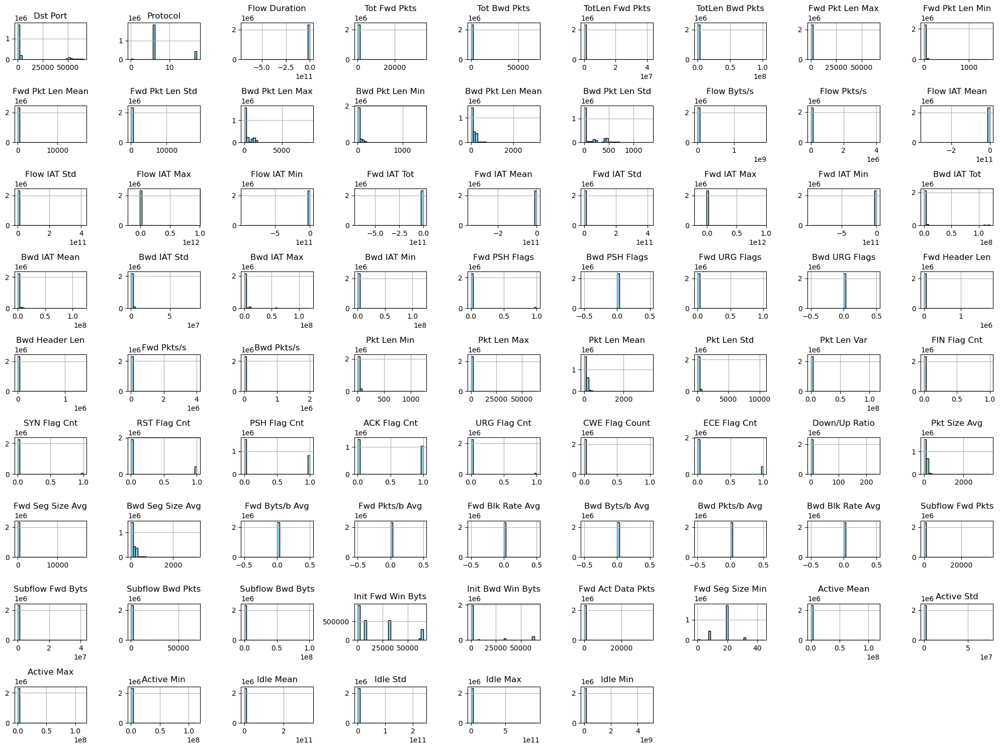

Label
Benign              1645988
DDOS attack-HOIC     686012
Name: count, dtype: int64


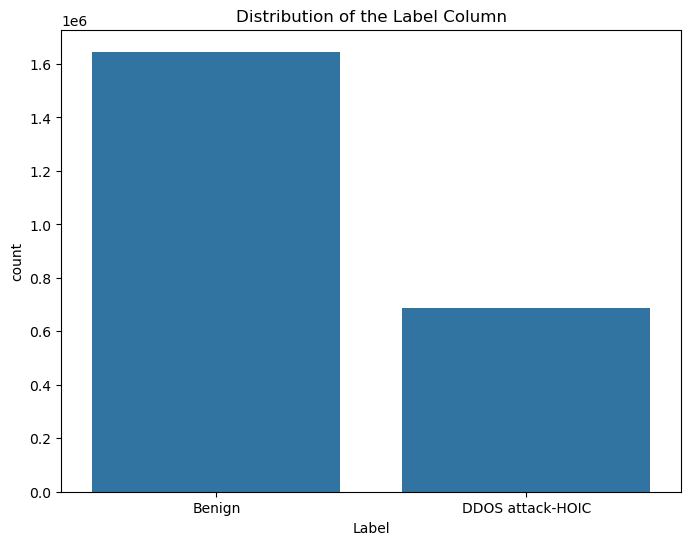

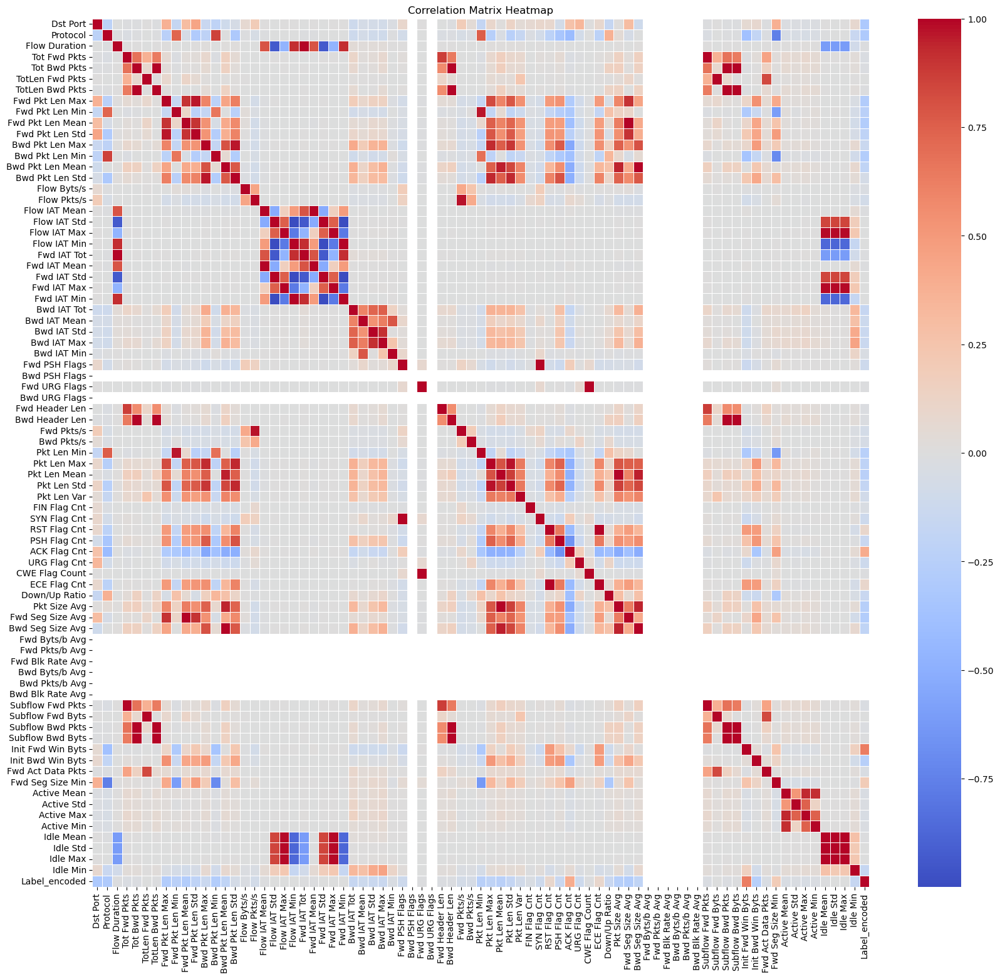

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Init Fwd Win Byts    0.630035
ACK Flag Cnt         0.405553
Fwd Seg Size Min     0.194965
ECE Flag Cnt         0.093730
RST Flag Cnt         0.093726
Idle Std            -0.000850
Flow IAT Std        -0.002090
Flow IAT Min        -0.002192
Fwd IAT Min         -0.002238
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Protocol           -0.299007
Dst Port           -0.314943
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


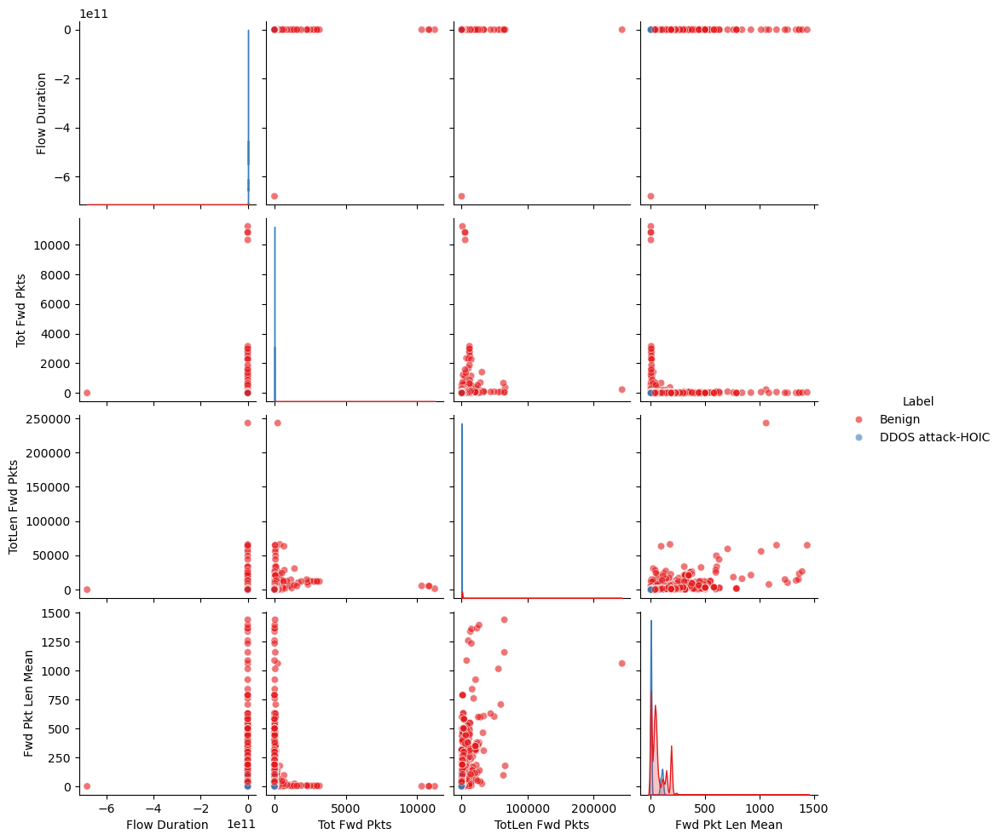

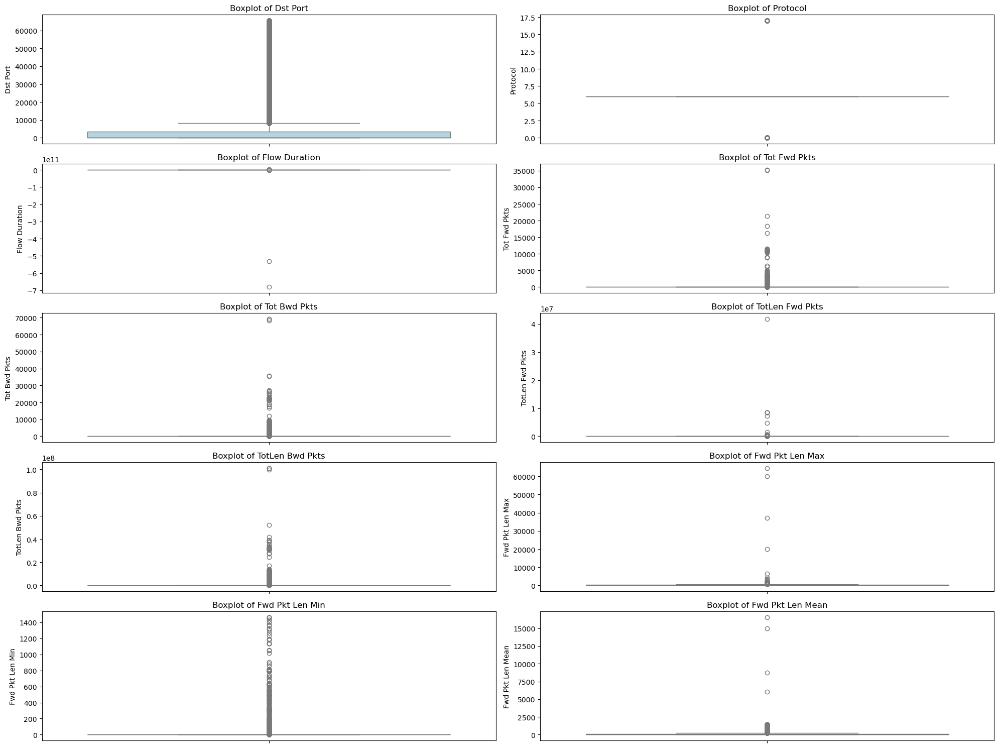

Top 25 important features:
Init Fwd Win Byts: 0.21382304934233393
Fwd IAT Min: 0.11622365232065693
Dst Port: 0.07698756038588951
Fwd IAT Max: 0.04755710103942198
Flow IAT Min: 0.04504700685524836
Fwd IAT Tot: 0.04274756437527219
Flow Duration: 0.03420938652452507
Fwd Pkts/s: 0.02912756869108852
Fwd IAT Mean: 0.026275194213074827
Flow IAT Max: 0.025138477966244653
Fwd Header Len: 0.0246393473896545
Tot Bwd Pkts: 0.018034887766887584
Subflow Bwd Pkts: 0.017270903695109585
Bwd Pkts/s: 0.016137858872608598
Fwd Pkt Len Mean: 0.01531586979779933
Subflow Fwd Pkts: 0.014784387274361939
Flow Pkts/s: 0.014621703137500584
Pkt Len Mean: 0.014142765300497281
TotLen Fwd Pkts: 0.013587419316791739
TotLen Bwd Pkts: 0.013289242585948918
Pkt Len Max: 0.011896496063802801
Bwd Header Len: 0.01130309967627823
Pkt Len Var: 0.010453542562707467
Bwd Seg Size Avg: 0.010350642926547542
Subflow Fwd Byts: 0.008776016909469898


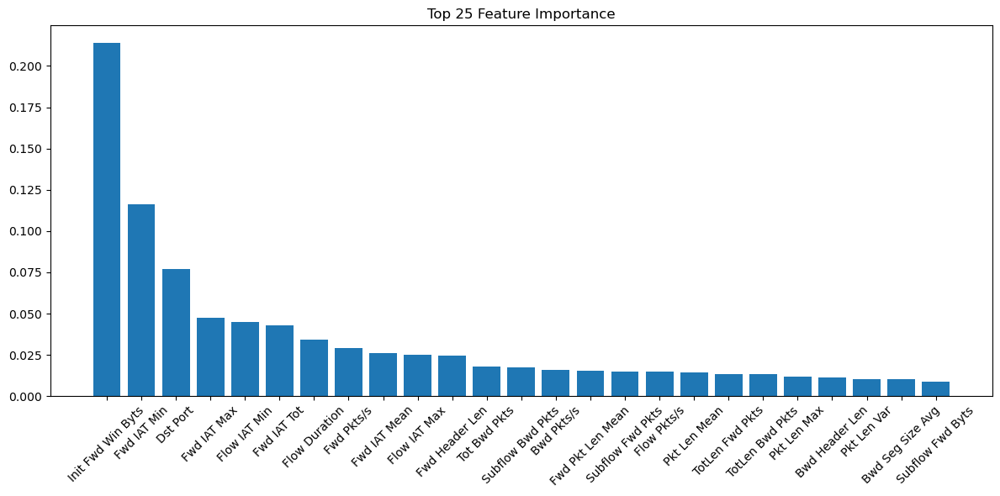

Epoch 1/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 15s 1ms/step - loss: 2.1127 - val_loss: 0.4908
Epoch 2/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 0.5381 - val_loss: 0.4901
Epoch 3/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 11s 976us/step - loss: 0.6304 - val_loss: 0.4899
Epoch 4/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.8531 - val_loss: 0.4895
Epoch 5/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 0.7138 - val_loss: 0.4895
Epoch 6/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 0.8145 - val_loss: 0.4895
Epoch 7/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 0.6104 - val_loss: 0.4894
Epoch 8/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 0.5804 - val_loss: 0.4894
Epoch 9/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.5722 - val_loss: 0.4893
Epoch 10/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 0.6367 - val_loss: 0.4893
Epoch 11/50
11660/11660 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.8189 - val_loss: 0.

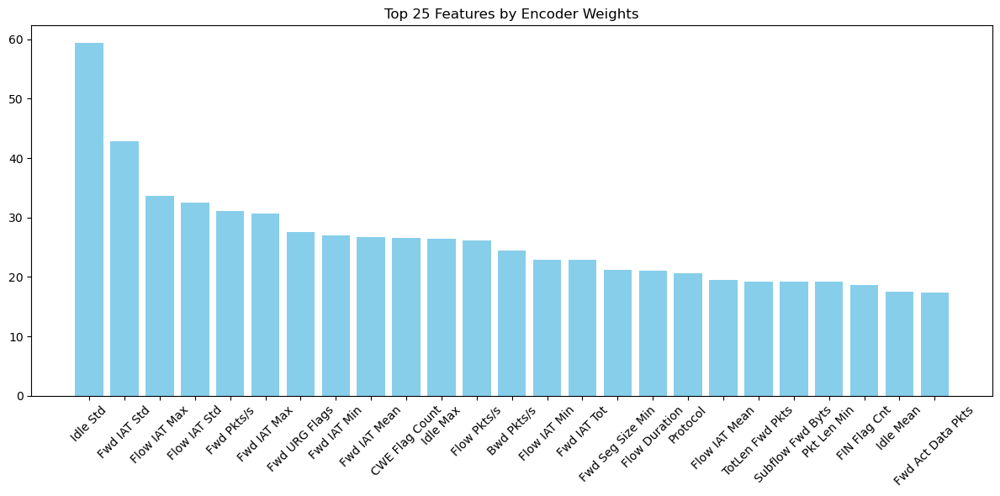

58300/58300 ━━━━━━━━━━━━━━━━━━━━ 46s 784us/step
14575/14575 ━━━━━━━━━━━━━━━━━━━━ 10s 664us/step
Encoded features shape: (1865600, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
20       Flow IAT Min  -619.302418
25        Fwd IAT Min   523.498639
23        Fwd IAT Std   224.161283
18       Flow IAT Std  -119.344781
76           Idle Max   113.288571
75           Idle Std  -107.866065
19       Flow IAT Max   -88.543752
24        Fwd IAT Max   -83.902558
65   Subflow Bwd Byts   -63.907679
6     TotLen Bwd Pkts    59.449058
21        Fwd IAT Tot    46.343723
66  Init Fwd Win Byts    12.767117
11    Bwd Pkt Len Max    12.484269
22       Fwd IAT Mean   -12.090631
17      Flow IAT Mean    11.863194
47       PSH Flag Cnt   -11.188541
40        Pkt Len Max    -9.859414
74          Idle Mean     6.980285
2       Flow Duration    -6.960219
77           Idle Min    -5.722096
0            Dst Port    -5.568355
1            Protocol    -4.664840
26        Bwd IAT Tot   

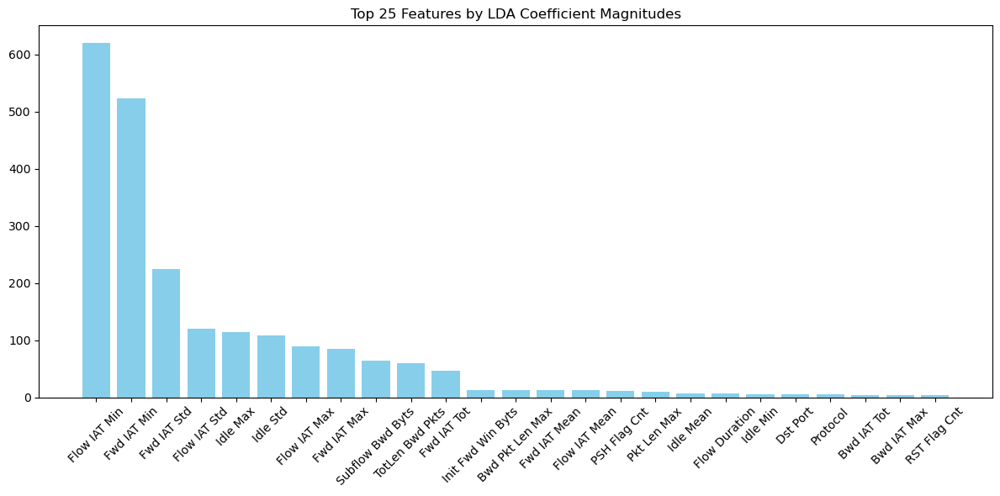

Processing file: DDOS attack-LOIC-UDP.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        80        17      114000070            11             0   
1        80        17      118031920            15             0   
2        80         6             93             2             0   
3        53        17            284             1             1   
4        53        17           1295             1             1   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0              352              0.0               32               32   
1              480              0.0               32               32   
2                0              0.0                0                0   
3               41             57.0               41               41   
4               36             97.0               36               36   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0              32.0  ...               

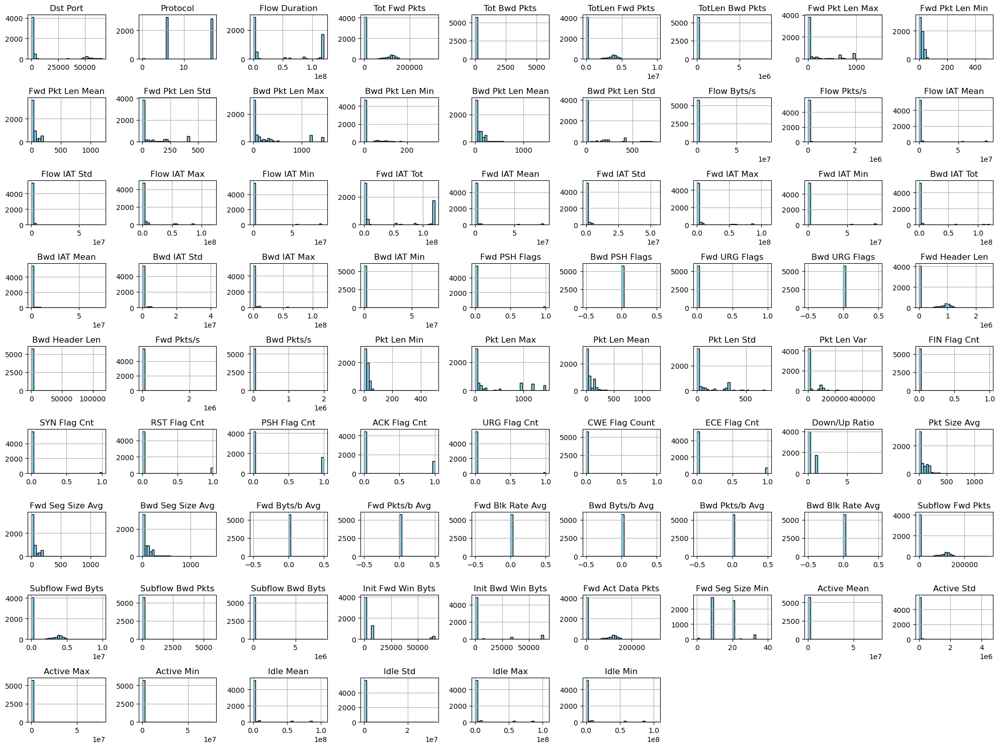

Label
Benign                  4054
DDOS attack-LOIC-UDP    1730
Name: count, dtype: int64


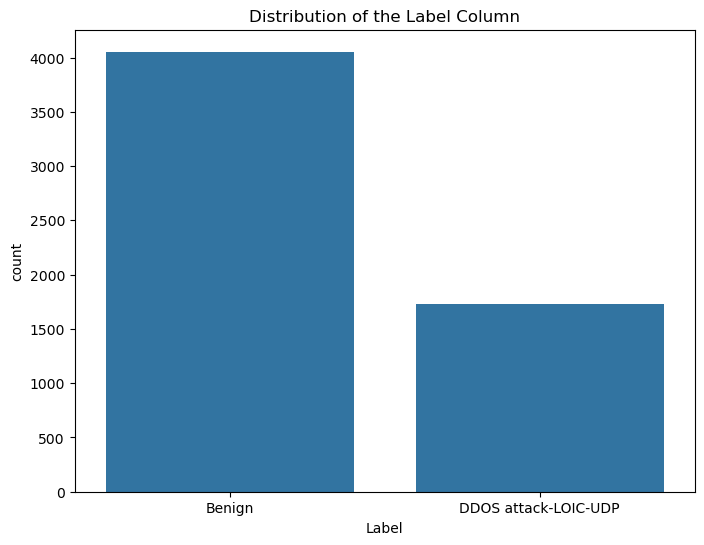

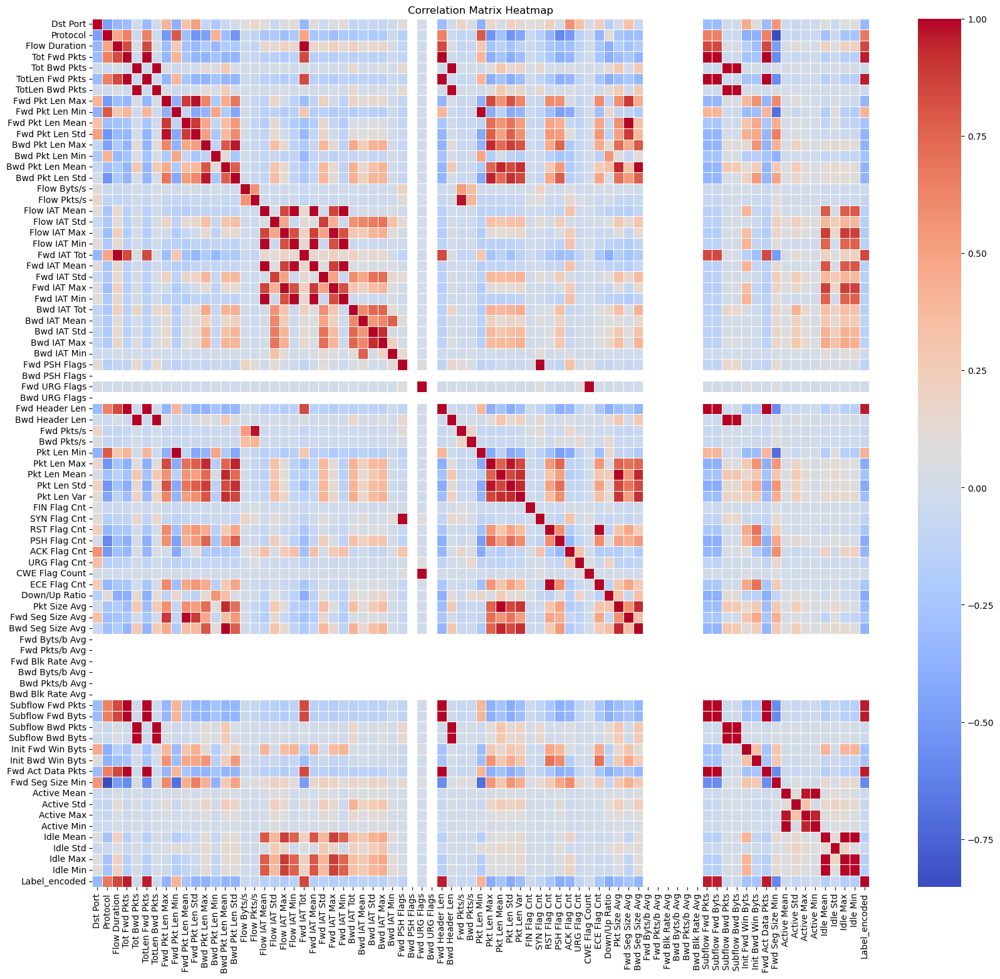

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Fwd Act Data Pkts    0.961004
Tot Fwd Pkts         0.961000
Subflow Fwd Pkts     0.961000
Subflow Fwd Byts     0.960997
TotLen Fwd Pkts      0.960997
Fwd Header Len       0.960987
Fwd IAT Tot          0.854294
Flow Duration        0.852385
Protocol             0.671659
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Pkt Len Std        -0.422384
Fwd Seg Size Min   -0.597832
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


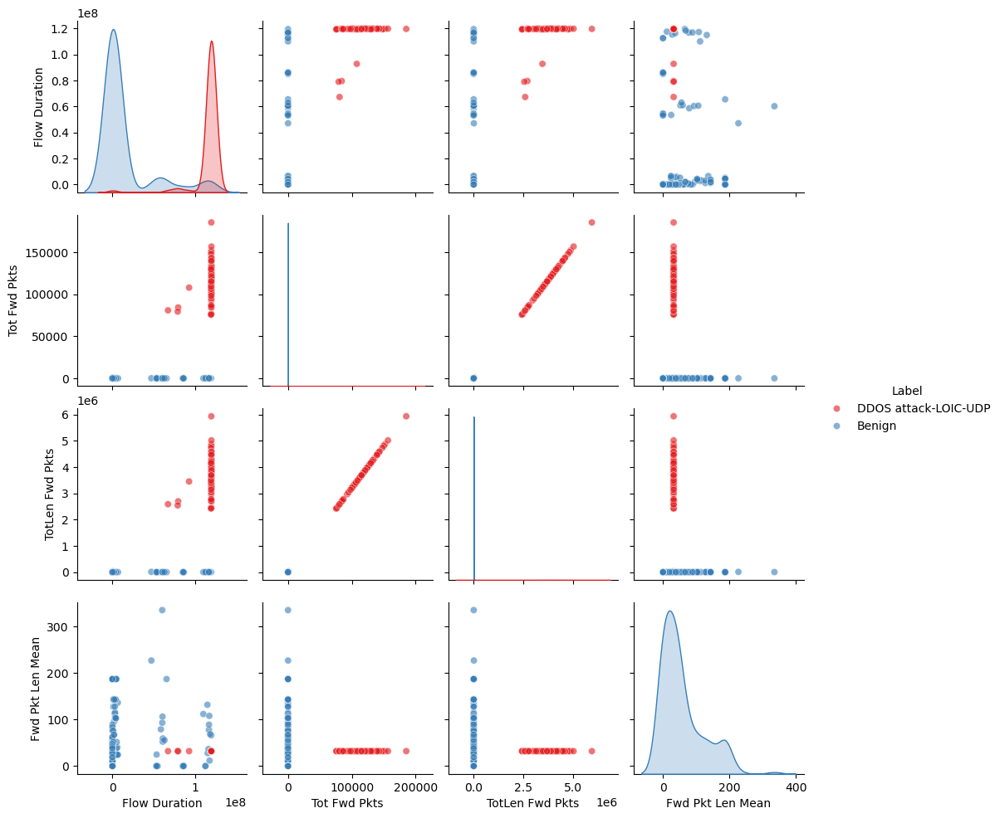

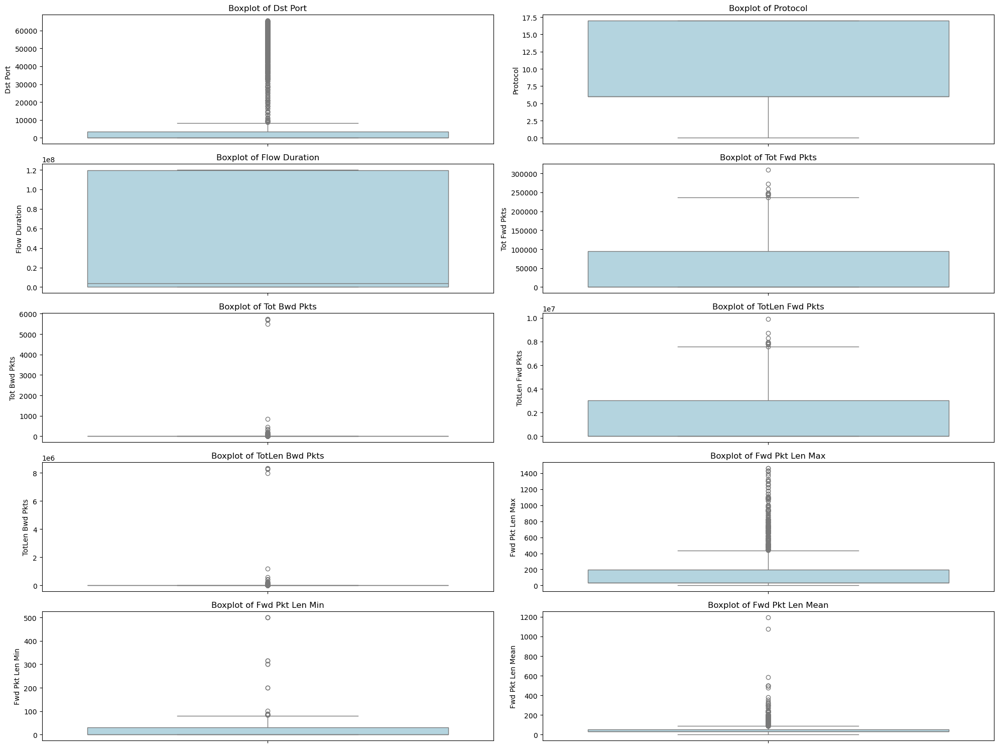

Top 25 important features:
Fwd Header Len: 0.11735201051172092
Subflow Fwd Pkts: 0.11580892014471003
TotLen Fwd Pkts: 0.10652000662111959
Subflow Fwd Byts: 0.09956393839809881
Fwd Act Data Pkts: 0.09813599178584782
Tot Fwd Pkts: 0.08572350998279166
Fwd IAT Tot: 0.06255696029032248
Fwd Pkt Len Min: 0.03205339703978912
Bwd Pkts/s: 0.026602031602808992
Pkt Len Min: 0.024982300573679467
Flow IAT Min: 0.020382199098452333
Subflow Bwd Pkts: 0.01880484194525364
Pkt Len Mean: 0.018460189732932425
Tot Bwd Pkts: 0.015796811911685187
Fwd IAT Std: 0.014378402198245897
Protocol: 0.013903714701113188
Bwd Pkt Len Mean: 0.013128180636150464
Pkt Len Std: 0.00997226869378892
Pkt Len Var: 0.009657675355881475
Fwd IAT Max: 0.009250623488588466
Bwd Pkt Len Max: 0.009125057415586203
Init Fwd Win Byts: 0.00872513678676112
Fwd Pkt Len Mean: 0.008645133335623731
Flow Duration: 0.008493787308123064
Fwd IAT Min: 0.00796775632805521


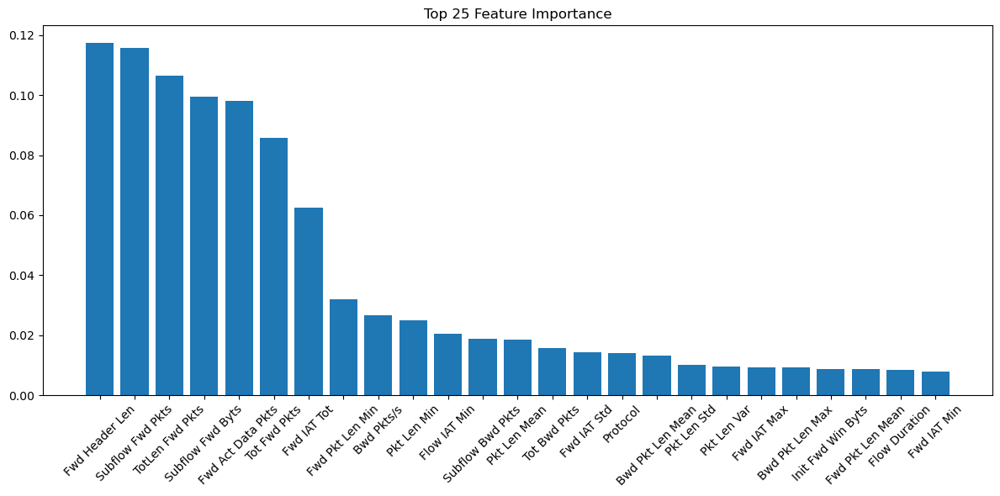

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 1.1918 - val_loss: 0.9971
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1682 - val_loss: 0.8900
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9952 - val_loss: 0.7591
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8926 - val_loss: 0.6606
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7227 - val_loss: 0.6054
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7882 - val_loss: 0.5751
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6217 - val_loss: 0.5577
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5834 - val_loss: 0.5463
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6305 - val_loss: 0.5389
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5725 - val_loss: 0.5335
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5936 - val_loss: 0.5295
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6467 - val_l

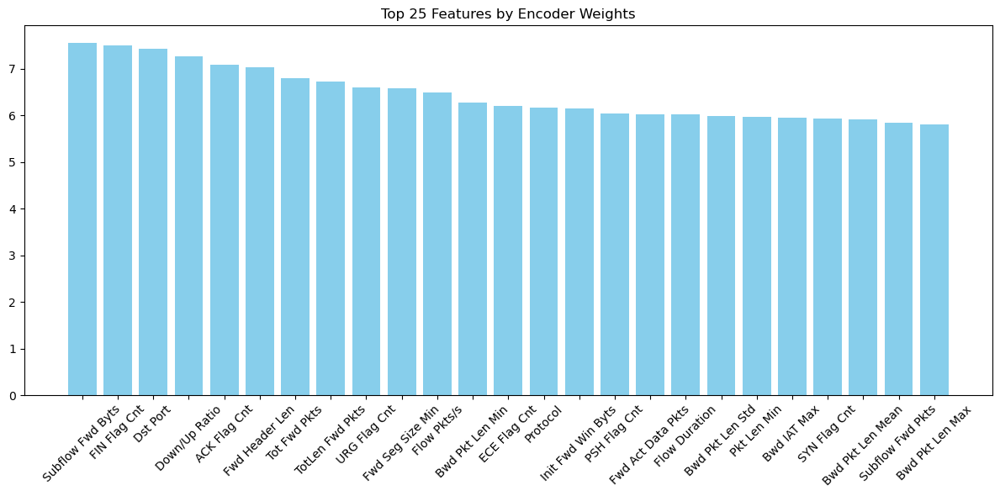

145/145 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
37/37 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Encoded features shape: (4627, 20)
Top 25 features by LDA coefficients:
              Feature   Coefficient
68  Fwd Act Data Pkts  24991.540398
3        Tot Fwd Pkts  -9361.668386
62   Subflow Fwd Pkts  -9361.668386
35     Fwd Header Len  -3821.787383
5     TotLen Fwd Pkts  -1217.025687
63   Subflow Fwd Byts  -1217.025687
20       Flow IAT Min    195.809123
17      Flow IAT Mean   -188.047066
2       Flow Duration    150.491106
41       Pkt Len Mean    128.909284
53       Pkt Size Avg   -122.813659
21        Fwd IAT Tot    -95.008689
36     Bwd Header Len     69.229700
19       Flow IAT Max    -64.017534
4        Tot Bwd Pkts    -41.406908
64   Subflow Bwd Pkts    -41.406908
42        Pkt Len Std     37.152224
24        Fwd IAT Max     29.795349
18       Flow IAT Std     28.781936
25        Fwd IAT Min     28.348282
65   Subflow Bwd Byts     26.913188
6     TotLen Bwd Pkts     26.913188
1            Protoco

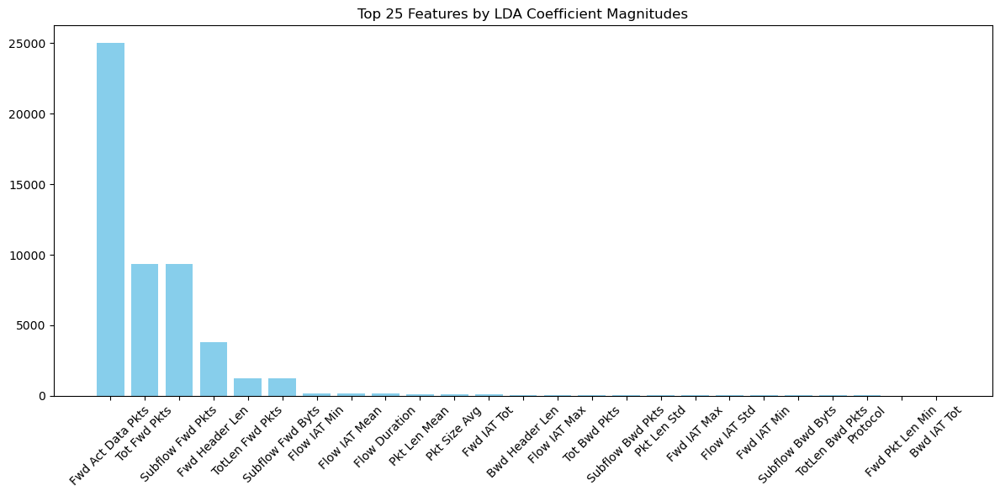

Processing file: DDoS attacks-LOIC-HTTP.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0         0         0      112642760             3             0   
1        22         6         962353            11            11   
2        22         6         962833            11            11   
3         0         0      112642938             3             0   
4         0         0      112640521             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0                0              0.0                0                0   
1             1252           1969.0              736                0   
2             1235           1969.0              736                0   
3                0              0.0                0                0   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          0.000000  ...             

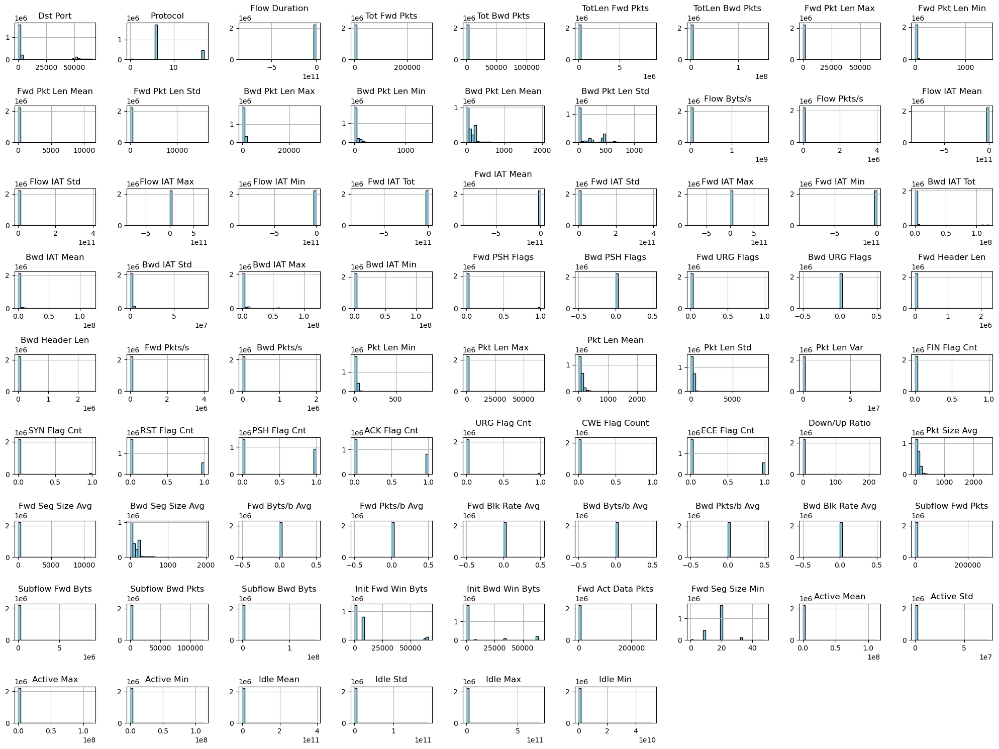

Label
Benign                    1646164
DDoS attacks-LOIC-HTTP     576191
Name: count, dtype: int64


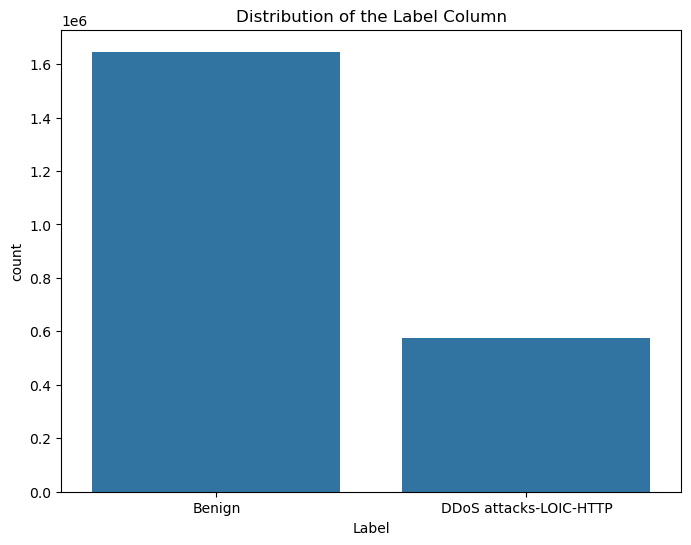

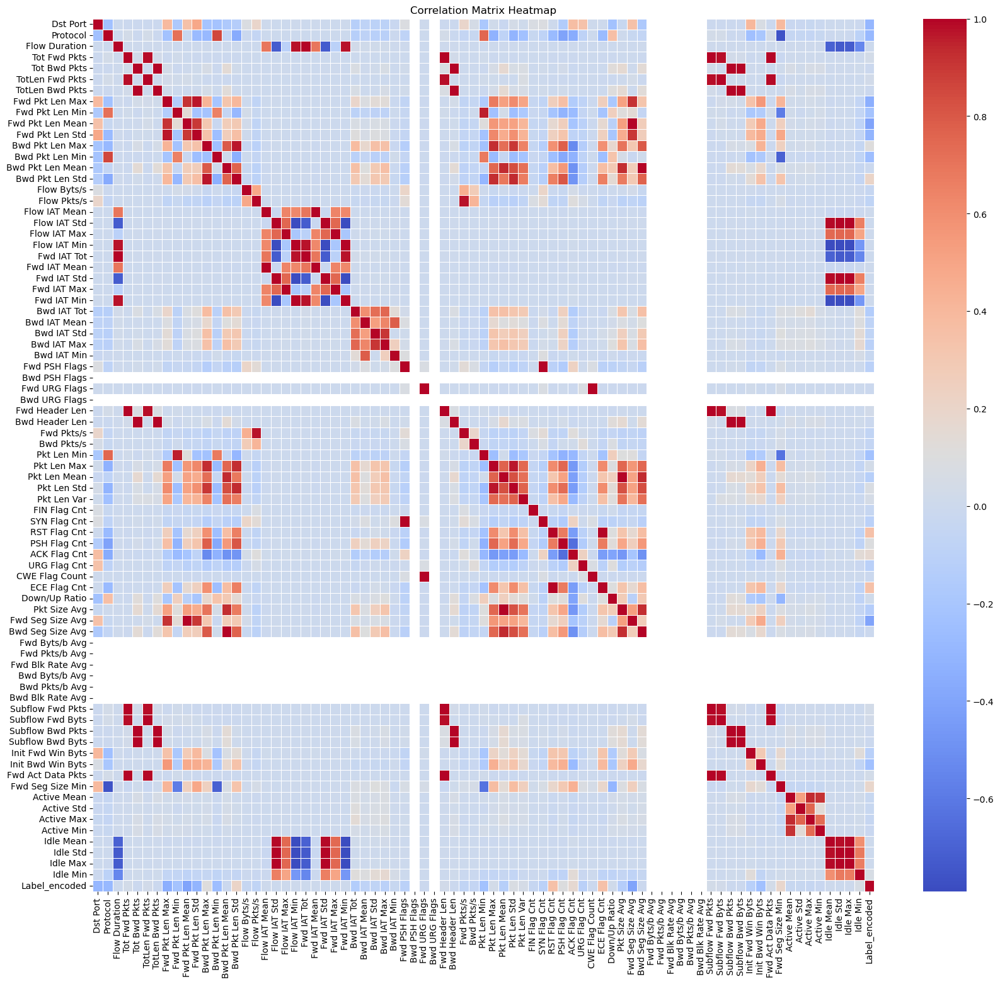

Top 10 features most positively correlated with the Label:
Label_encoded       1.000000
ECE Flag Cnt        0.347962
RST Flag Cnt        0.347960
Bwd Pkt Len Std     0.209112
Fwd Seg Size Min    0.182891
ACK Flag Cnt        0.162566
Bwd Pkt Len Max     0.106956
PSH Flag Cnt        0.096903
Pkt Len Std         0.076214
Idle Min            0.060583
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Fwd Pkt Len Mean   -0.400563
Fwd Seg Size Avg   -0.400563
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


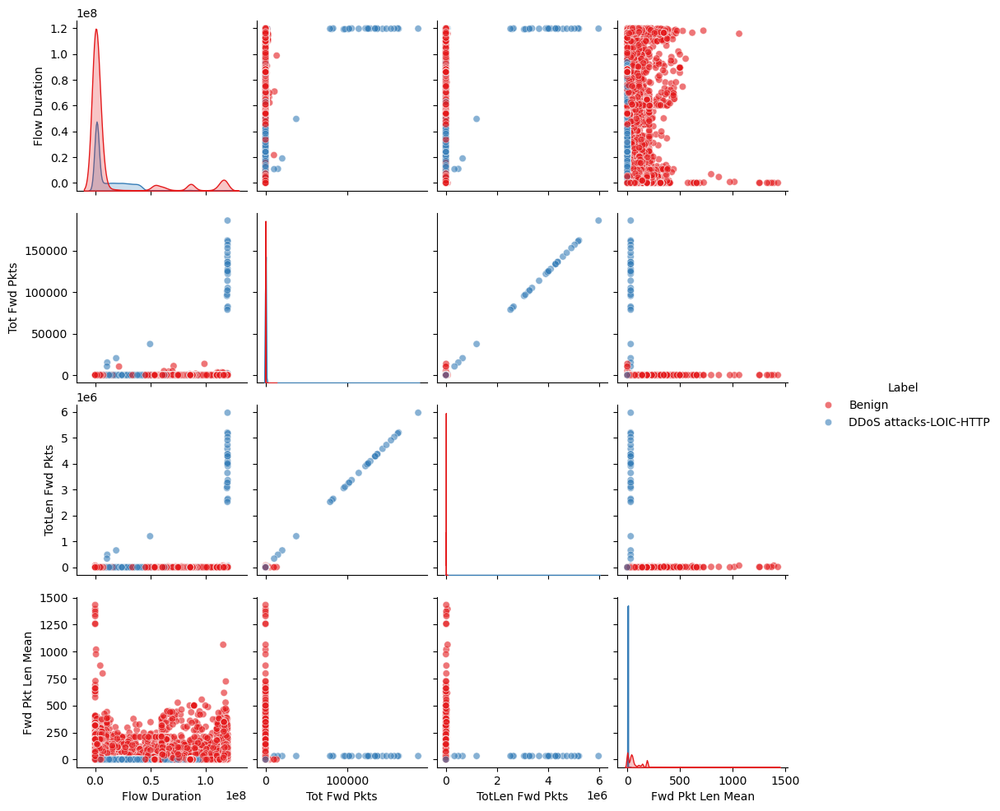

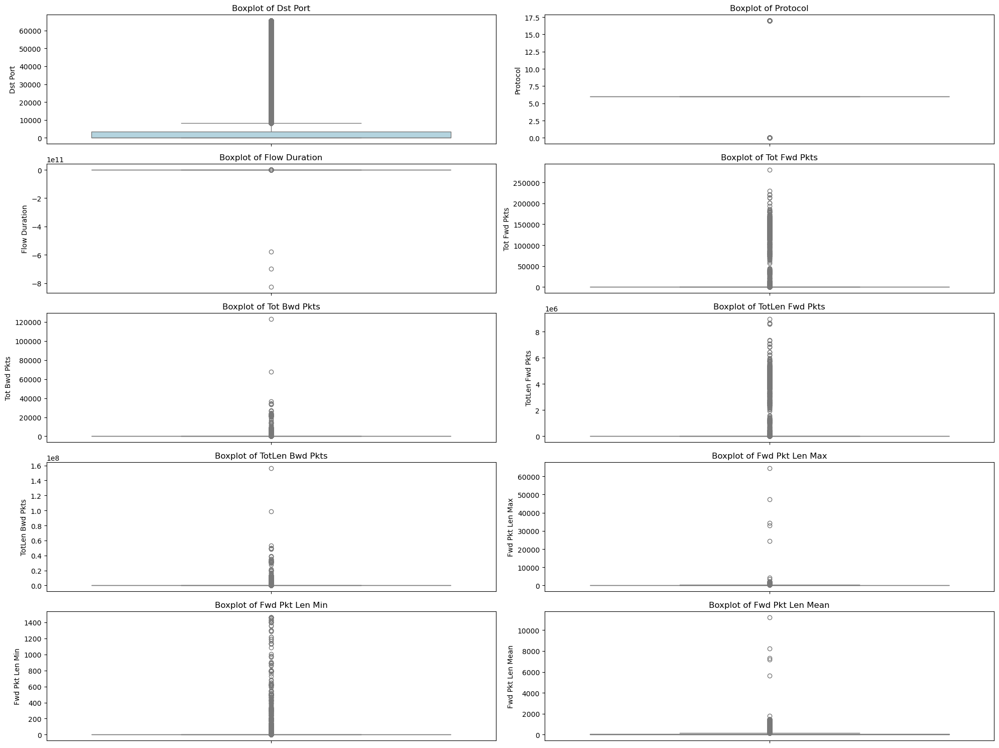

Top 25 important features:
Dst Port: 0.0942146339880326
TotLen Fwd Pkts: 0.0739514927916193
Fwd Pkt Len Max: 0.06442215332146907
Fwd Seg Size Avg: 0.05812090854117937
Fwd Pkts/s: 0.056802683102364686
Fwd Pkt Len Mean: 0.051573310415861225
Subflow Fwd Byts: 0.05019795951932656
Flow Duration: 0.045380243962898116
Init Fwd Win Byts: 0.043838231921781275
Flow IAT Max: 0.038093360137722895
Fwd IAT Tot: 0.03394557081656767
Flow Pkts/s: 0.0321426550994329
Flow IAT Min: 0.031234516455342403
Fwd IAT Max: 0.030438982973465048
Fwd Header Len: 0.0300923639172772
Flow IAT Mean: 0.02718730239820605
Fwd IAT Min: 0.022693507554542625
Fwd IAT Mean: 0.0173290671664373
Bwd Pkt Len Std: 0.017118103460922175
Subflow Fwd Pkts: 0.015282484561886656
Fwd Pkt Len Std: 0.0121781514463827
Idle Min: 0.011838084946494033
Pkt Len Var: 0.010461155802071447
Idle Mean: 0.010365688403331358
Bwd Header Len: 0.009942816774438075


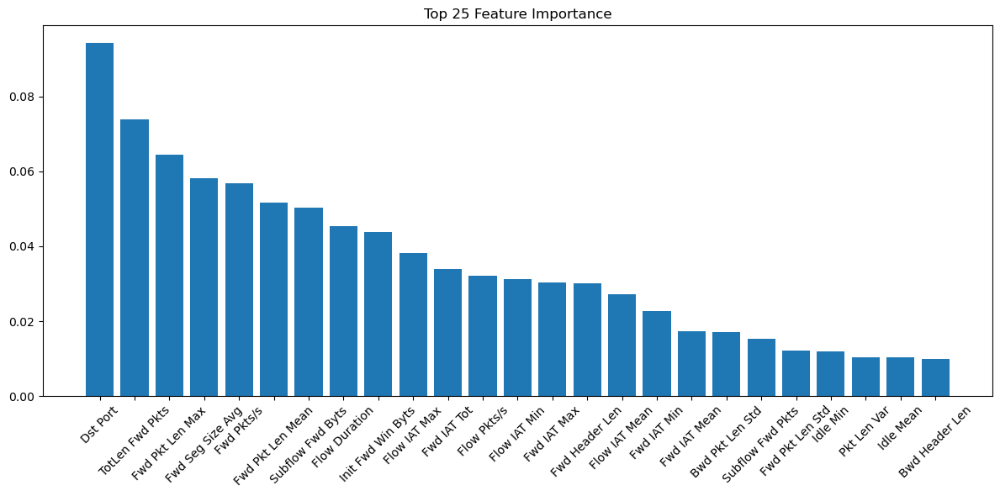

Epoch 1/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 16s 1ms/step - loss: 0.5881 - val_loss: 0.8507
Epoch 2/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.6258 - val_loss: 0.8495
Epoch 3/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.7507 - val_loss: 0.8490
Epoch 4/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.5459 - val_loss: 0.8489
Epoch 5/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.5739 - val_loss: 0.8489
Epoch 6/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 1.1427 - val_loss: 0.8489
Epoch 7/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.6714 - val_loss: 0.8489
Epoch 8/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 11s 1ms/step - loss: 0.9205 - val_loss: 0.8488
Epoch 9/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.6365 - val_loss: 0.8488
Epoch 10/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.9673 - val_loss: 0.8488
Epoch 11/50
11112/11112 ━━━━━━━━━━━━━━━━━━━━ 12s 1ms/step - loss: 0.6953 - val_loss: 0.84

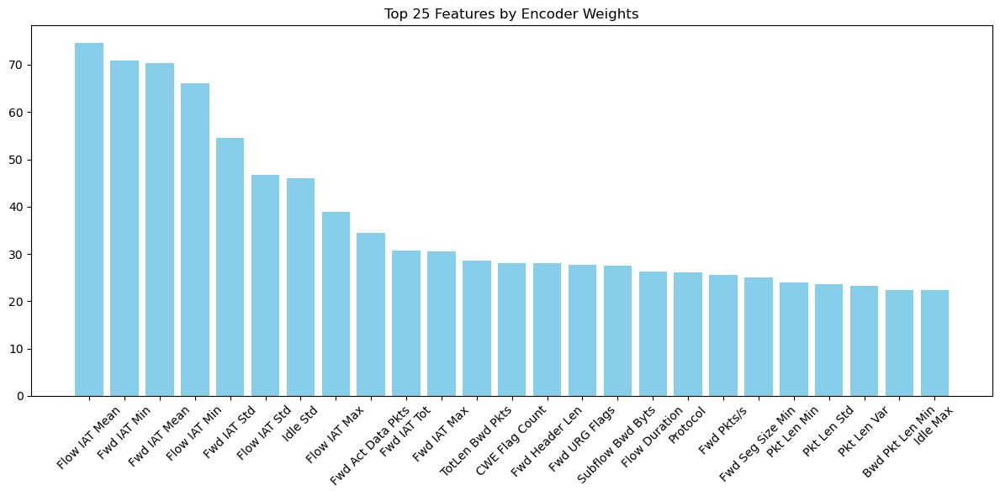

55559/55559 ━━━━━━━━━━━━━━━━━━━━ 44s 797us/step
13890/13890 ━━━━━━━━━━━━━━━━━━━━ 10s 683us/step
Encoded features shape: (1777884, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
22       Fwd IAT Mean  -566.146331
25        Fwd IAT Min   557.788816
20       Flow IAT Min  -325.521025
17      Flow IAT Mean   249.686598
18       Flow IAT Std  -167.027778
19       Flow IAT Max   163.219276
2       Flow Duration  -106.093227
76           Idle Max    79.052732
24        Fwd IAT Max    59.881859
23        Fwd IAT Std    59.874806
21        Fwd IAT Tot    41.079573
75           Idle Std   -23.847056
65   Subflow Bwd Byts    20.533907
6     TotLen Bwd Pkts   -19.427725
74          Idle Mean    16.305044
11    Bwd Pkt Len Max    -8.888618
42        Pkt Len Std     8.612233
48       ACK Flag Cnt     7.277448
77           Idle Min    -6.503880
40        Pkt Len Max     4.753948
47       PSH Flag Cnt     4.545168
68  Fwd Act Data Pkts    -4.523623
53       Pkt Size Avg   

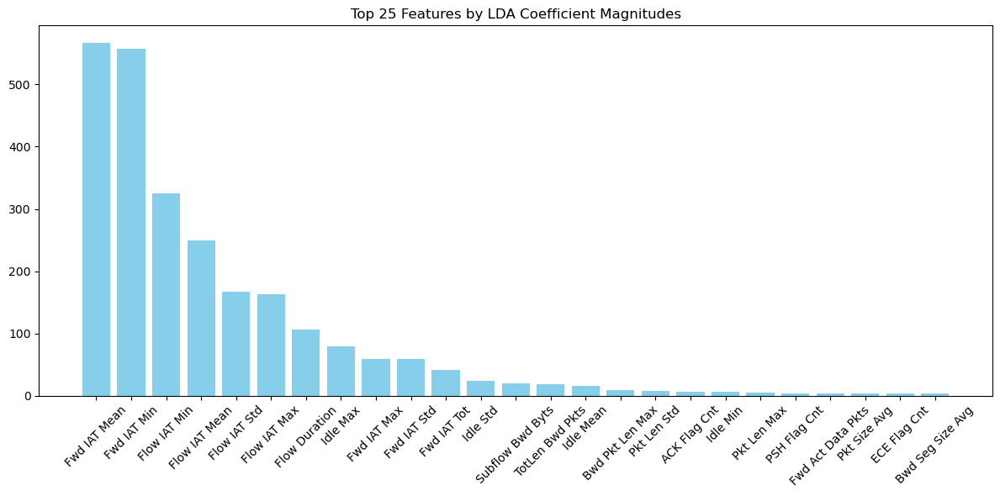

Processing file: DoS attacks-GoldenEye.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0         0         0      112641101             3             0   
1        22         6        6990739            15            11   
2     57481         6       11095663             1             3   
3     63218         6        1376526             5             2   
4         0         0      112639990             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0                0              0.0                0                0   
1             1123           1969.0              648                0   
2                0              0.0                0                0   
3              964             20.0              964                0   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          0.000000  ...              

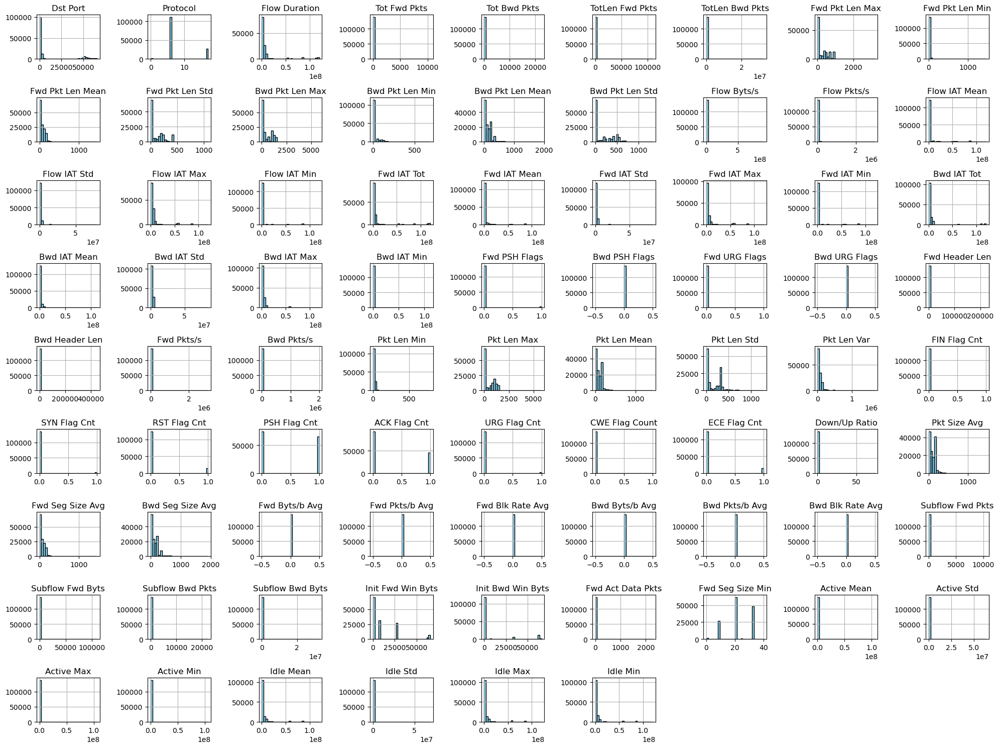

Label
Benign                   98414
DoS attacks-GoldenEye    41508
Name: count, dtype: int64


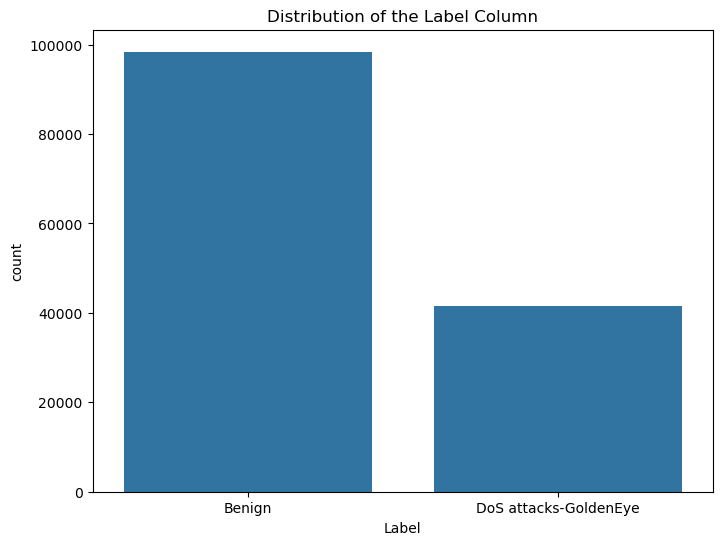

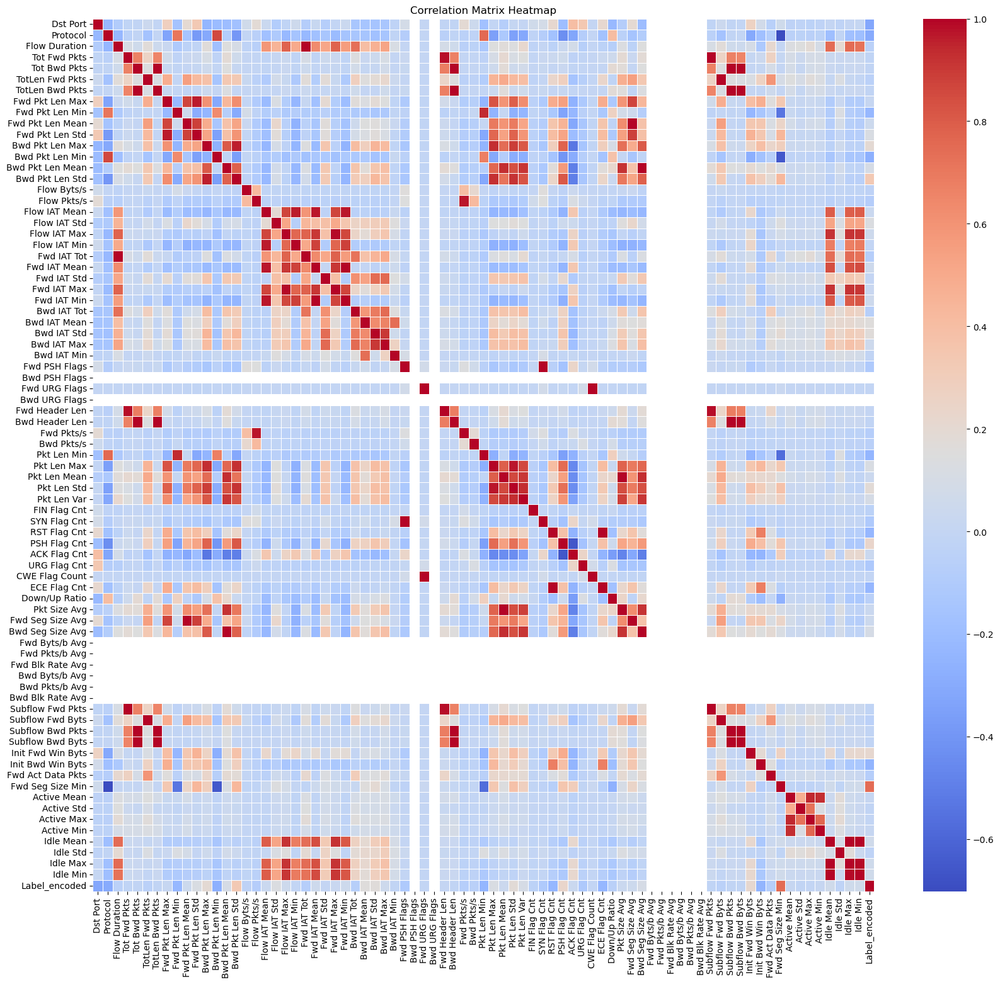

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Fwd Seg Size Min     0.746984
Bwd Pkt Len Std      0.332243
PSH Flag Cnt         0.234888
Init Fwd Win Byts    0.209995
Bwd Pkt Len Max      0.195041
Pkt Len Std          0.176129
Bwd IAT Std          0.163846
Bwd IAT Mean         0.157231
Flow IAT Std         0.132269
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Protocol           -0.300292
Dst Port           -0.317715
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


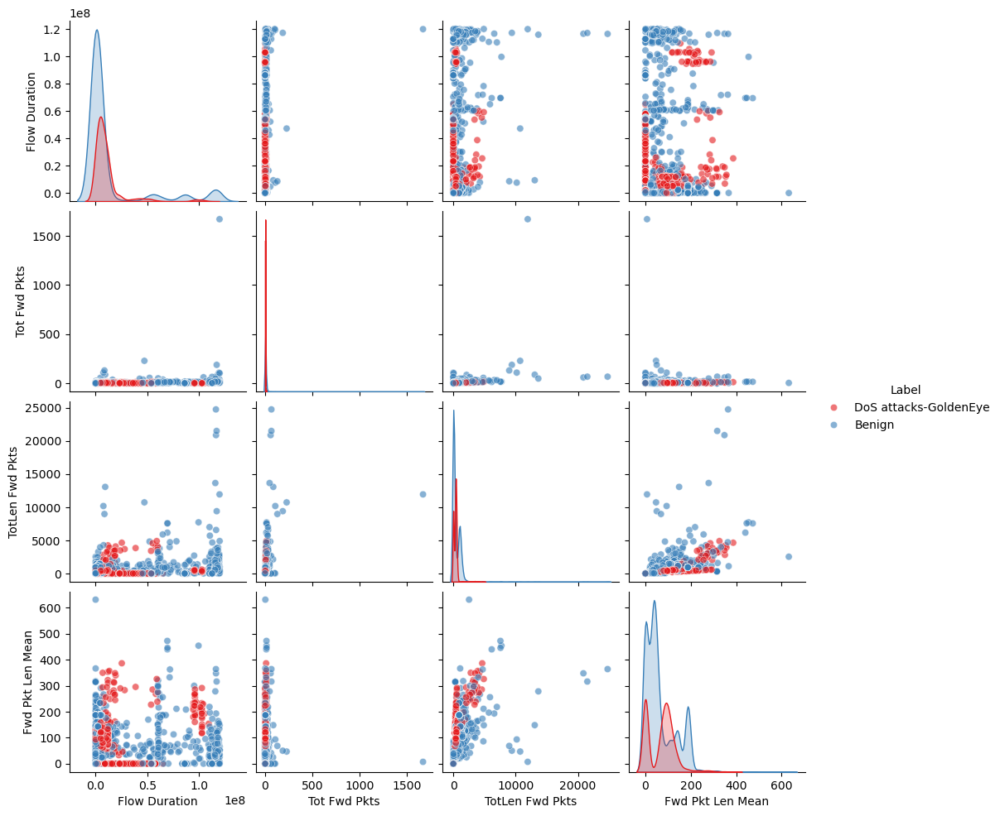

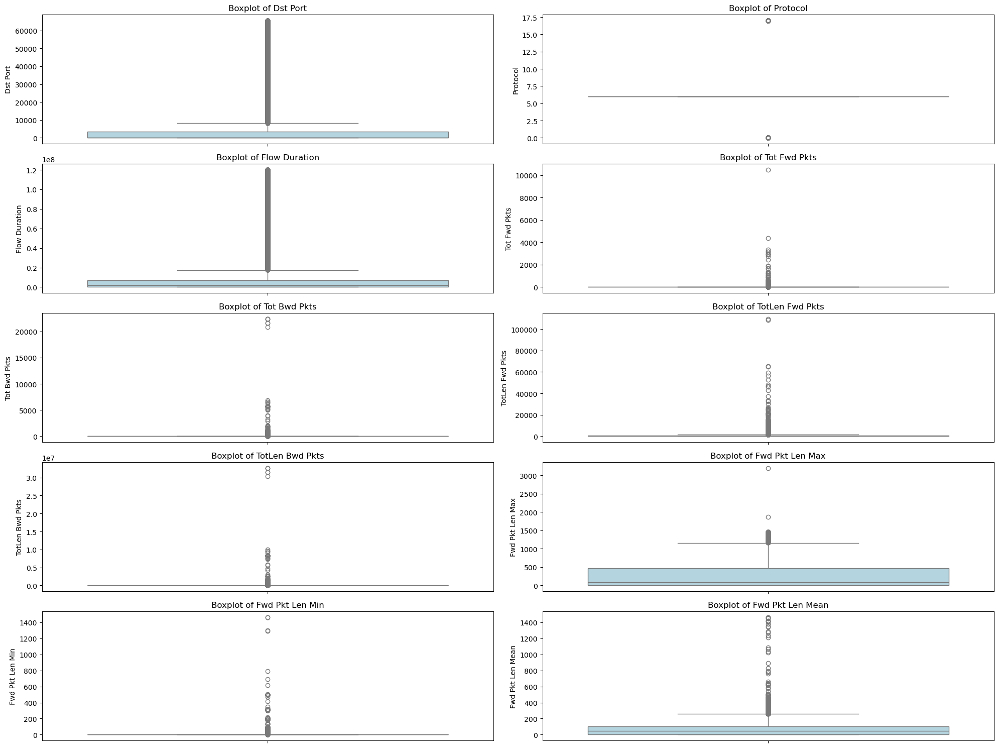

Top 25 important features:
Fwd Seg Size Min: 0.1514233748427001
Dst Port: 0.07312715849136245
Fwd Pkts/s: 0.06829515525747745
Init Fwd Win Byts: 0.0593721002029665
Flow Pkts/s: 0.058241572196638544
Flow IAT Mean: 0.05306867832770755
Fwd Header Len: 0.04366497182260769
Flow IAT Max: 0.030847844229386263
Subflow Bwd Pkts: 0.02858607974977351
Fwd IAT Tot: 0.02210989667268903
Flow Duration: 0.020355728871188368
Flow IAT Min: 0.020217000613974294
Bwd Header Len: 0.02005783694911329
Bwd Pkt Len Std: 0.01865847473844009
Bwd Seg Size Avg: 0.016839072612991293
Fwd IAT Mean: 0.015653209137070044
Fwd IAT Min: 0.015603807574029738
TotLen Fwd Pkts: 0.015522453374788017
Fwd IAT Max: 0.013452637914591272
TotLen Bwd Pkts: 0.013264689163320258
Bwd IAT Std: 0.013250278246599993
Bwd Pkt Len Max: 0.013028336166448756
Fwd Pkt Len Max: 0.01261766383516458
Flow IAT Std: 0.01244964499867638
Bwd IAT Mean: 0.012110395798468215


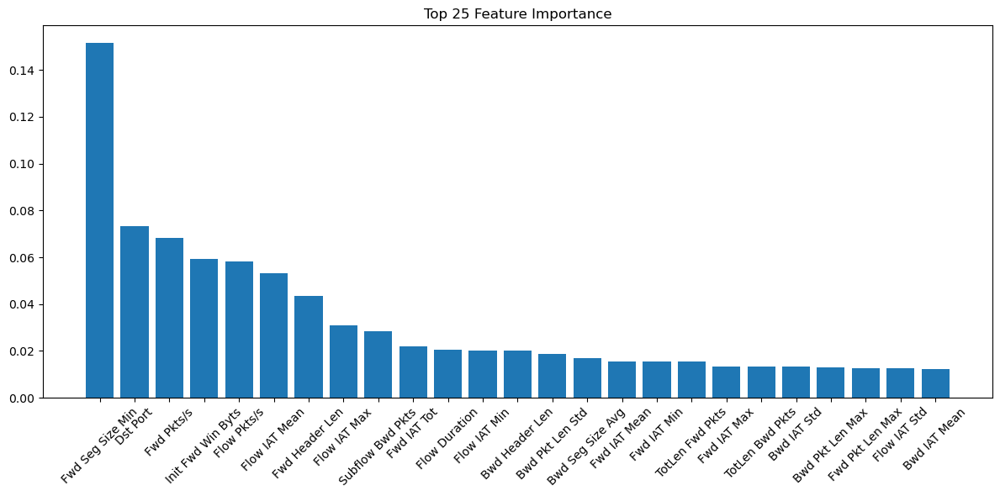

Epoch 1/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.8115 - val_loss: 0.6886
Epoch 2/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6376 - val_loss: 0.6753
Epoch 3/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6514 - val_loss: 0.6704
Epoch 4/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.5459 - val_loss: 0.6682
Epoch 5/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6091 - val_loss: 0.6669
Epoch 6/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.6847 - val_loss: 0.6661
Epoch 7/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.5892 - val_loss: 0.6650
Epoch 8/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.5882 - val_loss: 0.6639
Epoch 9/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 900us/step - loss: 0.5876 - val_loss: 0.6636
Epoch 10/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.5936 - val_loss: 0.6620
Epoch 11/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.5458 - val_loss: 0.6618
Epoch 12/50
700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/st

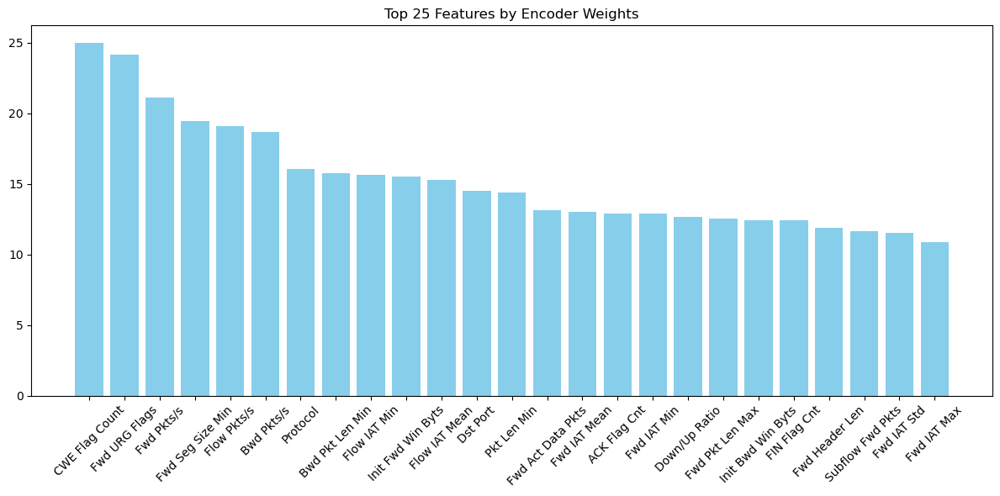

3499/3499 ━━━━━━━━━━━━━━━━━━━━ 3s 827us/step
875/875 ━━━━━━━━━━━━━━━━━━━━ 1s 681us/step
Encoded features shape: (111937, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
36     Bwd Header Len   -84.772997
64   Subflow Bwd Pkts    35.805780
4        Tot Bwd Pkts    35.805780
69   Fwd Seg Size Min    35.144712
47       PSH Flag Cnt   -30.908882
48       ACK Flag Cnt   -27.776367
20       Flow IAT Min    27.433566
17      Flow IAT Mean   -25.368368
40        Pkt Len Max   -22.452994
53       Pkt Size Avg    18.679477
19       Flow IAT Max   -16.919897
24        Fwd IAT Max    15.923904
41       Pkt Len Mean   -14.378708
18       Flow IAT Std    11.911181
11    Bwd Pkt Len Max    11.257386
14    Bwd Pkt Len Std    11.026323
2       Flow Duration    10.954552
1            Protocol    -7.502607
25        Fwd IAT Min    -6.932917
6     TotLen Bwd Pkts     6.575719
65   Subflow Bwd Byts     6.575719
77           Idle Min    -5.878564
21        Fwd IAT Tot    -5.81693

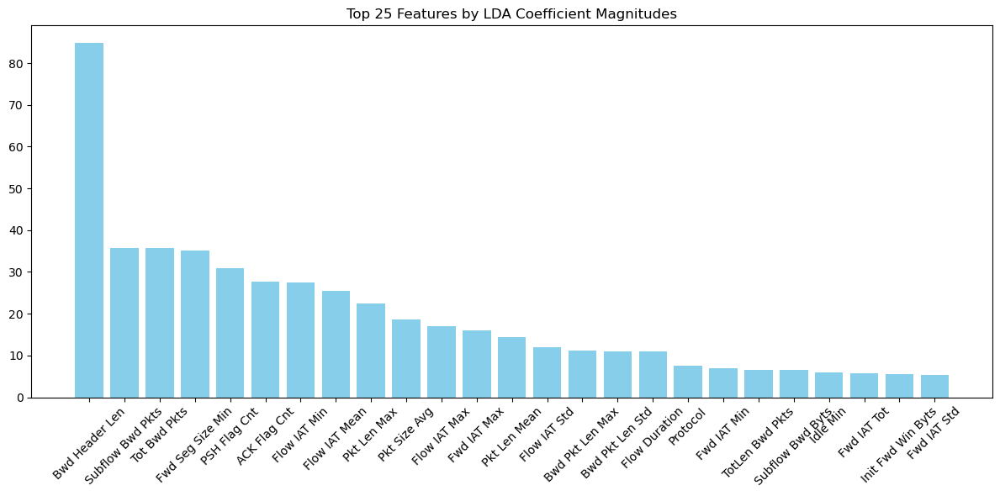

Processing file: DoS attacks-Hulk.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0         0         0      112642712             3             0   
1         0         0      112642648             3             0   
2        22         6        2567078            16            16   
3        22         6         962833            11            11   
4         0         0      112637985             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0                0              0.0                0                0   
1                0              0.0                0                0   
2             1096           2261.0              272                0   
3             1235           1969.0              736                0   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          0.000000  ...                 0 

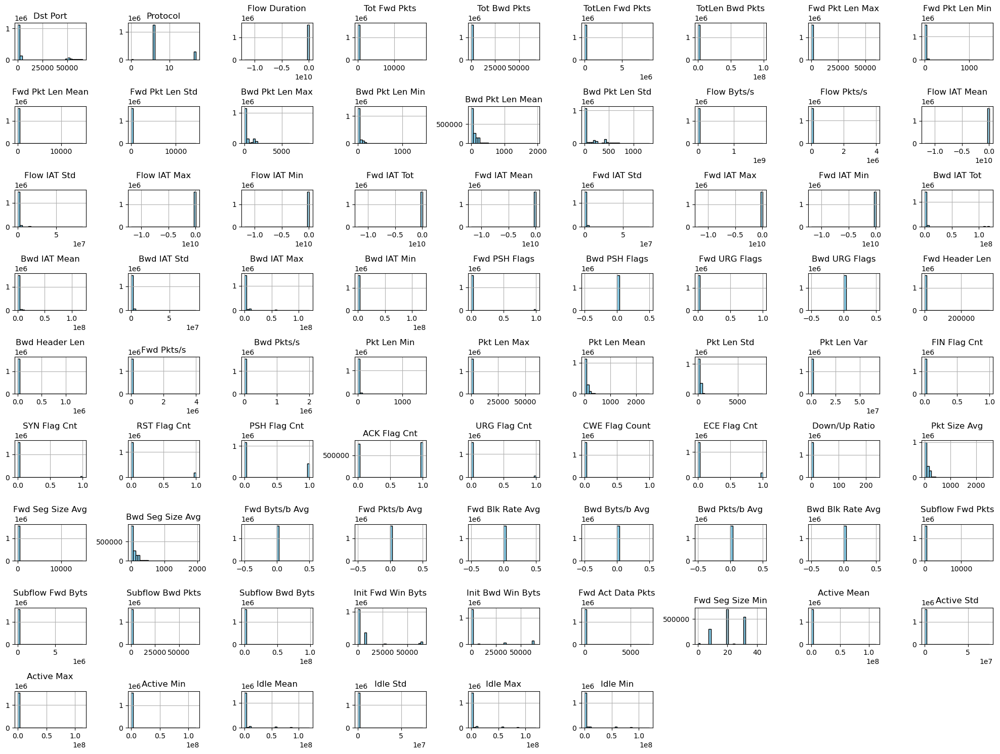

Label
Benign              1097942
DoS attacks-Hulk     461912
Name: count, dtype: int64


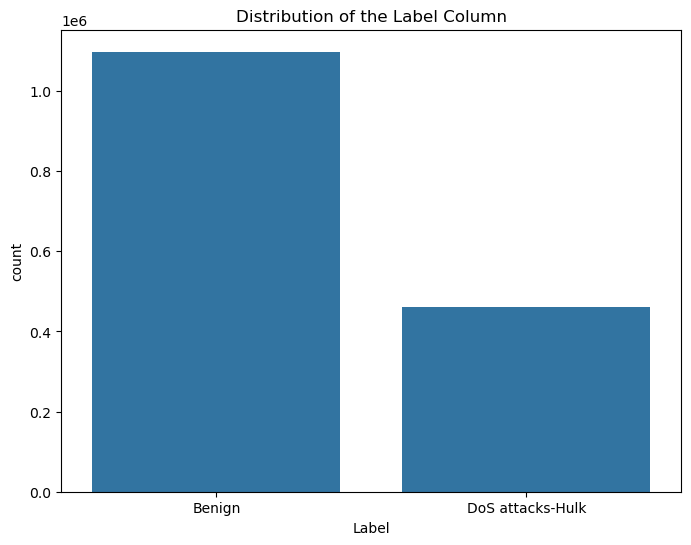

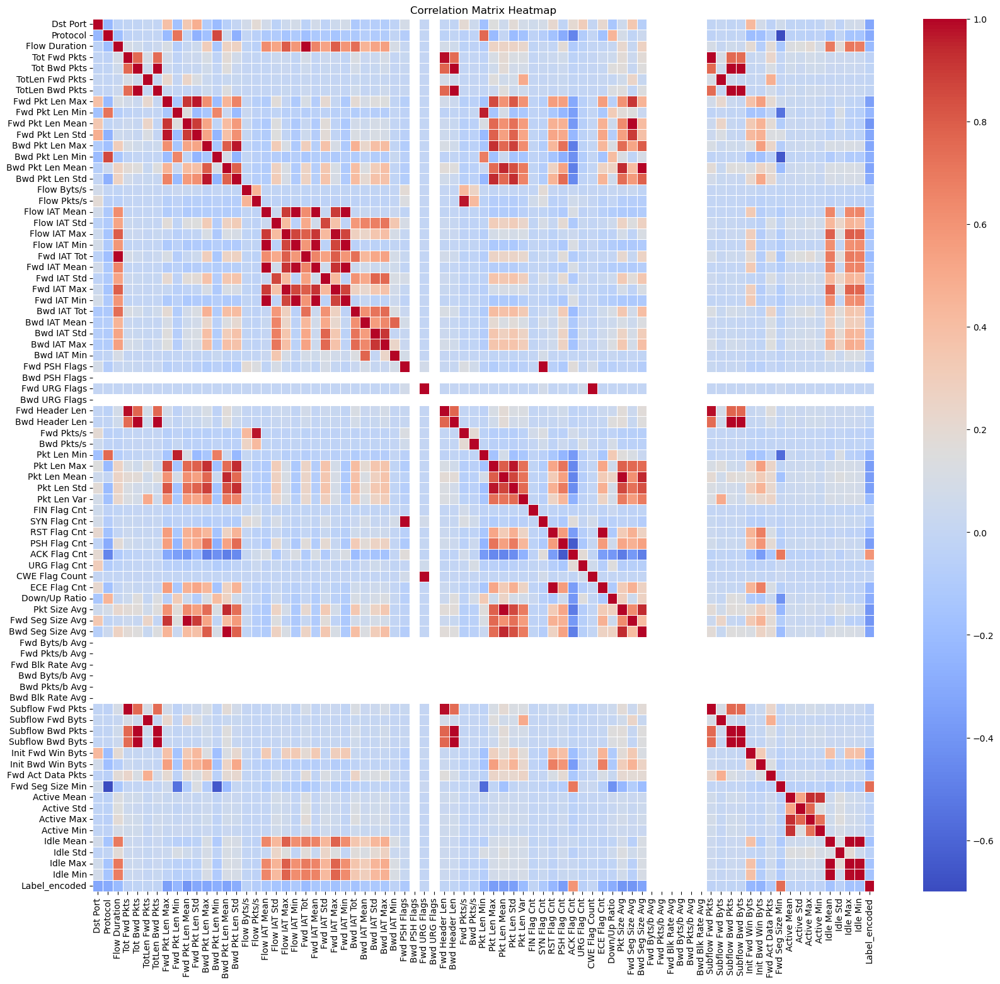

Top 10 features most positively correlated with the Label:
Label_encoded       1.000000
Fwd Seg Size Min    0.746176
ACK Flag Cnt        0.592202
CWE Flag Count     -0.008046
Fwd URG Flags      -0.008046
Subflow Bwd Byts   -0.011913
TotLen Bwd Pkts    -0.011914
Subflow Fwd Byts   -0.012630
TotLen Fwd Pkts    -0.012630
FIN Flag Cnt       -0.015422
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Fwd Seg Size Avg   -0.395637
Pkt Size Avg       -0.395862
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


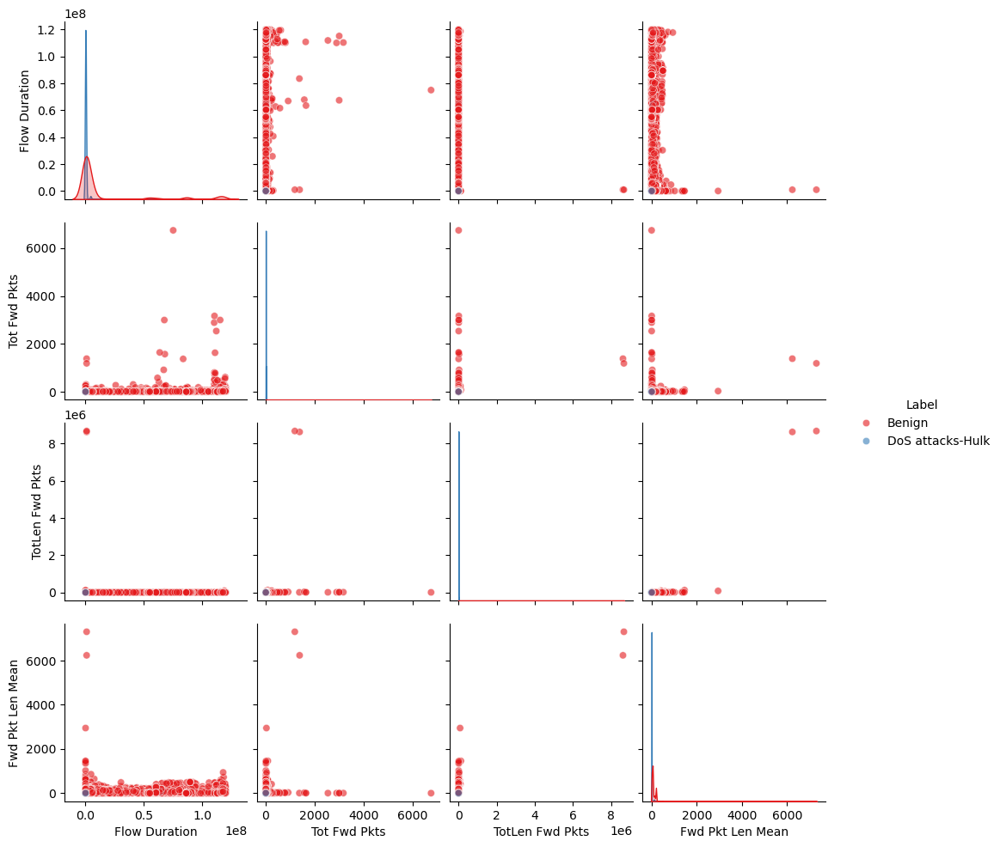

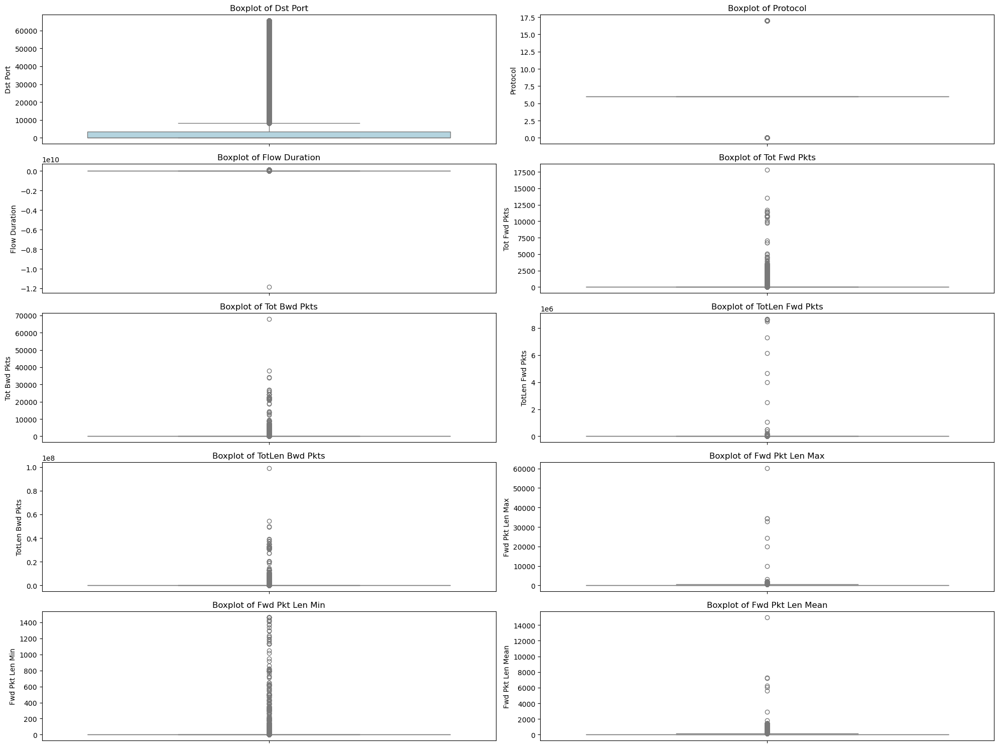

Top 25 important features:
Fwd Seg Size Min: 0.139675111875453
Fwd Header Len: 0.1005307409733223
Fwd IAT Min: 0.06908195147820095
Init Fwd Win Byts: 0.05712177849064953
Dst Port: 0.050616637269562025
Bwd Pkts/s: 0.047750484024776156
Tot Bwd Pkts: 0.03633425088874175
Pkt Len Mean: 0.033477993570034996
Subflow Bwd Pkts: 0.03235605913863132
TotLen Fwd Pkts: 0.027628836401522958
Fwd Pkt Len Mean: 0.024130432011362012
Pkt Len Max: 0.02406606438620507
Flow IAT Min: 0.023945567867031278
Fwd IAT Max: 0.022322393847751757
Fwd Pkts/s: 0.020157521769226108
Bwd Header Len: 0.020099583415905866
Fwd IAT Mean: 0.0182929553598282
Flow IAT Mean: 0.017359060991927643
ACK Flag Cnt: 0.01723187799255211
Flow Byts/s: 0.01712596266666693
Subflow Fwd Byts: 0.016717934162193908
Fwd IAT Tot: 0.01604928876606266
Fwd Seg Size Avg: 0.015336887779034447
Fwd Pkt Len Max: 0.015065521331825376
Bwd Pkt Len Max: 0.013285290088458319


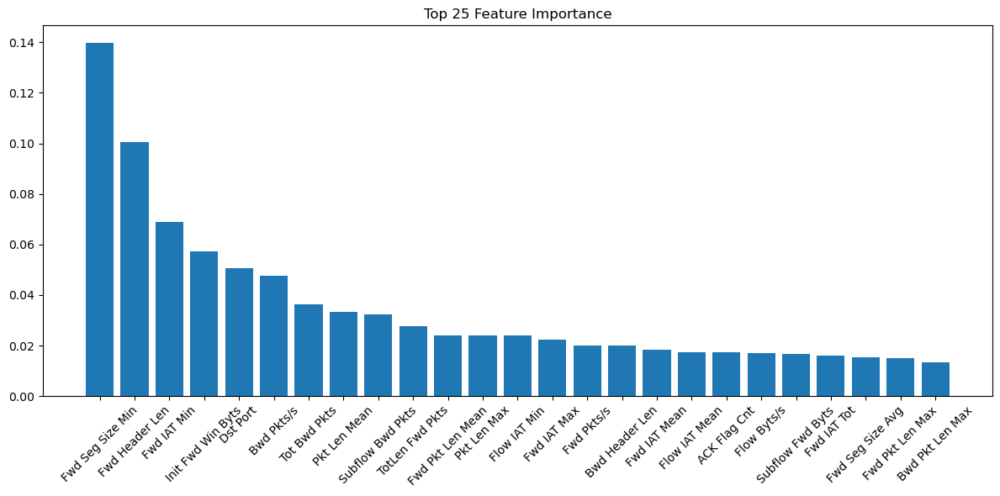

Epoch 1/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 9s 1ms/step - loss: 0.6573 - val_loss: 0.5994
Epoch 2/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.6995 - val_loss: 0.5987
Epoch 3/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 7s 950us/step - loss: 0.6434 - val_loss: 0.5984
Epoch 4/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 7s 906us/step - loss: 0.6084 - val_loss: 0.5974
Epoch 5/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.6488 - val_loss: 0.5974
Epoch 6/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.6129 - val_loss: 0.5972
Epoch 7/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.6356 - val_loss: 0.5972
Epoch 8/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.5978 - val_loss: 0.5972
Epoch 9/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 992us/step - loss: 0.6584 - val_loss: 0.5971
Epoch 10/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.6360 - val_loss: 0.5971
Epoch 11/50
7800/7800 ━━━━━━━━━━━━━━━━━━━━ 8s 1ms/step - loss: 0.6424 - val_loss: 0.5971
Epoch 12/50
7800/7800 ━━

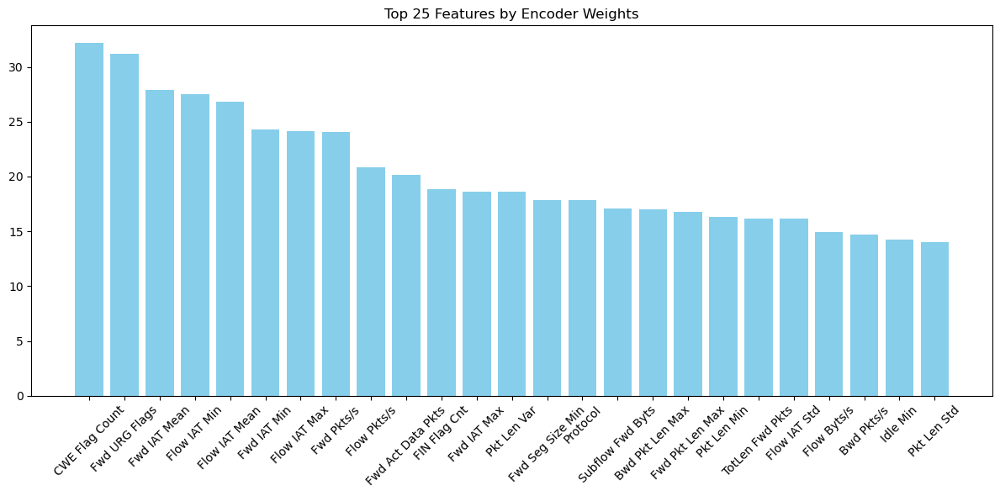

38997/38997 ━━━━━━━━━━━━━━━━━━━━ 31s 802us/step
9750/9750 ━━━━━━━━━━━━━━━━━━━━ 7s 715us/step
Encoded features shape: (1247883, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
65   Subflow Bwd Byts  -141.095712
6     TotLen Bwd Pkts   140.372366
20       Flow IAT Min    42.875665
69   Fwd Seg Size Min    34.062449
17      Flow IAT Mean   -33.358348
36     Bwd Header Len   -29.879570
47       PSH Flag Cnt   -29.740694
48       ACK Flag Cnt   -28.953276
40        Pkt Len Max   -15.619368
64   Subflow Bwd Pkts    15.417844
4        Tot Bwd Pkts    15.417844
53       Pkt Size Avg     9.836170
10    Fwd Pkt Len Std    -9.763933
21        Fwd IAT Tot     9.717533
11    Bwd Pkt Len Max     9.498813
19       Flow IAT Max    -9.475688
25        Fwd IAT Min    -8.895252
1            Protocol    -8.098346
46       RST Flag Cnt     7.949186
18       Flow IAT Std     6.708946
66  Init Fwd Win Byts     6.494098
41       Pkt Len Mean    -6.475813
77           Idle Min    -5

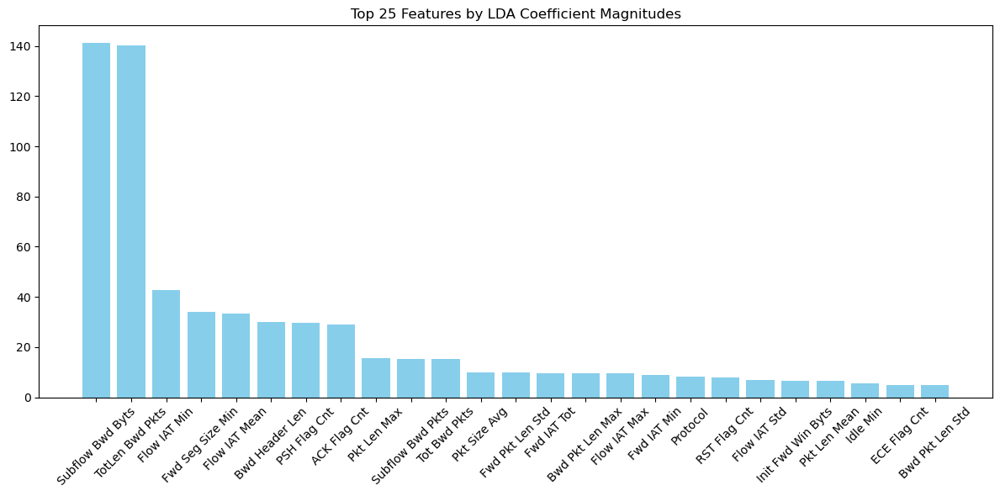

Processing file: DoS attacks-SlowHTTPTest.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0         0         0      112642712             3             0   
1        22         6         234907            13            11   
2        22         6         962353            11            11   
3        22         6        4053664             2             0   
4        80         6        5222759             4             4   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0                0              0.0                0                0   
1             1252           1969.0              736                0   
2             1252           1969.0              736                0   
3                0              0.0                0                0   
4              289            972.0              289                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          0.000000  ...           

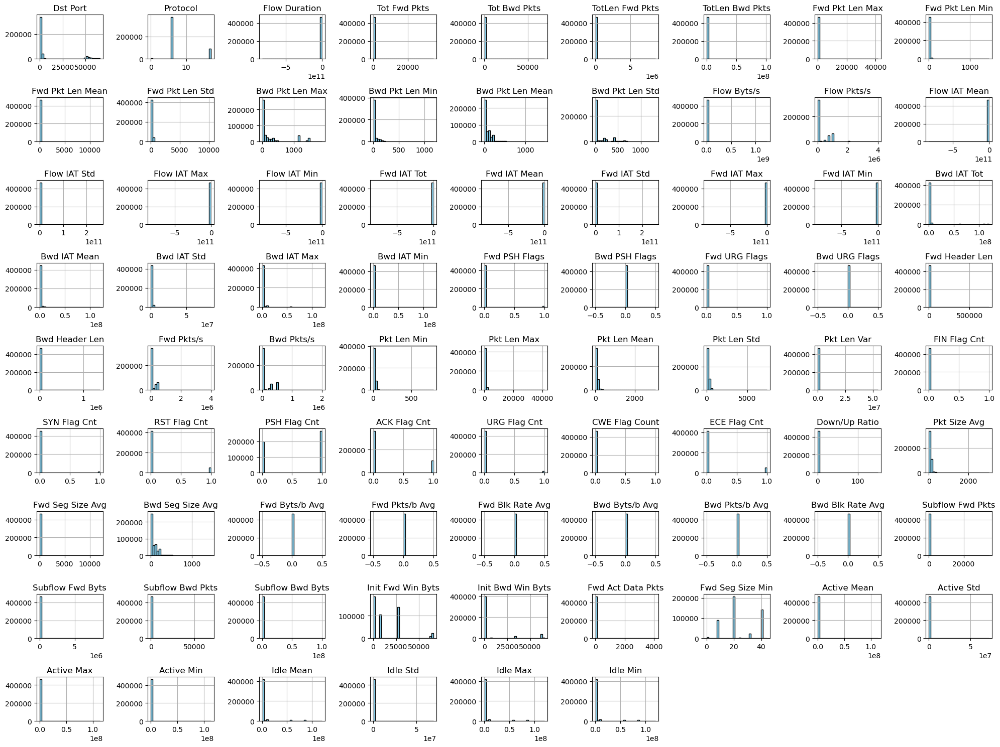

Label
Benign                      329741
DoS attacks-SlowHTTPTest    139890
Name: count, dtype: int64


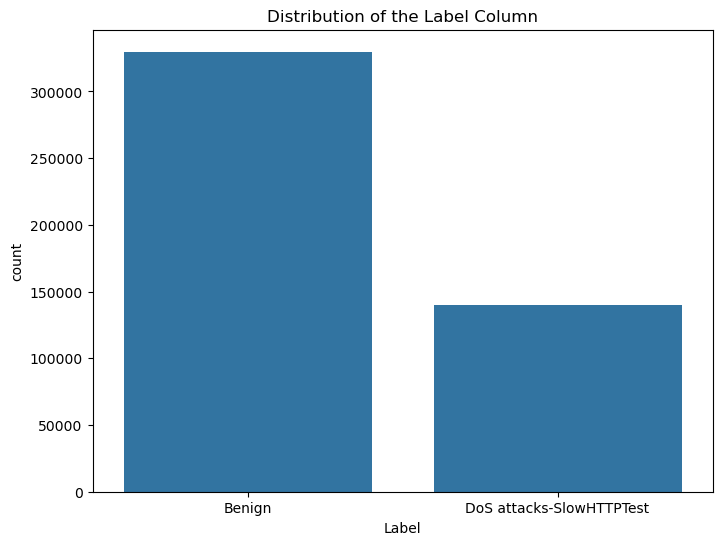

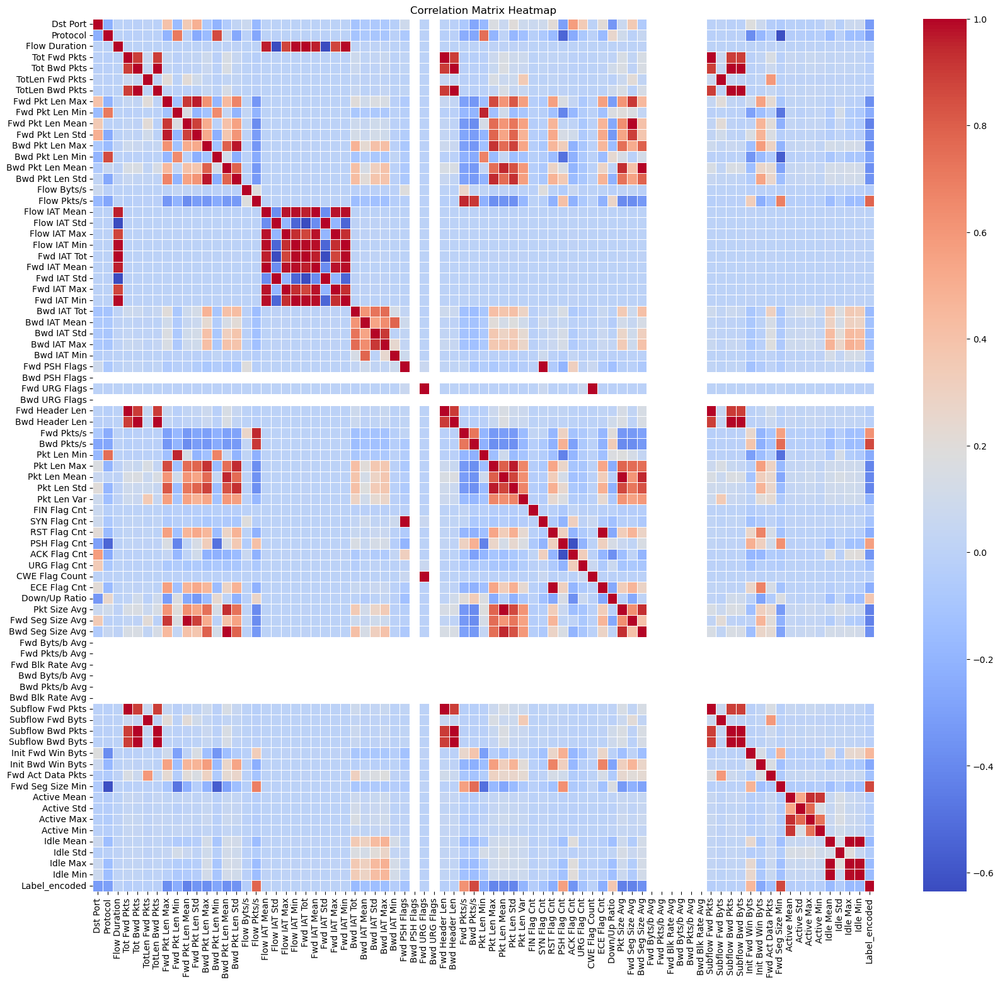

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Fwd Seg Size Min     0.868082
Bwd Pkts/s           0.860861
Flow Pkts/s          0.781373
Fwd Pkts/s           0.622972
PSH Flag Cnt         0.562886
Init Fwd Win Byts    0.452726
Down/Up Ratio        0.368893
Flow IAT Min        -0.000047
Fwd IAT Min         -0.000070
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Fwd Pkt Len Mean   -0.429098
Pkt Size Avg       -0.436221
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


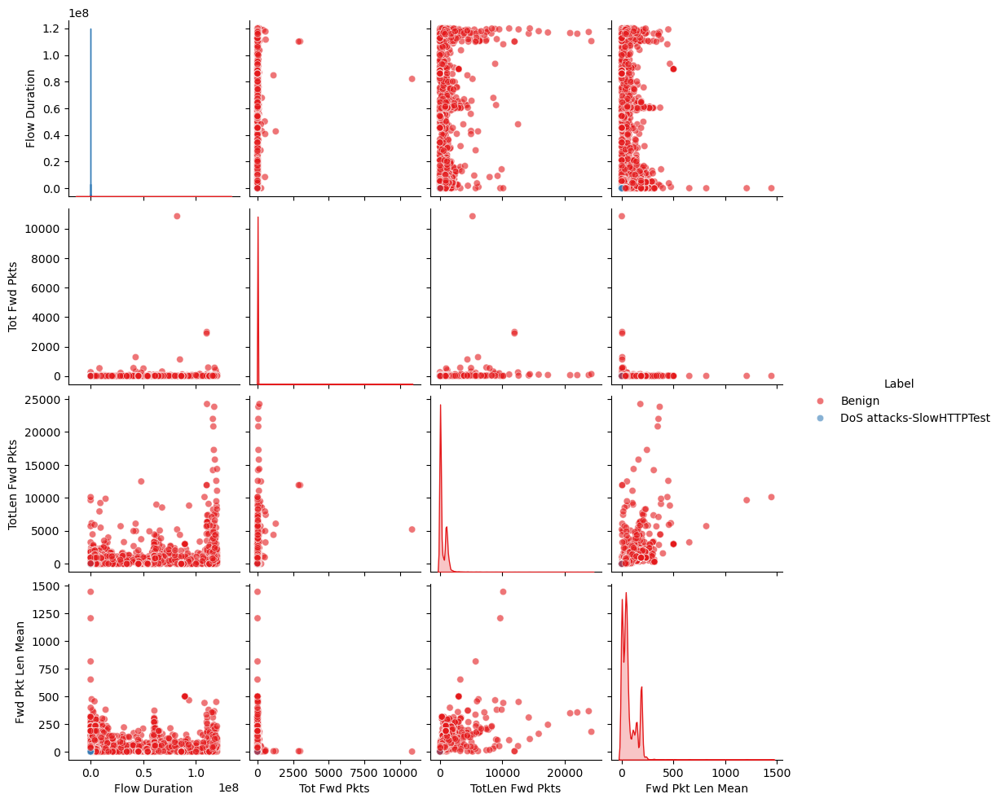

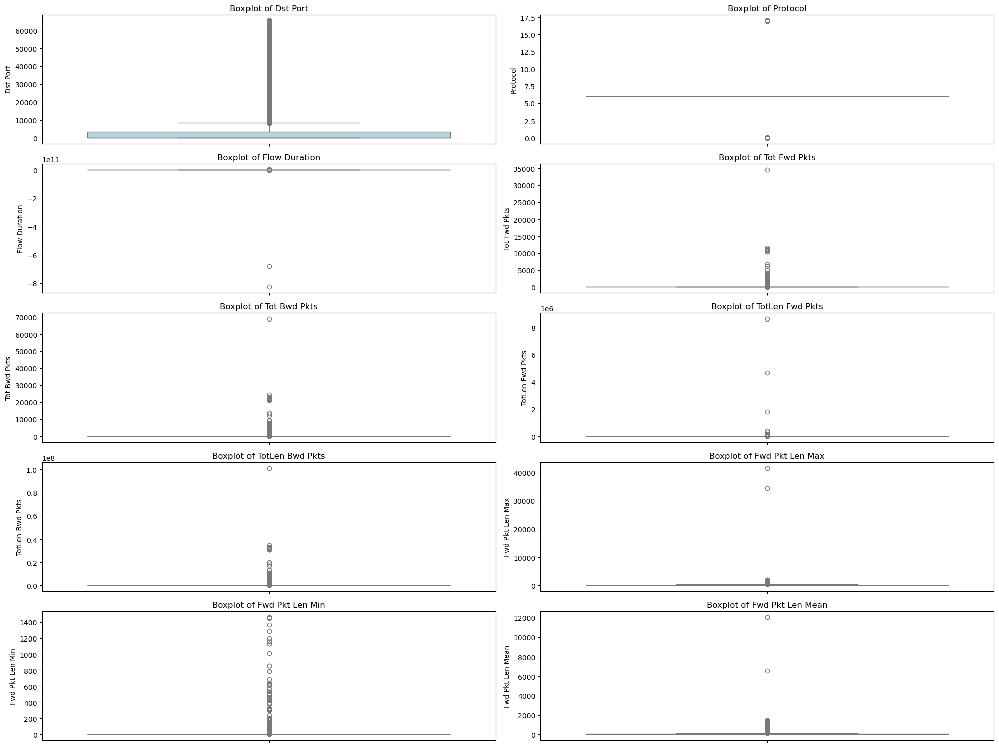

Top 25 important features:
Bwd Pkts/s: 0.12296399364465221
Dst Port: 0.11517635424588572
Flow Pkts/s: 0.10417559867947648
Fwd Seg Size Min: 0.09966066845185462
Fwd Pkts/s: 0.0856067681509563
Flow IAT Mean: 0.04745800775321076
Flow IAT Max: 0.04403924064481804
Flow Duration: 0.043344500323594035
Init Fwd Win Byts: 0.04279716828154234
Fwd Pkt Len Mean: 0.029195180858238523
Pkt Len Mean: 0.02586823499348218
PSH Flag Cnt: 0.0224081973515272
Pkt Len Var: 0.01877640222962518
Tot Fwd Pkts: 0.015751447480324733
Subflow Fwd Pkts: 0.015011869921075494
ACK Flag Cnt: 0.014759965163520485
TotLen Fwd Pkts: 0.01452978554811034
Fwd IAT Tot: 0.012299341847178777
Down/Up Ratio: 0.010831738338902197
Fwd Header Len: 0.010357381753662529
Pkt Len Max: 0.009706021071012498
Fwd Seg Size Avg: 0.009668959149323347
Flow Byts/s: 0.009562739005425766
Flow IAT Min: 0.008753450061684757
Bwd Seg Size Avg: 0.007946443348194424


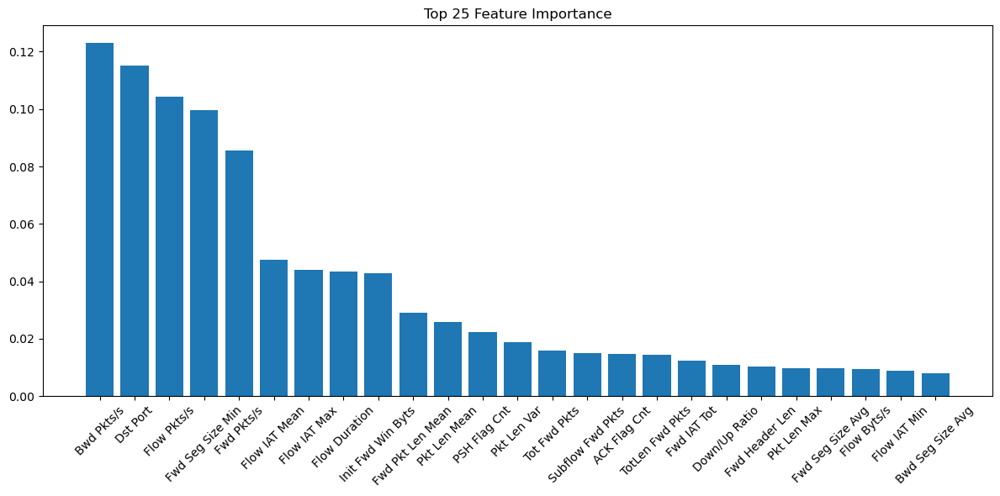

Epoch 1/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.6298 - val_loss: 0.9770
Epoch 2/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5351 - val_loss: 0.9742
Epoch 3/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.7462 - val_loss: 0.9729
Epoch 4/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5167 - val_loss: 0.9723
Epoch 5/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6041 - val_loss: 0.9721
Epoch 6/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6349 - val_loss: 0.9720
Epoch 7/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4822 - val_loss: 0.9719
Epoch 8/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6168 - val_loss: 0.9718
Epoch 9/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 2s 958us/step - loss: 0.5824 - val_loss: 0.9717
Epoch 10/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5694 - val_loss: 0.9716
Epoch 11/50
2349/2349 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5582 - val_loss: 0.9715
Epoch 12/50
2349/2349 ━━━━━━

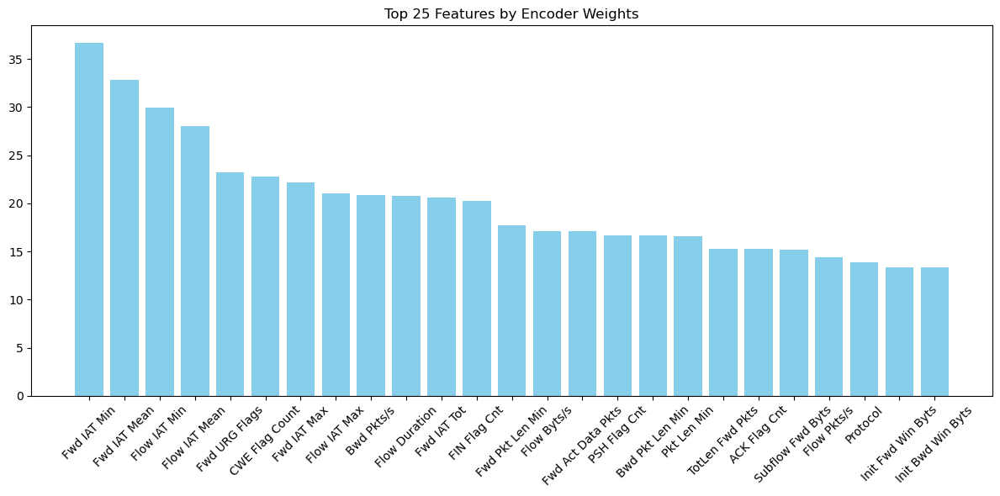

11741/11741 ━━━━━━━━━━━━━━━━━━━━ 10s 807us/step
2936/2936 ━━━━━━━━━━━━━━━━━━━━ 2s 763us/step
Encoded features shape: (375704, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
21        Fwd IAT Tot  1914.687165
22       Fwd IAT Mean -1590.358296
2       Flow Duration -1343.489704
20       Flow IAT Min  1181.062739
24        Fwd IAT Max  -563.928680
25        Fwd IAT Min   488.306705
36     Bwd Header Len  -221.464967
65   Subflow Bwd Byts   192.001348
19       Flow IAT Max  -150.350618
6     TotLen Bwd Pkts  -107.866591
69   Fwd Seg Size Min    95.967024
64   Subflow Bwd Pkts    68.457874
4        Tot Bwd Pkts    68.457874
17      Flow IAT Mean    64.129583
47       PSH Flag Cnt   -57.929008
48       ACK Flag Cnt   -56.324632
42        Pkt Len Std   -25.128355
10    Fwd Pkt Len Std   -24.937631
11    Bwd Pkt Len Max    21.925518
43        Pkt Len Var    20.810226
1            Protocol   -16.313432
40        Pkt Len Max   -15.474037
66  Init Fwd Win Byts    14.

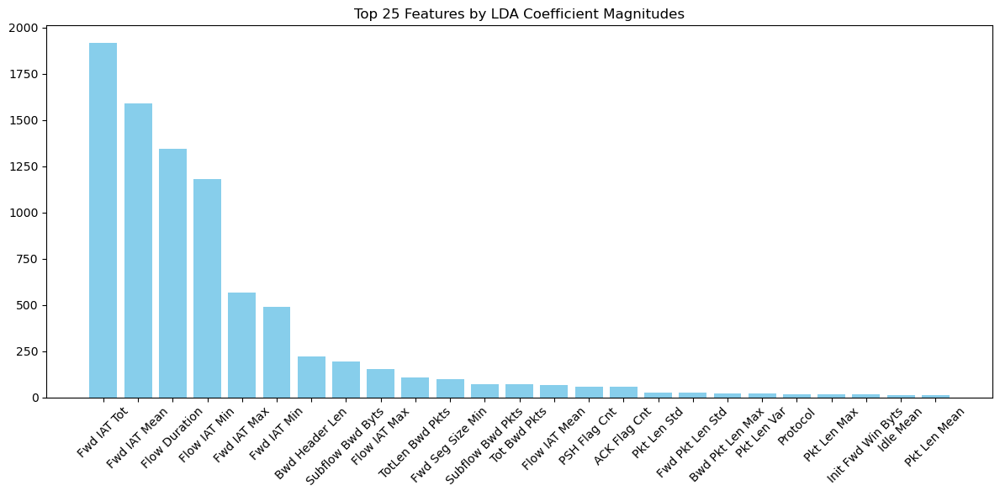

Processing file: DoS attacks-Slowloris.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        80        17      115999879            16             0   
1        80        17      119959955            14             0   
2     10610         6         148625             2             1   
3        22         6        1273538             2             2   
4        80         6      117252095            18            16   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0              512              0.0               32               32   
1              448              0.0               32               32   
2                0              0.0                0                0   
3                0              0.0                0                0   
4              879           1412.0              434                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min   Active Mean    Active Std  \
0         32.000000  ...           

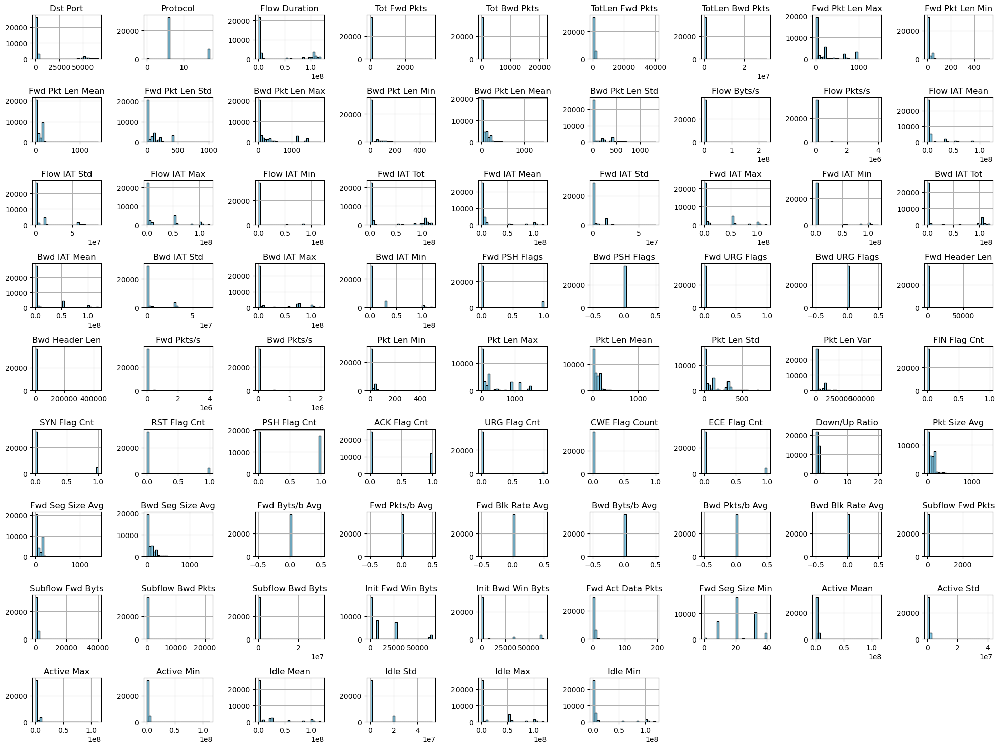

Label
Benign                   25764
DoS attacks-Slowloris    10990
Name: count, dtype: int64


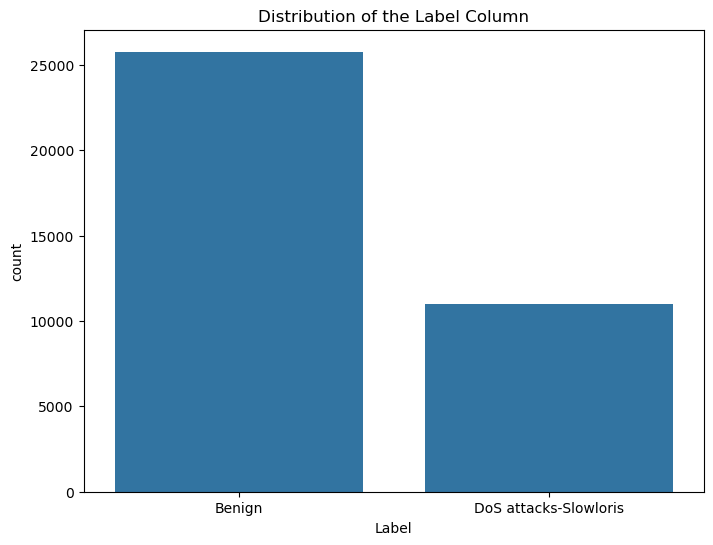

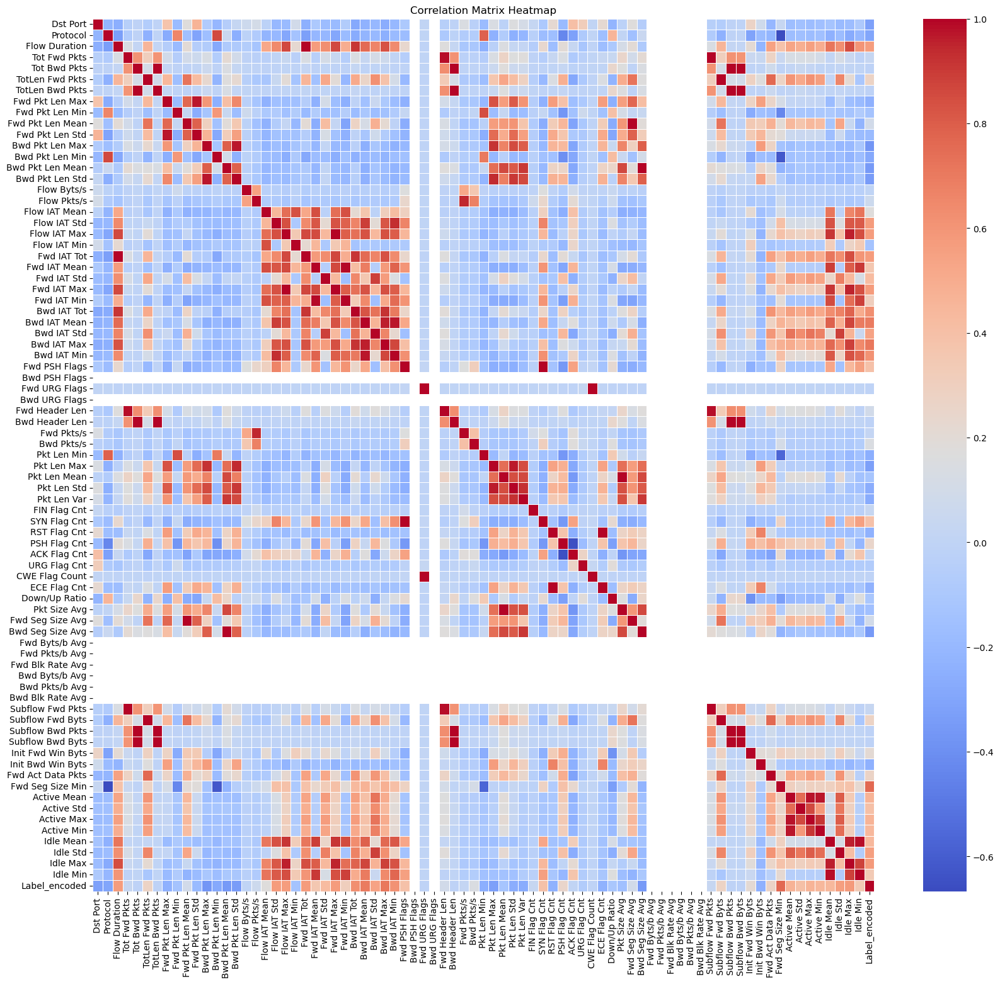

Top 10 features most positively correlated with the Label:
Label_encoded       1.000000
Fwd Seg Size Min    0.764984
Bwd IAT Max         0.710218
Bwd IAT Mean        0.697902
Bwd IAT Tot         0.622774
Bwd IAT Min         0.611465
Idle Max            0.577291
Flow IAT Std        0.571583
Fwd IAT Max         0.571254
Fwd IAT Tot         0.570859
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Bwd Seg Size Avg   -0.353633
Bwd Pkt Len Max    -0.368979
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


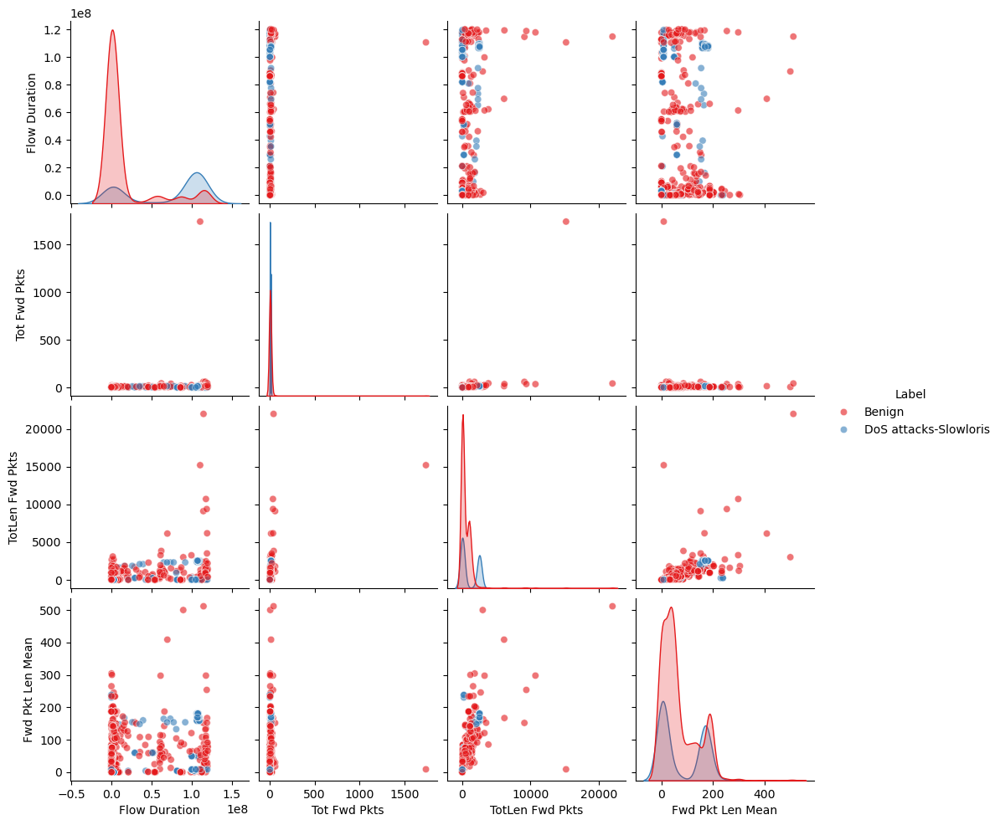

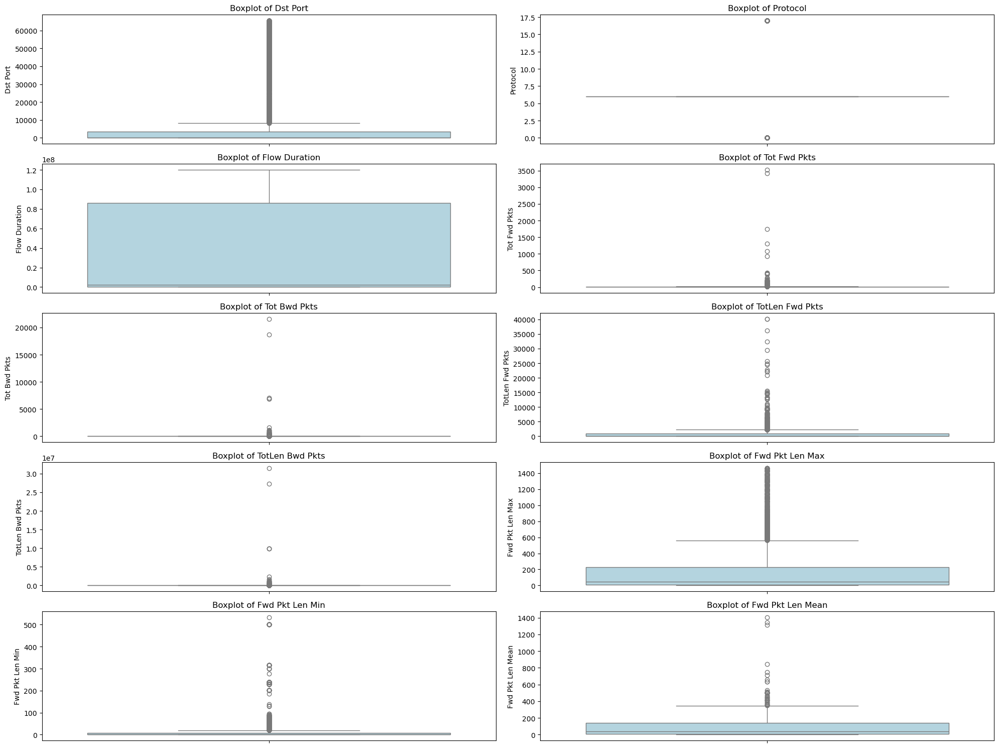

Top 25 important features:
Fwd Seg Size Min: 0.11186099554645601
Bwd IAT Min: 0.07969852978519294
Bwd IAT Max: 0.05982297179389609
Flow IAT Std: 0.059114944840154705
Bwd IAT Mean: 0.05308849636363539
Dst Port: 0.04439724366028942
Flow IAT Mean: 0.04290382424747647
Fwd Pkts/s: 0.03991810460846058
Flow Pkts/s: 0.03548191062741291
Fwd IAT Tot: 0.029864475357834958
Fwd IAT Mean: 0.02441573695159137
Bwd Pkts/s: 0.024198967864943858
Fwd Header Len: 0.022404525362252944
Flow IAT Min: 0.021325373363321715
Bwd Pkt Len Mean: 0.020433369899440317
Flow Duration: 0.02012568712406661
Init Fwd Win Byts: 0.015858790567580546
Bwd Pkt Len Max: 0.014264434865800044
Bwd Seg Size Avg: 0.014009104832663235
TotLen Bwd Pkts: 0.013907791700722023
Bwd IAT Tot: 0.013431122804150509
Bwd Header Len: 0.013175361355150923
Pkt Len Max: 0.012549535499902634
Fwd Seg Size Avg: 0.012392121881331361
Subflow Fwd Byts: 0.009109899037819254


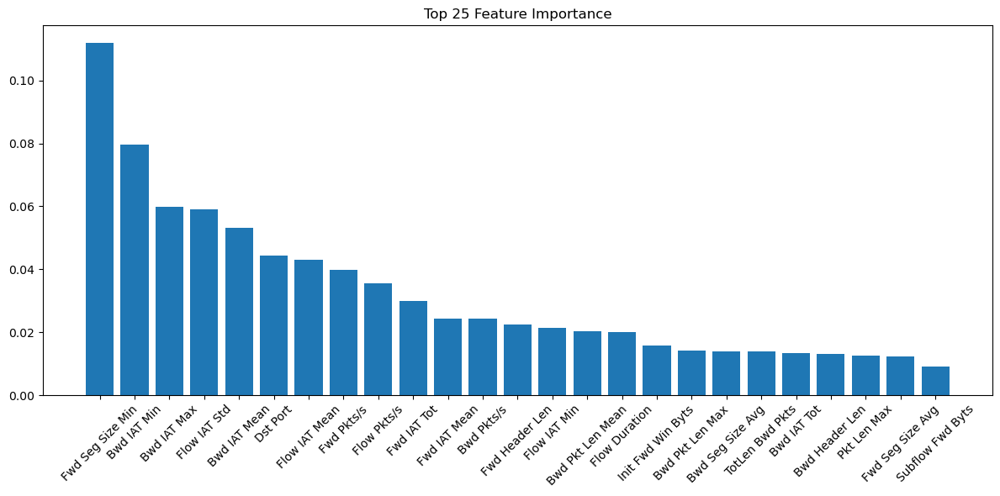

Epoch 1/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.0207 - val_loss: 0.5292
Epoch 2/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6331 - val_loss: 0.4815
Epoch 3/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.7195 - val_loss: 0.4641
Epoch 4/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6842 - val_loss: 0.4546
Epoch 5/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5040 - val_loss: 0.4507
Epoch 6/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6440 - val_loss: 0.4483
Epoch 7/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.6571 - val_loss: 0.4467
Epoch 8/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5074 - val_loss: 0.4455
Epoch 9/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4919 - val_loss: 0.4447
Epoch 10/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.4604 - val_loss: 0.4439
Epoch 11/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.5333 - val_loss: 0.4433
Epoch 12/50
184/184 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

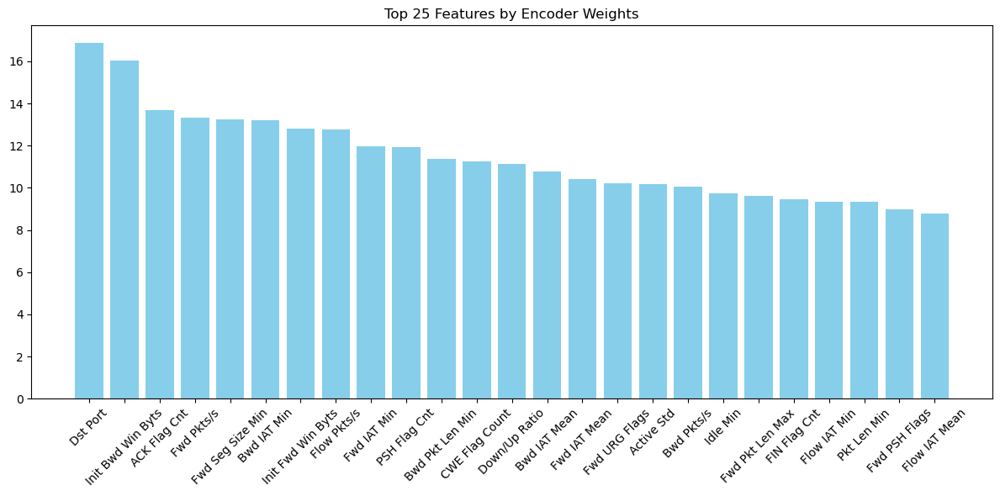

919/919 ━━━━━━━━━━━━━━━━━━━━ 1s 846us/step
230/230 ━━━━━━━━━━━━━━━━━━━━ 0s 781us/step
Encoded features shape: (29403, 20)
Top 25 features by LDA coefficients:
             Feature  Coefficient
36    Bwd Header Len  -117.150517
76          Idle Max   -59.785374
27      Bwd IAT Mean    55.896512
21       Fwd IAT Tot    52.429280
25       Fwd IAT Min    48.069976
69  Fwd Seg Size Min    48.043071
22      Fwd IAT Mean   -44.765886
47      PSH Flag Cnt   -40.899355
30       Bwd IAT Min   -40.764344
48      ACK Flag Cnt   -39.410966
42       Pkt Len Std    35.713130
2      Flow Duration   -35.318160
24       Fwd IAT Max   -32.461831
6    TotLen Bwd Pkts    31.749365
65  Subflow Bwd Byts    31.749365
77          Idle Min    30.247071
17     Flow IAT Mean    28.609515
40       Pkt Len Max   -28.568146
20      Flow IAT Min   -27.024226
64  Subflow Bwd Pkts    26.661379
4       Tot Bwd Pkts    26.661379
10   Fwd Pkt Len Std   -26.363692
19      Flow IAT Max    21.634377
11   Bwd Pkt Len Max    1

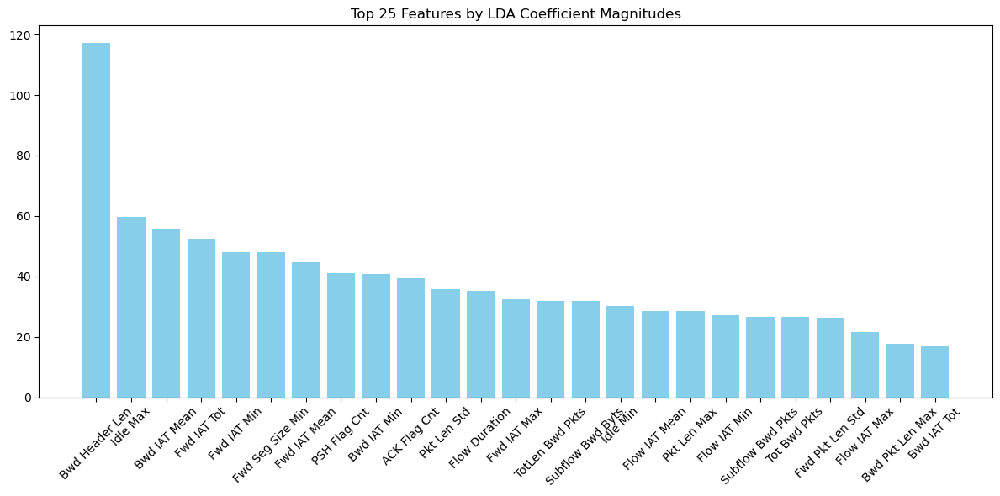

Processing file: FTP-BruteForce.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        22         6        2036636            14            11   
1        22         6        1272092            12            12   
2        22         6          62844             6             4   
3        67        17            748             1             1   
4         0         0      112640408             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0             1123           1969.0              648                0   
1             1252           1969.0              736                0   
2               52           1017.0               32                0   
3              300            329.0              300              300   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0         80.214286  ...                32   

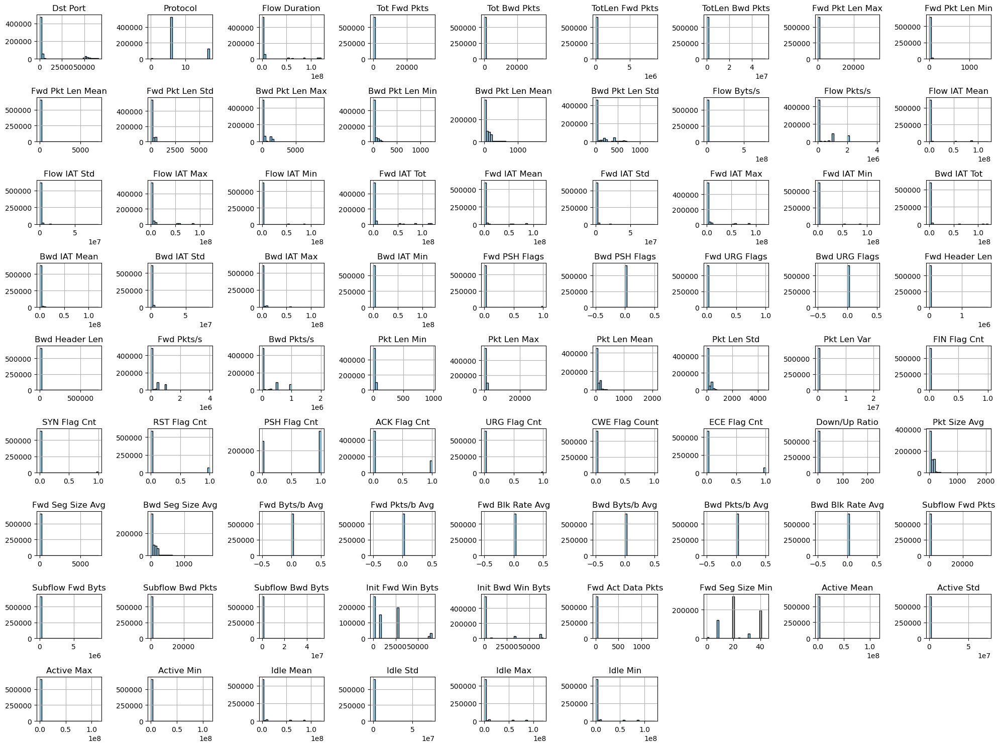

Label
Benign            469350
FTP-BruteForce    193360
Name: count, dtype: int64


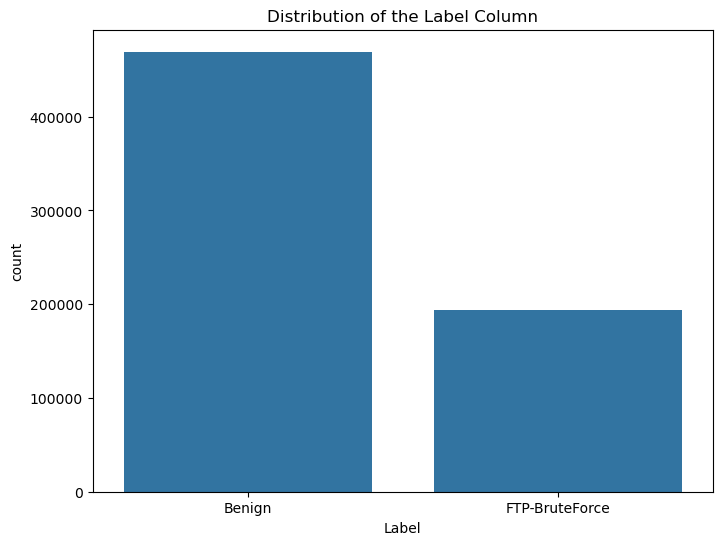

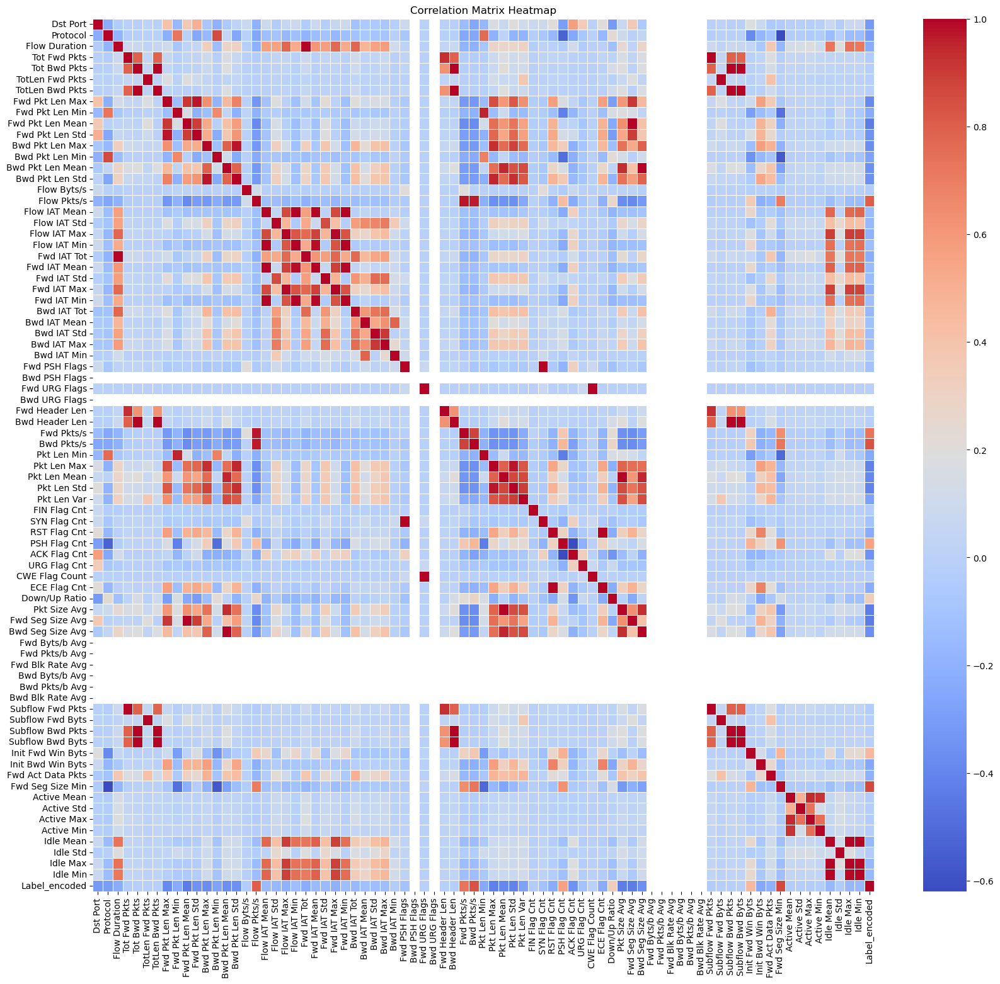

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Fwd Seg Size Min     0.865251
Bwd Pkts/s           0.833130
Flow Pkts/s          0.802504
Fwd Pkts/s           0.728290
PSH Flag Cnt         0.558582
Init Fwd Win Byts    0.449979
Down/Up Ratio        0.334418
CWE Flag Count      -0.008002
Fwd URG Flags       -0.008002
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Fwd Pkt Len Mean   -0.44149
Fwd Seg Size Avg   -0.44149
Bwd PSH Flags           NaN
Bwd URG Flags           NaN
Fwd Byts/b Avg          NaN
Fwd Pkts/b Avg          NaN
Fwd Blk Rate Avg        NaN
Bwd Byts/b Avg          NaN
Bwd Pkts/b Avg          NaN
Bwd Blk Rate Avg        NaN
Name: Label_encoded, dtype: float64


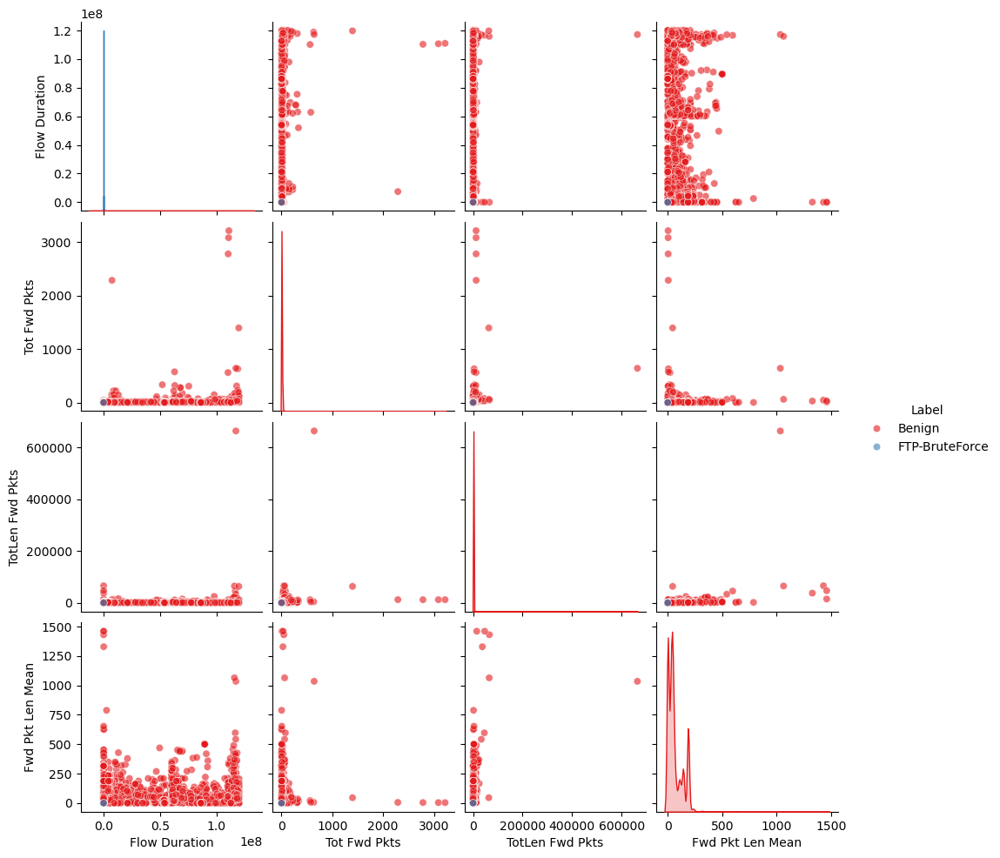

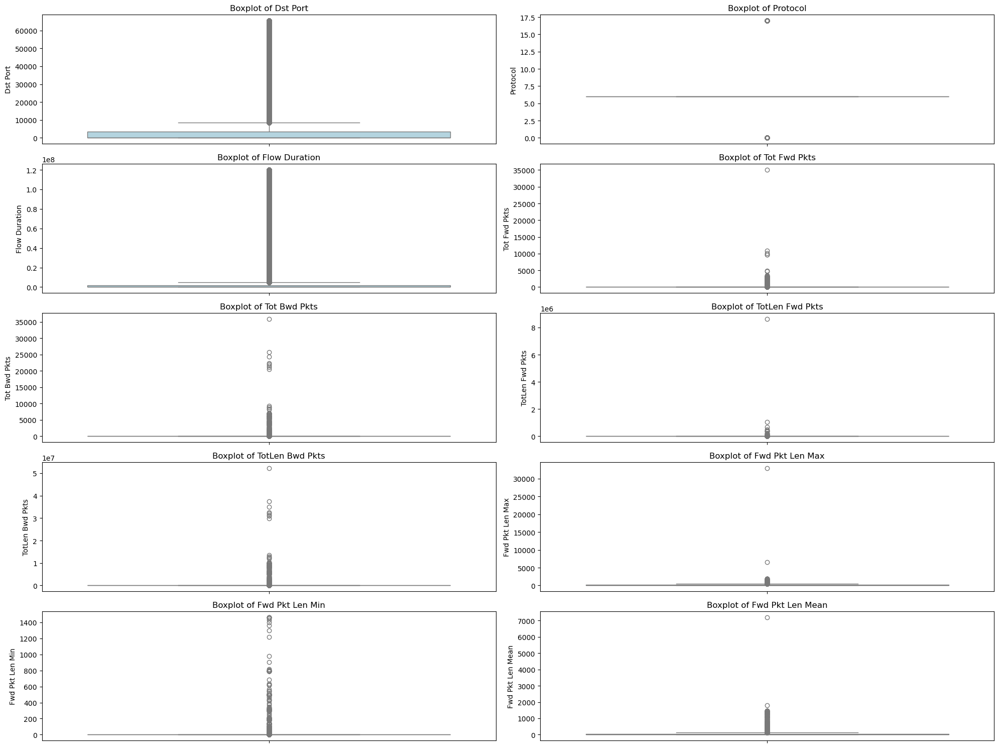

Top 25 important features:
Bwd Pkts/s: 0.12324163807265691
Dst Port: 0.11821167858137396
Flow Pkts/s: 0.1082691484572734
Fwd Seg Size Min: 0.10508792124969023
Fwd Pkts/s: 0.08765615925457636
Flow Duration: 0.048860149834723296
Flow IAT Mean: 0.04826167520795939
Flow IAT Max: 0.04456980315374245
Init Fwd Win Byts: 0.04049042988785072
Fwd Pkt Len Mean: 0.02875000730832354
Pkt Len Mean: 0.025652955204072896
Pkt Len Var: 0.018667242019851368
PSH Flag Cnt: 0.0177158084691428
Fwd IAT Tot: 0.014803489751203753
Subflow Fwd Pkts: 0.014700590943861442
TotLen Fwd Pkts: 0.01439619350800817
Tot Fwd Pkts: 0.012198611155428645
Flow IAT Min: 0.009794689286421698
Pkt Len Max: 0.009645800661023269
Flow Byts/s: 0.009584570427641815
Fwd Seg Size Avg: 0.009584476009024708
Fwd IAT Max: 0.00917229536002123
Down/Up Ratio: 0.00895530949277851
Init Bwd Win Byts: 0.008625738936008697
Bwd Seg Size Avg: 0.007938900879720441


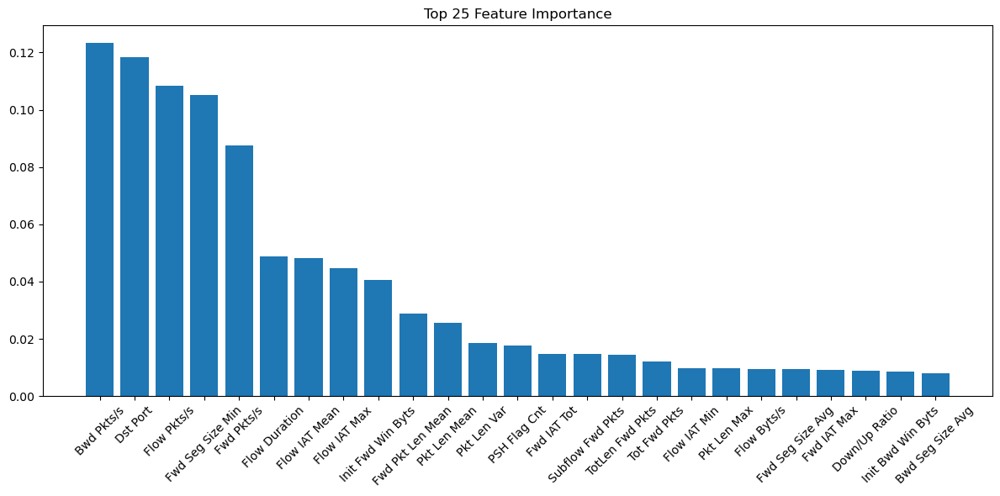

Epoch 1/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.6229 - val_loss: 0.8846
Epoch 2/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5446 - val_loss: 0.8820
Epoch 3/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5382 - val_loss: 0.8816
Epoch 4/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5368 - val_loss: 0.8807
Epoch 5/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5579 - val_loss: 0.8805
Epoch 6/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5612 - val_loss: 0.8804
Epoch 7/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5805 - val_loss: 0.8803
Epoch 8/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5538 - val_loss: 0.8802
Epoch 9/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5709 - val_loss: 0.8800
Epoch 10/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5434 - val_loss: 0.8799
Epoch 11/50
3314/3314 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.5525 - val_loss: 0.8799
Epoch 12/50
3314/3314 ━━━━━━━━

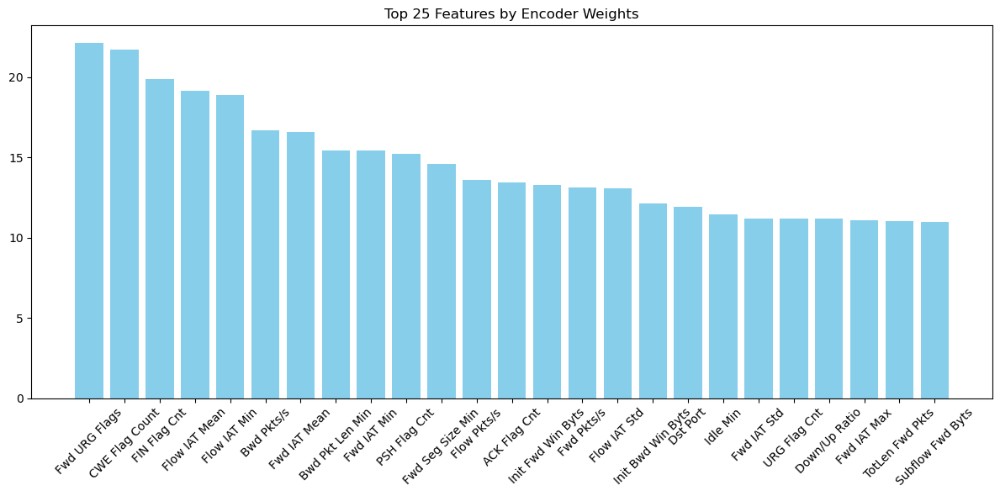

16568/16568 ━━━━━━━━━━━━━━━━━━━━ 13s 810us/step
4142/4142 ━━━━━━━━━━━━━━━━━━━━ 3s 790us/step
Encoded features shape: (530168, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
36     Bwd Header Len  -134.972494
69   Fwd Seg Size Min    91.555883
20       Flow IAT Min    80.672002
17      Flow IAT Mean   -58.634803
47       PSH Flag Cnt   -55.610027
48       ACK Flag Cnt   -54.092054
4        Tot Bwd Pkts    40.088286
64   Subflow Bwd Pkts    40.088286
21        Fwd IAT Tot    31.738086
25        Fwd IAT Min   -29.196497
65   Subflow Bwd Byts    27.124728
6     TotLen Bwd Pkts    27.093942
10    Fwd Pkt Len Std   -26.643522
11    Bwd Pkt Len Max    21.218377
46       RST Flag Cnt    21.208009
2       Flow Duration   -19.827041
42        Pkt Len Std   -19.394959
51       ECE Flag Cnt   -18.513158
19       Flow IAT Max   -18.086106
43        Pkt Len Var    17.707000
18       Flow IAT Std    16.558719
40        Pkt Len Max   -16.454455
1            Protocol   -15.

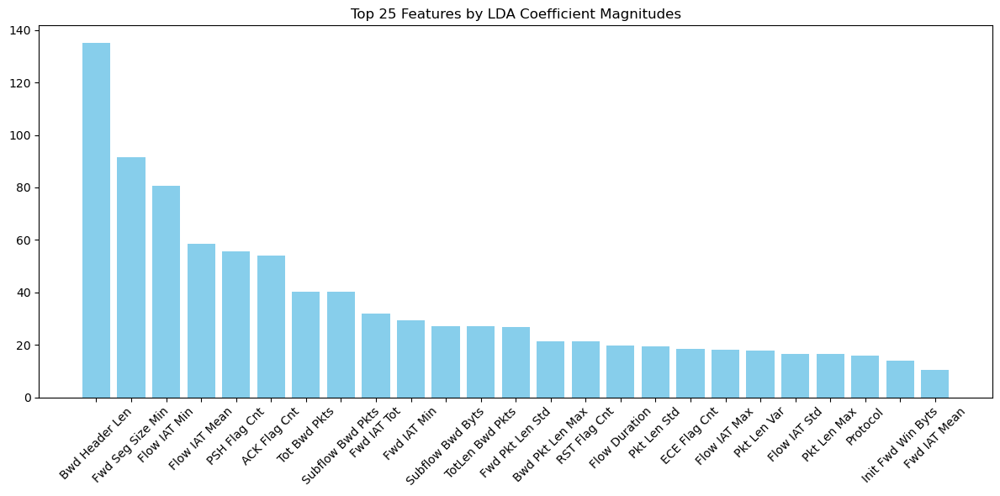

Processing file: Infilteration.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        22         6          62844             6             4   
1         0         0      112641563             3             0   
2         0         0      112639966             3             0   
3         0         0      112640425             3             0   
4         0         0      112640709             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0               52           1017.0               32                0   
1                0              0.0                0                0   
2                0              0.0                0                0   
3                0              0.0                0                0   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          8.666667  ...                32    

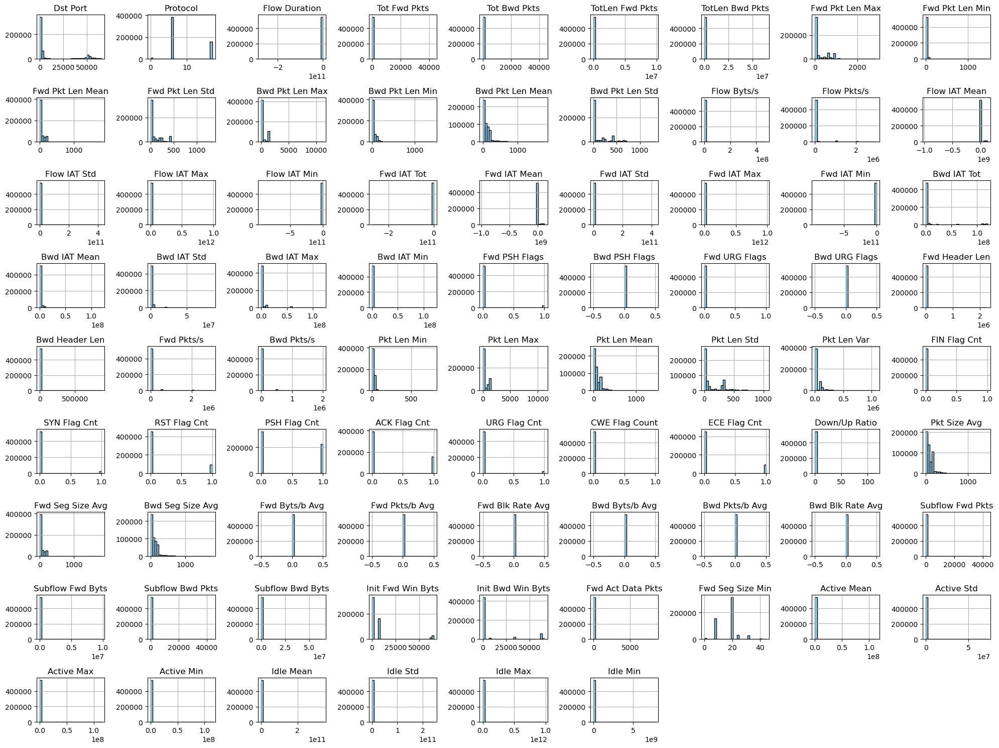

Label
Benign           387289
Infilteration    161934
Name: count, dtype: int64


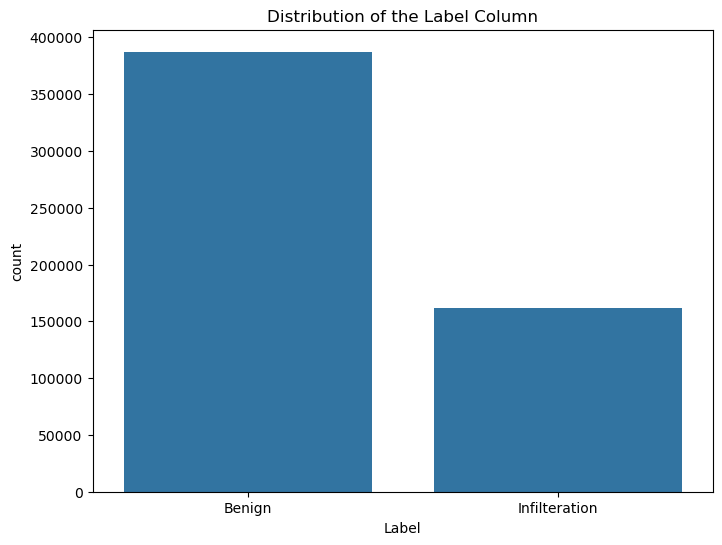

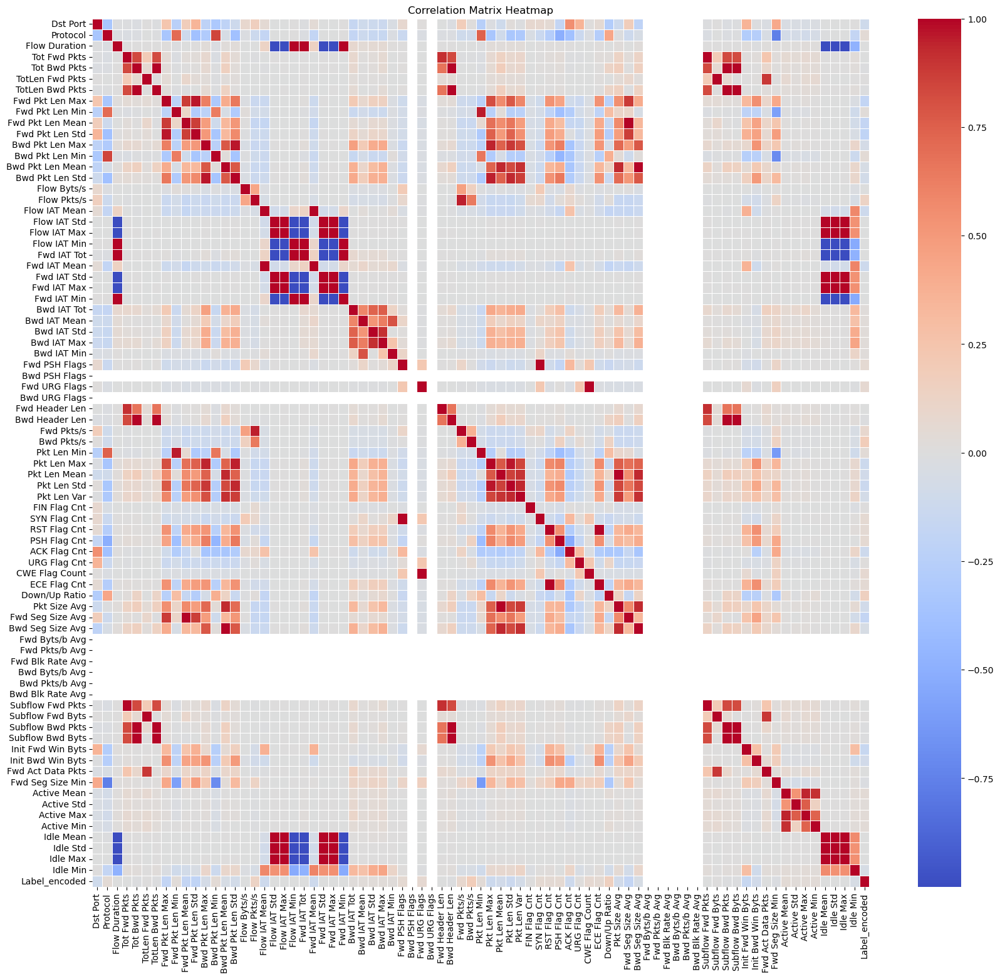

Top 10 features most positively correlated with the Label:
Label_encoded     1.000000
Bwd Pkts/s        0.181721
Down/Up Ratio     0.152669
Flow Pkts/s       0.128203
Fwd Pkts/s        0.080450
Fwd URG Flags     0.068378
CWE Flag Count    0.068378
PSH Flag Cnt      0.059914
Fwd PSH Flags     0.055432
SYN Flag Cnt      0.055432
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Fwd Pkt Len Max    -0.182462
Fwd Pkt Len Std    -0.198229
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


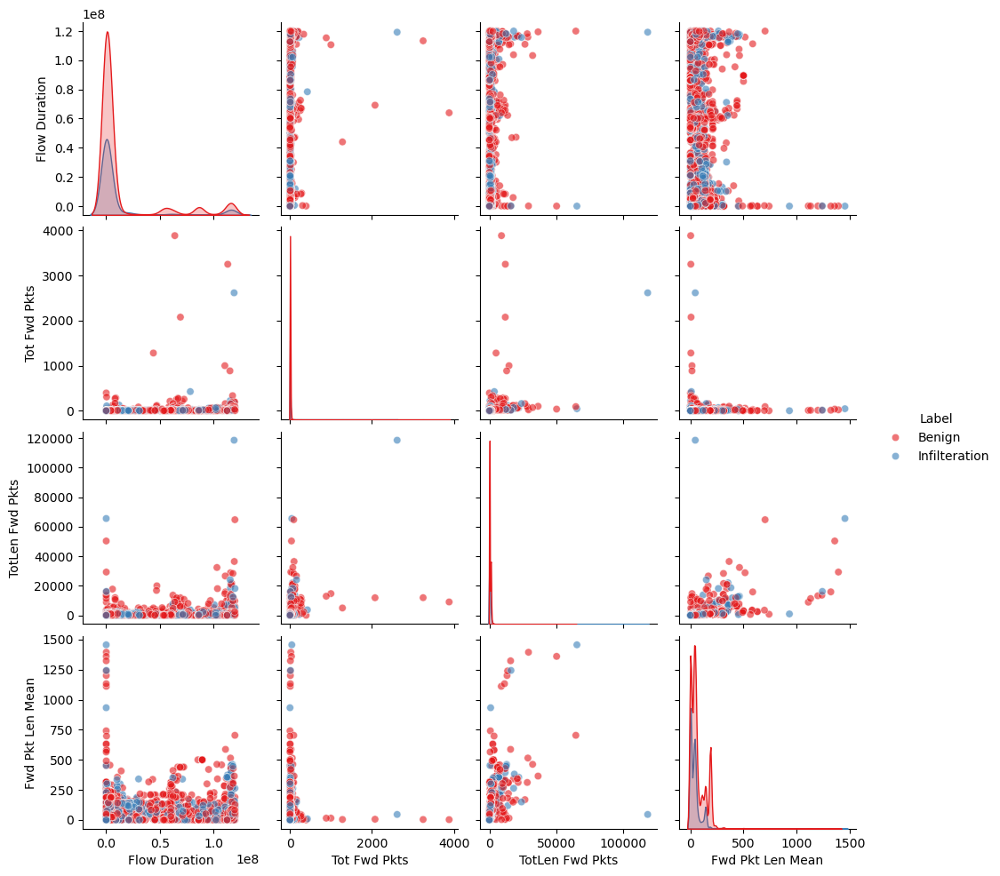

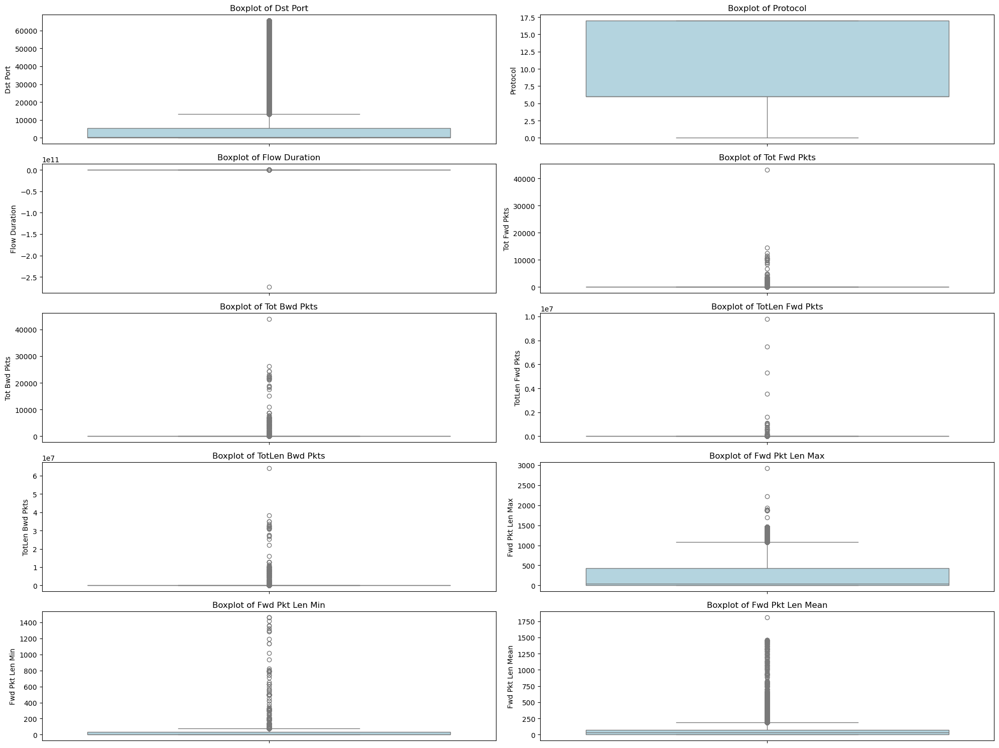

Top 25 important features:
Dst Port: 0.08691016311432655
Flow IAT Min: 0.04652471979062477
Init Fwd Win Byts: 0.04507947608043612
Flow IAT Max: 0.044976808123188584
Flow Duration: 0.04286649034022814
Flow IAT Mean: 0.042138686615801495
Fwd Pkts/s: 0.0404186577606305
Bwd Pkts/s: 0.03906503695369348
Flow Byts/s: 0.03188071896995658
Flow Pkts/s: 0.02892508887523054
Fwd IAT Max: 0.027153136059956978
Fwd IAT Tot: 0.02609049988735311
Fwd IAT Min: 0.025185082630983915
Fwd IAT Mean: 0.023154407004628327
ECE Flag Cnt: 0.02267743570987
Fwd Seg Size Min: 0.022270599084254286
RST Flag Cnt: 0.020980251285923485
Init Bwd Win Byts: 0.01891602584375624
Flow IAT Std: 0.017614634624287445
PSH Flag Cnt: 0.016244295874599073
Fwd Header Len: 0.01573568359882423
Bwd IAT Max: 0.012903724150594787
Pkt Len Var: 0.012883327837731414
Fwd Pkt Len Max: 0.012320802887138643
Fwd IAT Std: 0.012216649861706383


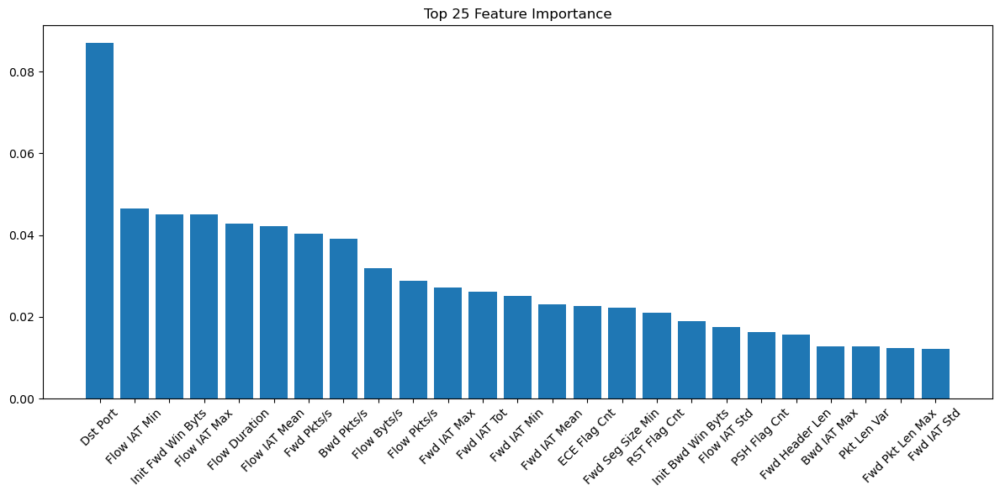

Epoch 1/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - loss: 0.6089 - val_loss: 1.2566
Epoch 2/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5259 - val_loss: 1.2534
Epoch 3/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5675 - val_loss: 1.2526
Epoch 4/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 983us/step - loss: 0.4871 - val_loss: 1.2524
Epoch 5/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4772 - val_loss: 1.2523
Epoch 6/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5134 - val_loss: 1.2522
Epoch 7/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5024 - val_loss: 1.2521
Epoch 8/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5698 - val_loss: 1.2520
Epoch 9/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4763 - val_loss: 1.2519
Epoch 10/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 979us/step - loss: 0.5486 - val_loss: 1.2518
Epoch 11/50
2747/2747 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.4948 - val_loss: 1.2518
Epoch 12/50
2747/2747 ━━━━

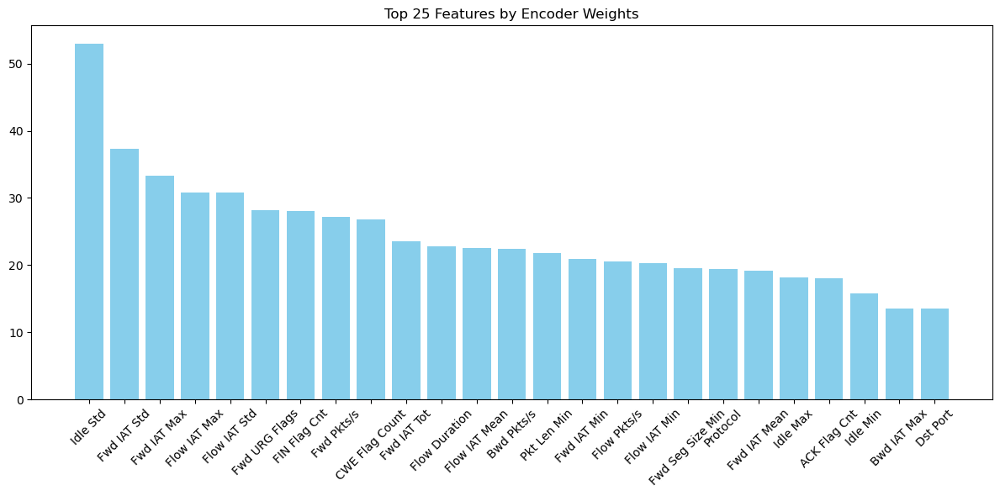

13731/13731 ━━━━━━━━━━━━━━━━━━━━ 11s 809us/step
3433/3433 ━━━━━━━━━━━━━━━━━━━━ 2s 714us/step
Encoded features shape: (439378, 20)
Top 25 features by LDA coefficients:
             Feature  Coefficient
24       Fwd IAT Max   -86.976622
25       Fwd IAT Min    82.833816
76          Idle Max    80.954747
23       Fwd IAT Std    56.842481
19      Flow IAT Max    45.485934
18      Flow IAT Std   -41.996863
74         Idle Mean    32.540835
75          Idle Std   -29.577610
20      Flow IAT Min   -27.655890
21       Fwd IAT Tot    25.832459
2      Flow Duration   -24.834182
6    TotLen Bwd Pkts     7.160857
65  Subflow Bwd Byts    -5.060884
36    Bwd Header Len    -4.300065
42       Pkt Len Std    -3.324393
43       Pkt Len Var     2.557342
77          Idle Min    -1.996553
11   Bwd Pkt Len Max     1.241272
22      Fwd IAT Mean    -1.110991
4       Tot Bwd Pkts     1.099884
64  Subflow Bwd Pkts     1.099884
41      Pkt Len Mean    -0.920751
48      ACK Flag Cnt    -0.911820
69  Fwd Seg Size 

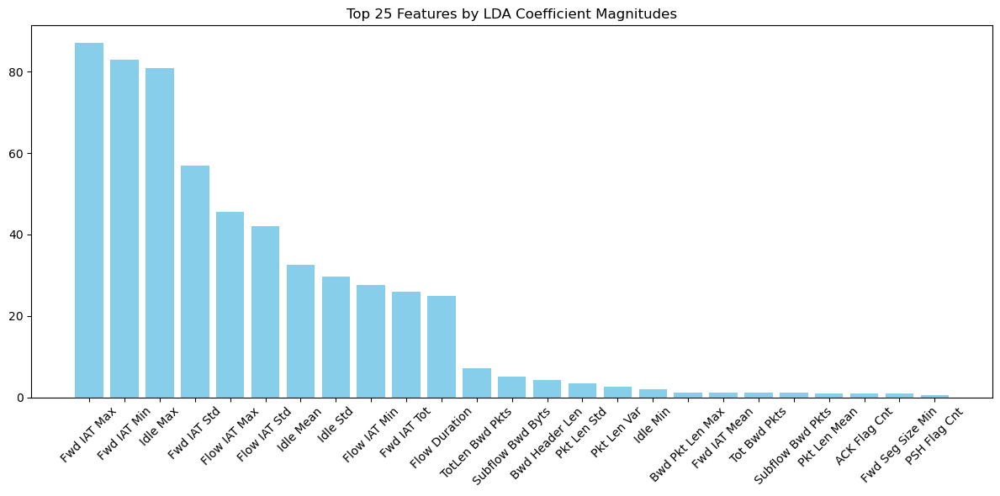

Processing file: SQL Injection.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0      8545         6             19             1             1   
1       445         6         408839             7             5   
2       443         6        4154047            91           145   
3       443         6          47261             9             7   
4       443         6       10261988             9            11   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0                0              0.0                0                0   
1              455            338.0              140                0   
2             8542         194296.0              469                0   
3              557           3773.0              206                0   
4              777           6605.0              459                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0          0.000000  ...                20    

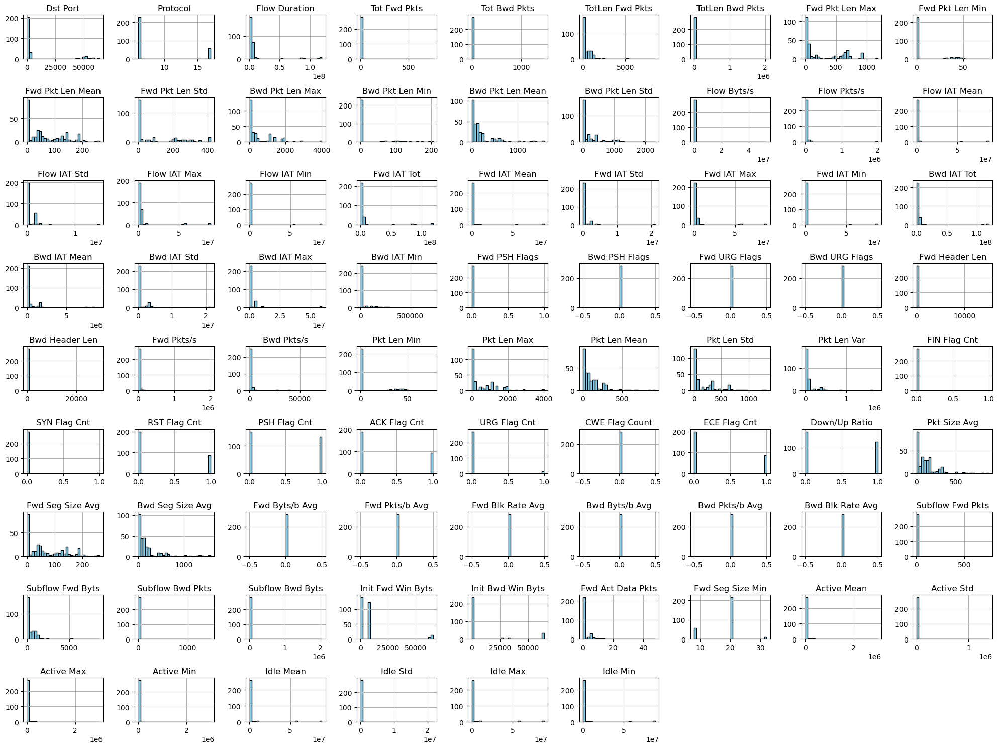

Label
Benign           199
SQL Injection     87
Name: count, dtype: int64


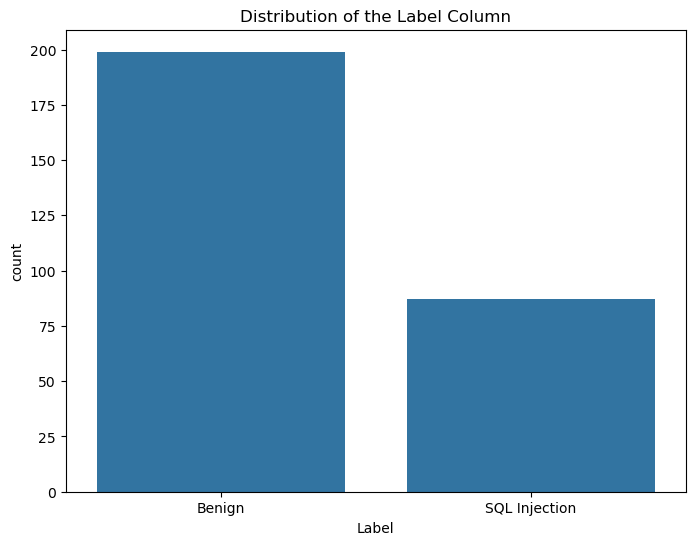

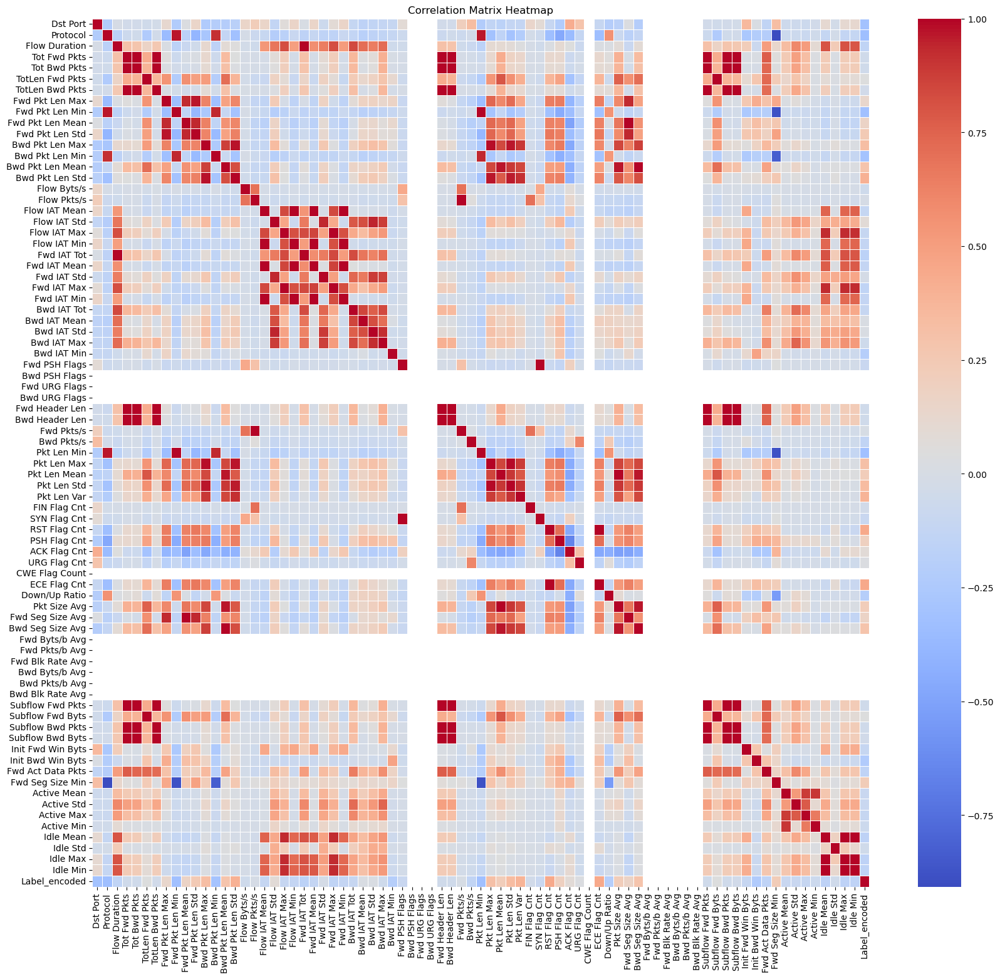

Top 10 features most positively correlated with the Label:
Label_encoded       1.000000
RST Flag Cnt        0.444820
ECE Flag Cnt        0.444820
Bwd Pkt Len Std     0.400955
Pkt Len Var         0.385173
Pkt Len Std         0.340872
Bwd Pkt Len Max     0.326594
Pkt Len Max         0.307555
Bwd Pkt Len Mean    0.287625
Bwd Seg Size Avg    0.287625
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Bwd PSH Flags      NaN
Fwd URG Flags      NaN
Bwd URG Flags      NaN
CWE Flag Count     NaN
Fwd Byts/b Avg     NaN
Fwd Pkts/b Avg     NaN
Fwd Blk Rate Avg   NaN
Bwd Byts/b Avg     NaN
Bwd Pkts/b Avg     NaN
Bwd Blk Rate Avg   NaN
Name: Label_encoded, dtype: float64


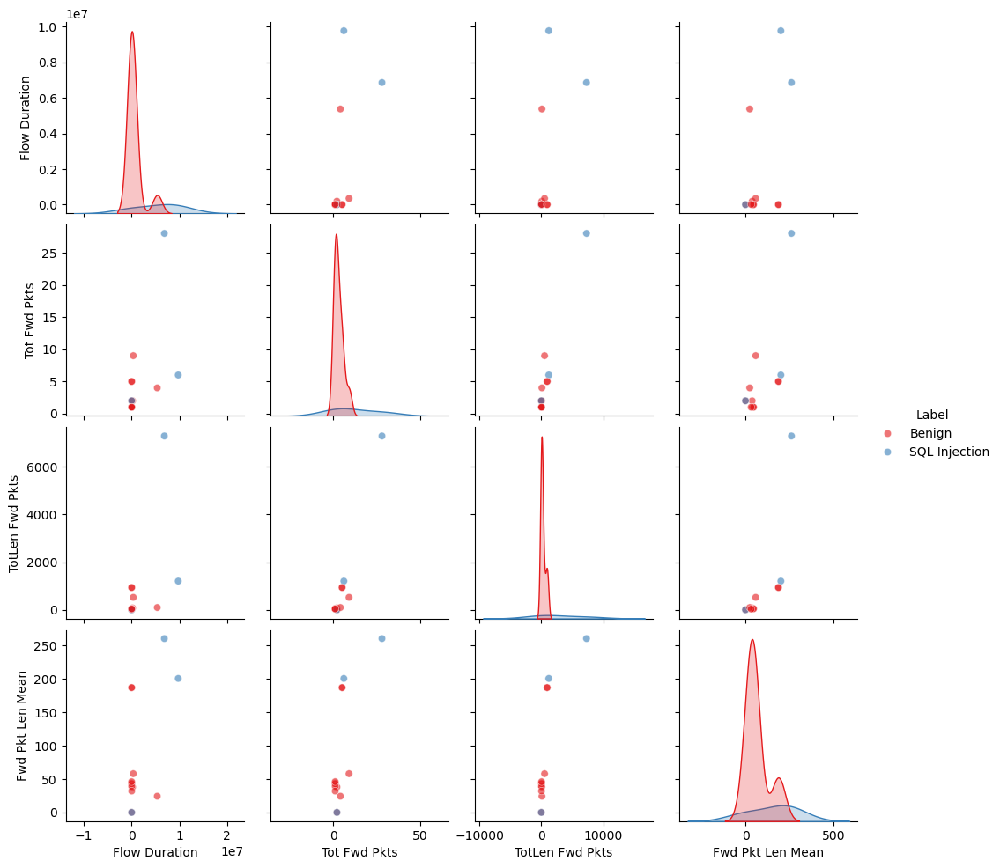

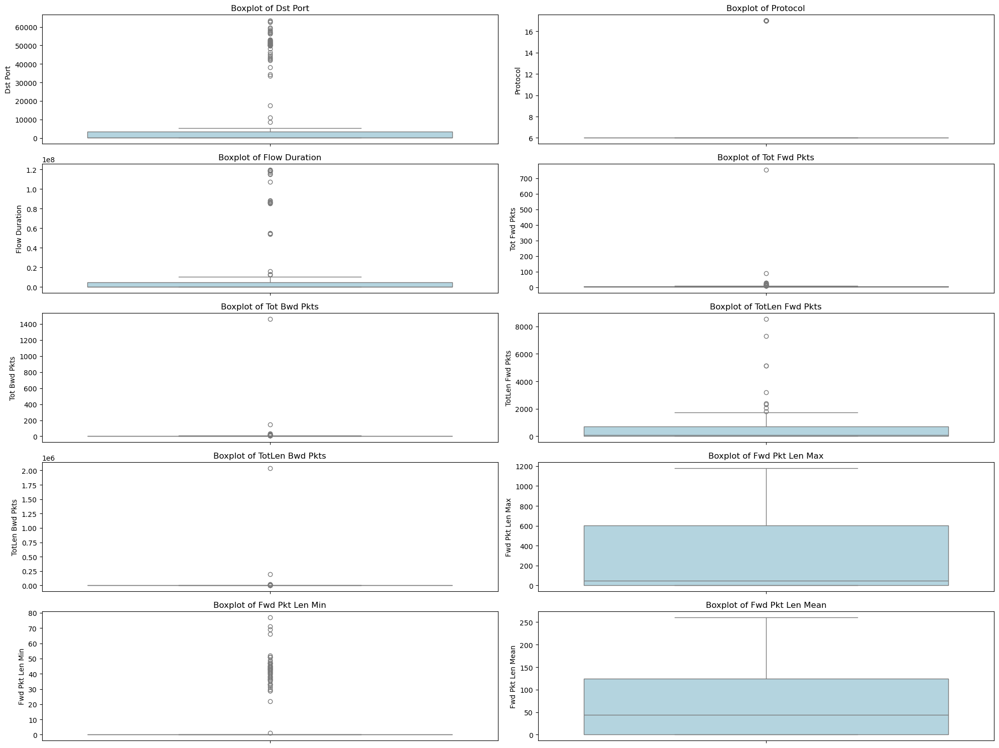

Top 25 important features:
Dst Port: 0.10356380135552269
Init Fwd Win Byts: 0.0905014062821158
Fwd IAT Min: 0.04808579103621071
Bwd Pkts/s: 0.0369513940258479
Bwd Pkt Len Max: 0.03597486420943196
Fwd Pkts/s: 0.03161262367303643
Flow IAT Min: 0.030827507398793683
Flow Byts/s: 0.03025563835587827
Flow Duration: 0.02982221772759637
Flow IAT Max: 0.029698201945606927
Flow IAT Mean: 0.027486648186811295
Bwd Pkt Len Std: 0.02687311341155142
Pkt Len Var: 0.025852986922798072
Fwd Pkt Len Std: 0.025771633890690017
Pkt Len Max: 0.025273690310209655
Flow Pkts/s: 0.023662856270898834
Fwd IAT Tot: 0.023069031320980624
Fwd IAT Max: 0.021465111601977442
Fwd IAT Mean: 0.020895470836449256
Pkt Len Std: 0.019983449974237687
Pkt Size Avg: 0.01843333955409533
Fwd Header Len: 0.017859376761326283
Subflow Fwd Pkts: 0.017726598583507128
Bwd Seg Size Avg: 0.013799695816568855
Fwd Pkt Len Max: 0.012633146862812979


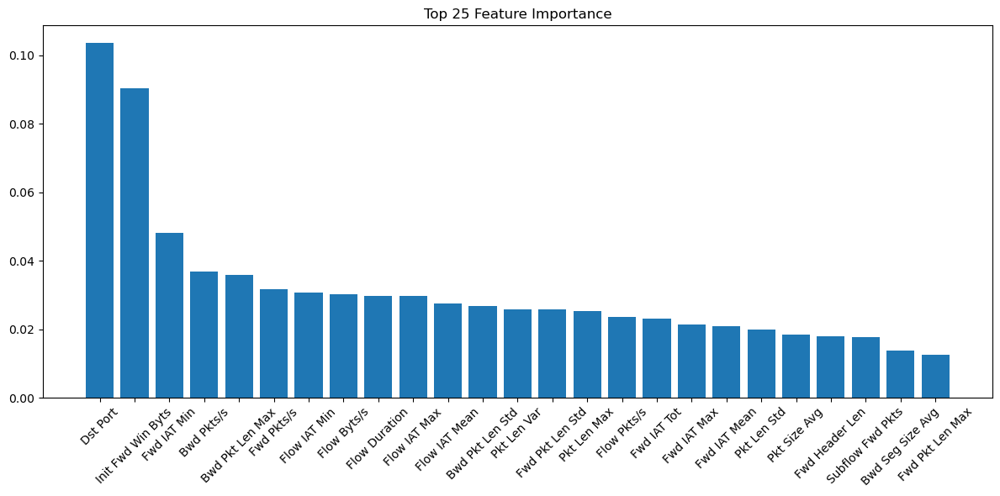

Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step - loss: 1.0227 - val_loss: 1.6312
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 1.0188 - val_loss: 1.6261
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.9957 - val_loss: 1.6209
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.9954 - val_loss: 1.6162
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.9895 - val_loss: 1.6115
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 0.9608 - val_loss: 1.6067
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.9645 - val_loss: 1.6017
Epoch 8/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.9493 - val_loss: 1.5966
Epoch 9/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.9358 - val_loss: 1.5914
Epoch 10/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.9546 - val_loss: 1.5860
Epoch 11/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.9179 - val_loss: 1.5806
Epoch 12/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.9462 - val_loss: 1.5750


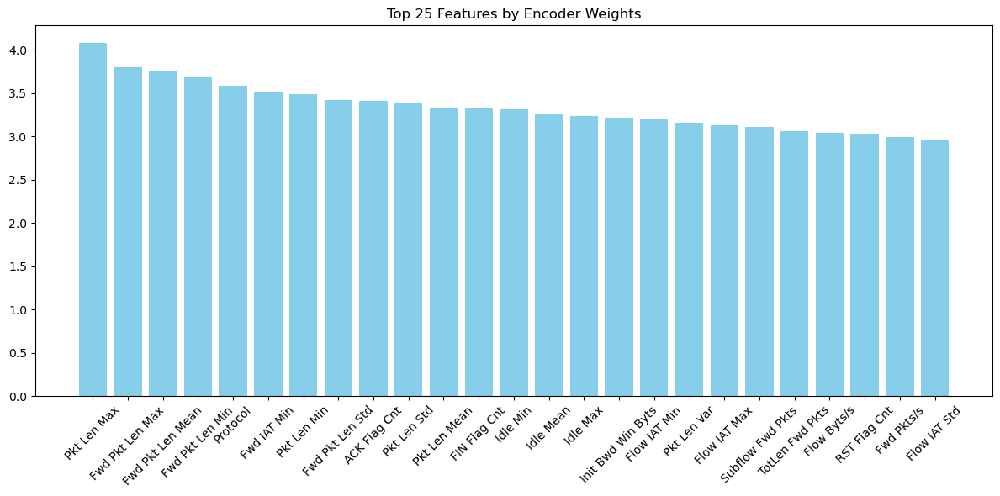

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Encoded features shape: (228, 20)
Top 25 features by LDA coefficients:
             Feature  Coefficient
39       Pkt Len Min  4719.859025
8    Fwd Pkt Len Min -4705.304452
20      Flow IAT Min  1537.886352
74         Idle Mean  1312.020372
76          Idle Max  -962.013120
17     Flow IAT Mean  -923.588446
19      Flow IAT Max  -719.327376
22      Fwd IAT Mean  -644.095553
25       Fwd IAT Min   502.320248
2      Flow Duration   410.924871
77          Idle Min  -356.575619
21       Fwd IAT Tot  -351.184595
29       Bwd IAT Max   297.788729
73        Active Min  -268.671985
70       Active Mean   244.948898
18      Flow IAT Std   215.135871
28       Bwd IAT Std  -213.300245
71        Active Std  -171.736800
24       Fwd IAT Max   129.147728
35    Fwd Header Len   122.664658
72        Active Max    98.897054
23       Fwd IAT Std    97.834783
42       Pkt Len Std    94.161428
4       Tot Bwd Pkts    84.017964
64  

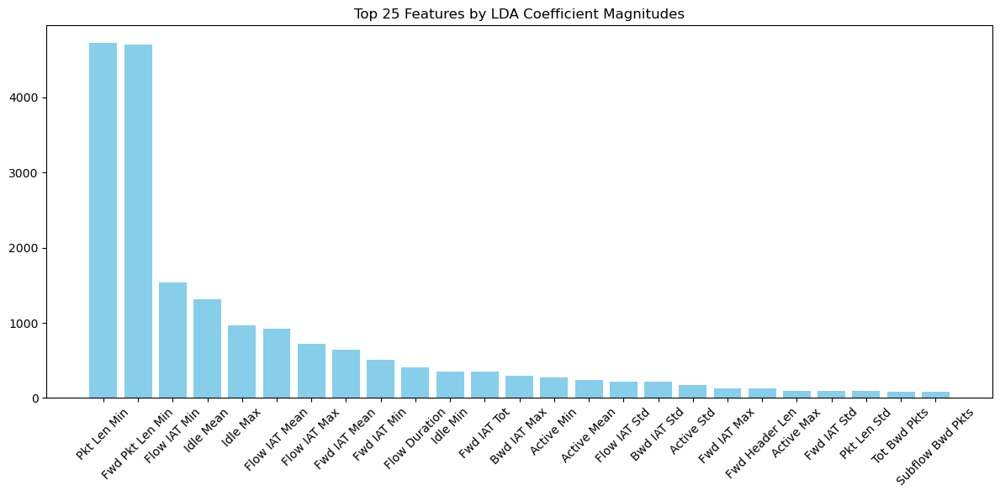

Processing file: SSH-Bruteforce.csv
   Dst Port  Protocol  Flow Duration  Tot Fwd Pkts  Tot Bwd Pkts  \
0        22         6        2567078            16            16   
1         0         0      112642740             3             0   
2        22         6        1331500            13            11   
3         0         0      112642748             3             0   
4         0         0      112639904             3             0   

   TotLen Fwd Pkts  TotLen Bwd Pkts  Fwd Pkt Len Max  Fwd Pkt Len Min  \
0             1096           2261.0              272                0   
1                0              0.0                0                0   
2             1244           1969.0              736                0   
3                0              0.0                0                0   
4                0              0.0                0                0   

   Fwd Pkt Len Mean  ...  Fwd Seg Size Min  Active Mean  Active Std  \
0         68.500000  ...                32   

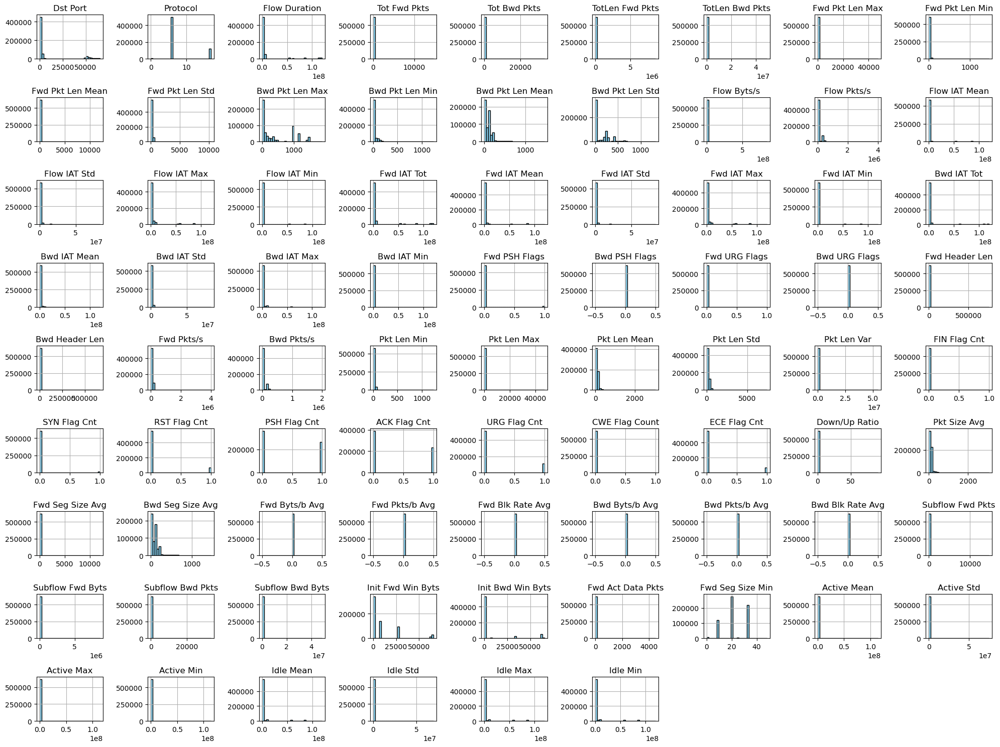

Label
Benign            438330
SSH-Bruteforce    187589
Name: count, dtype: int64


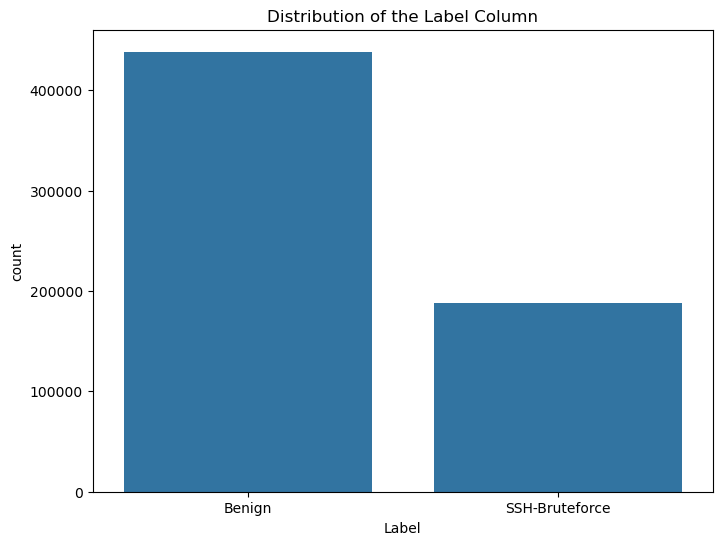

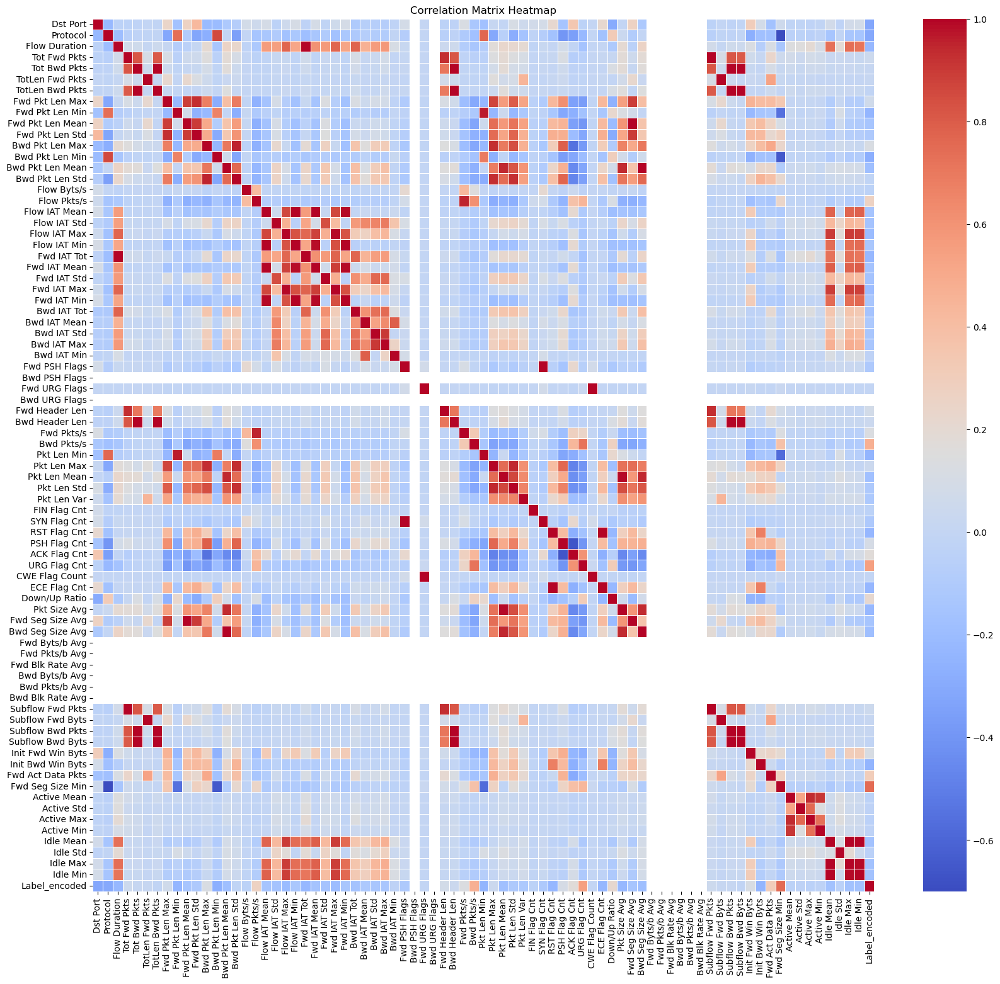

Top 10 features most positively correlated with the Label:
Label_encoded        1.000000
Fwd Seg Size Min     0.749262
URG Flag Cnt         0.544934
Bwd Pkts/s           0.473295
Fwd Act Data Pkts    0.308682
Flow Pkts/s          0.269018
Down/Up Ratio        0.211629
ACK Flag Cnt         0.170428
Fwd Pkts/s           0.132322
Bwd Pkt Len Max      0.117615
Name: Label_encoded, dtype: float64

Top 10 features most negatively correlated with the Label:
Protocol           -0.301989
Dst Port           -0.318776
Bwd PSH Flags            NaN
Bwd URG Flags            NaN
Fwd Byts/b Avg           NaN
Fwd Pkts/b Avg           NaN
Fwd Blk Rate Avg         NaN
Bwd Byts/b Avg           NaN
Bwd Pkts/b Avg           NaN
Bwd Blk Rate Avg         NaN
Name: Label_encoded, dtype: float64


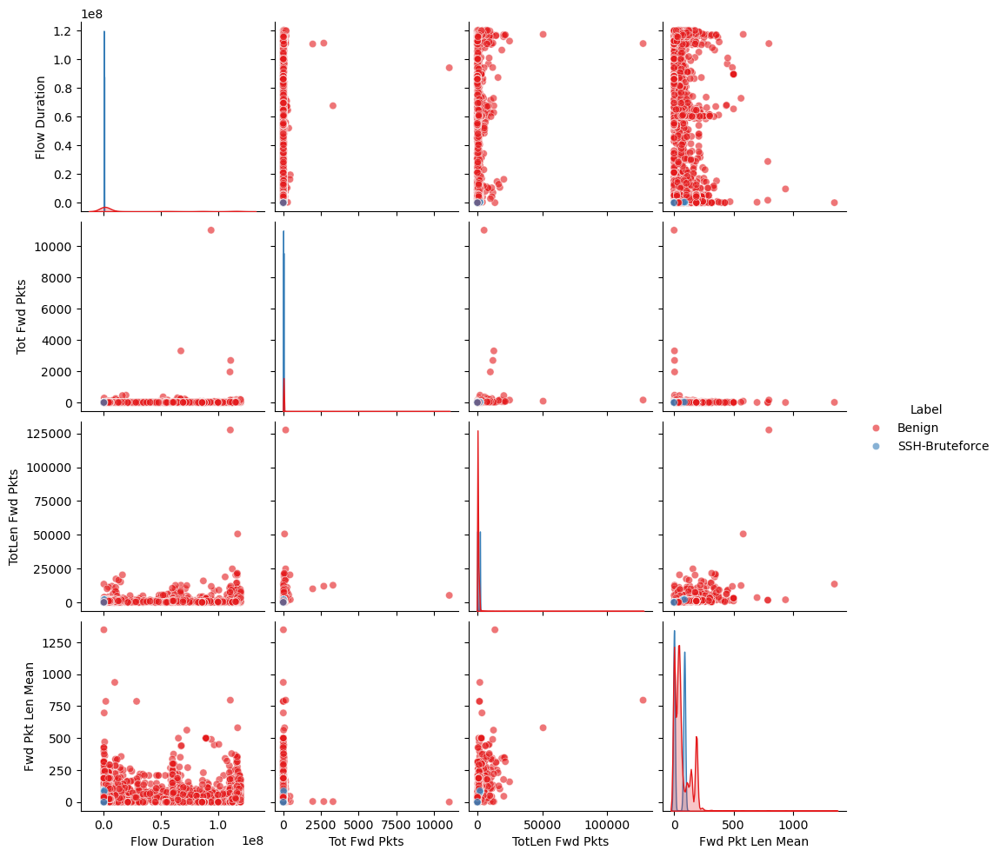

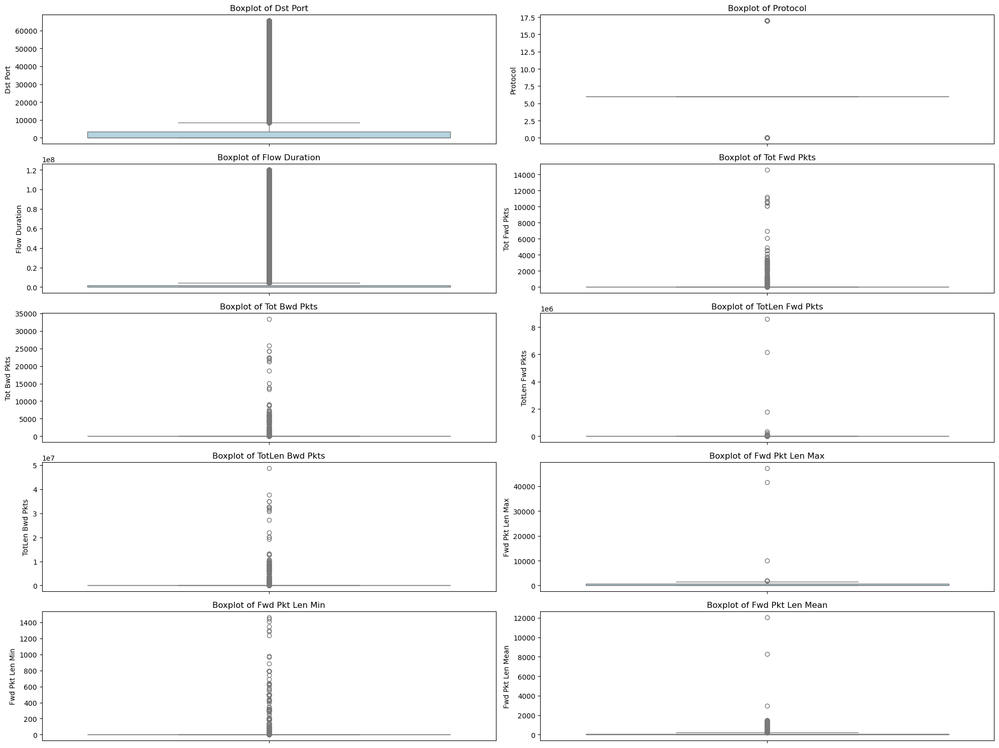

Top 25 important features:
Dst Port: 0.20301479350034127
Fwd Seg Size Min: 0.08052226418843592
Bwd Pkts/s: 0.07898938088343846
Fwd Act Data Pkts: 0.0705155925577194
Init Bwd Win Byts: 0.06177199548069312
Fwd Header Len: 0.05162433873528861
Flow Pkts/s: 0.04854692763711315
Fwd Pkts/s: 0.0476462883112899
TotLen Fwd Pkts: 0.042231771722922105
Flow IAT Mean: 0.028721266622658417
Bwd Header Len: 0.0241864608537022
Subflow Fwd Pkts: 0.022746554841906724
Subflow Fwd Byts: 0.0214491973285998
Flow IAT Min: 0.021223232034214123
Tot Bwd Pkts: 0.019943858858396286
URG Flag Cnt: 0.019353678357422067
Flow IAT Max: 0.017114813769881092
Pkt Len Mean: 0.017016074772186494
Subflow Bwd Pkts: 0.01417660975445135
Flow Duration: 0.012979391302084777
Bwd Pkt Len Max: 0.009492800718553
Bwd Pkt Len Mean: 0.008413992897817977
Pkt Size Avg: 0.007632531877754789
Init Fwd Win Byts: 0.007536080320543888
Fwd Pkt Len Max: 0.006266912170112855


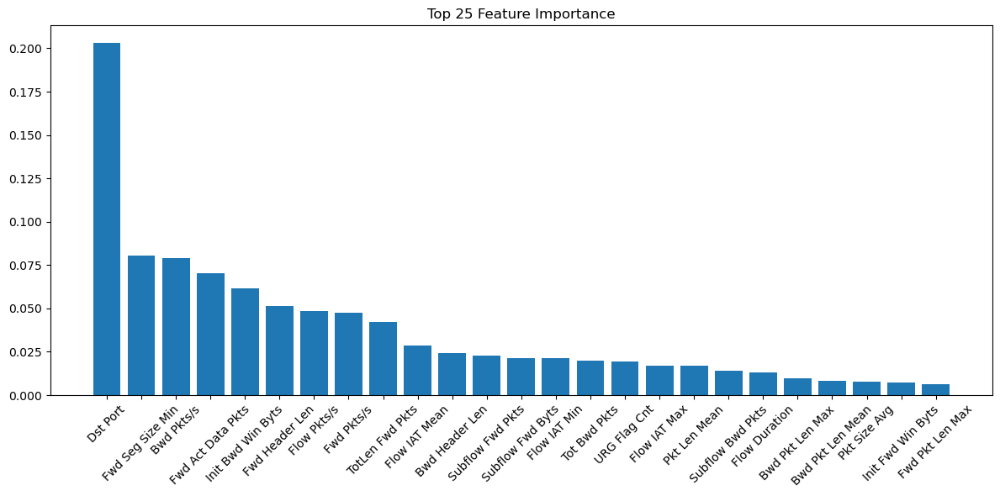

Epoch 1/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - loss: 0.7555 - val_loss: 0.6421
Epoch 2/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6170 - val_loss: 0.6391
Epoch 3/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6068 - val_loss: 0.6384
Epoch 4/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5821 - val_loss: 0.6379
Epoch 5/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5709 - val_loss: 0.6376
Epoch 6/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6443 - val_loss: 0.6375
Epoch 7/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5817 - val_loss: 0.6374
Epoch 8/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.6087 - val_loss: 0.6373
Epoch 9/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5819 - val_loss: 0.6372
Epoch 10/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5977 - val_loss: 0.6371
Epoch 11/50
3130/3130 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - loss: 0.5803 - val_loss: 0.6371
Epoch 12/50
3130/3130 ━━━━━━━━

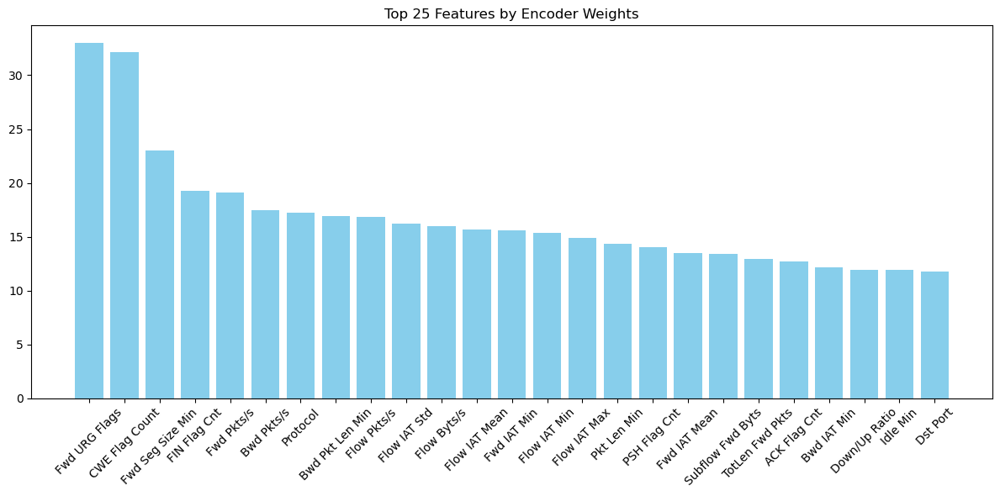

15648/15648 ━━━━━━━━━━━━━━━━━━━━ 10s 650us/step
3912/3912 ━━━━━━━━━━━━━━━━━━━━ 3s 815us/step
Encoded features shape: (500735, 20)
Top 25 features by LDA coefficients:
              Feature  Coefficient
36     Bwd Header Len   170.314849
4        Tot Bwd Pkts   -82.268317
64   Subflow Bwd Pkts   -82.268317
69   Fwd Seg Size Min    35.088344
47       PSH Flag Cnt   -34.738644
48       ACK Flag Cnt   -32.143821
10    Fwd Pkt Len Std   -25.761598
6     TotLen Bwd Pkts   -21.720892
20       Flow IAT Min    20.096431
65   Subflow Bwd Byts    16.608539
7     Fwd Pkt Len Max    15.847276
17      Flow IAT Mean   -15.508685
49       URG Flag Cnt    14.438147
11    Bwd Pkt Len Max    10.302093
66  Init Fwd Win Byts    10.110162
53       Pkt Size Avg     9.615959
41       Pkt Len Mean    -9.058162
40        Pkt Len Max    -8.663001
1            Protocol    -8.076111
42        Pkt Len Std     7.600744
0            Dst Port    -7.200577
19       Flow IAT Max    -7.166000
21        Fwd IAT Tot     7.

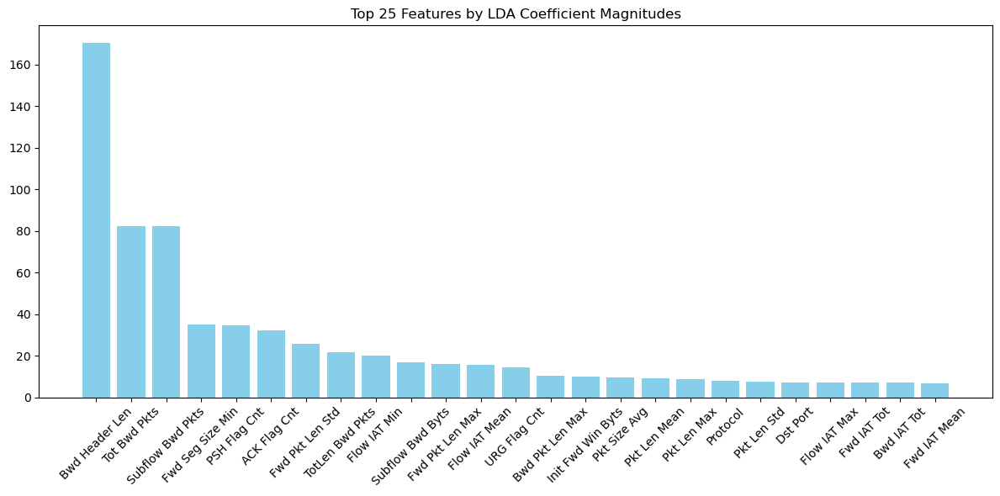

In [10]:
for file in file_names:
    print(f"Processing file: {file}")
    
    # Load dataset
    df = pd.read_csv(file)
    
    # Basic info
    print(df.head())
    print(df.columns)
    print(df.info())
    print(df.describe().T)
    
    # Check for missing values
    missing_values = df.isnull().sum()
    print(missing_values[missing_values > 0])
    
    # Select numeric columns
    numeric_columns = df.select_dtypes(include=np.number).columns
    
    # Histograms for numeric columns
    df[numeric_columns].hist(figsize=(20, 15), bins=30, color='skyblue', edgecolor='black')
    plt.tight_layout()
    plt.show()

    # Count plot of 'Label' column
    print(df['Label'].value_counts())
    plt.figure(figsize=(8, 6))
    sns.countplot(x='Label', data=df)
    plt.title('Distribution of the Label Column')
    plt.show()
    
    # Label encoding for correlation analysis
    df1 = df.copy(deep=True)
    label_encoder = LabelEncoder()
    df1['Label_encoded'] = label_encoder.fit_transform(df1['Label'])
    
    # Correlation matrix
    df1_numeric = df1.select_dtypes(include=['number'])
    correlation_matrix = df1_numeric.corr()

    # Heatmap for correlation matrix
    plt.figure(figsize=(20, 18))
    sns.heatmap(correlation_matrix, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Matrix Heatmap')
    plt.show()

    # Top 10 positively and negatively correlated features with 'Label_encoded'
    correlation_with_label = correlation_matrix['Label_encoded'].sort_values(ascending=False)
    print("Top 10 features most positively correlated with the Label:")
    print(correlation_with_label.head(10))

    print("\nTop 10 features most negatively correlated with the Label:")
    print(correlation_with_label.tail(10))
    
    # Sample the data
    sample_df = df.sample(frac=0.05, random_state=42)
    selected_features = ['Flow Duration', 'Tot Fwd Pkts', 'TotLen Fwd Pkts', 'Fwd Pkt Len Mean', 'Label']
    sns.pairplot(sample_df[selected_features], hue='Label', palette='Set1', diag_kind='kde', plot_kws={'alpha': 0.6})
    plt.show()

    # Boxplots to detect outliers
    plt.figure(figsize=(20, 15))
    for i, column in enumerate(numeric_columns[:10], 1):
        plt.subplot(5, 2, i)
        sns.boxplot(y=column, data=df, color='lightblue')
        plt.title(f'Boxplot of {column}')
    plt.tight_layout()
    plt.show()

    # Count plots for categorical columns
    categorical_columns = df.select_dtypes(include='object').columns.drop('Label')
    for column in categorical_columns:
        plt.figure(figsize=(10, 6))
        sns.countplot(y=column, data=df, order=df[column].value_counts().index, palette='viridis')
        plt.title(f'Count plot of {column}')
        plt.show()

    # Feature extraction with RandomForest
    X = df.drop('Label', axis=1)
    y = df['Label']
    y = label_encoder.fit_transform(y)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # RandomForest feature importance
    rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
    rf.fit(X_train, y_train)
    importances = rf.feature_importances_
    indices = np.argsort(importances)[::-1]

    print("Top 25 important features:")
    for i in range(25):
        print(f"{X.columns[indices[i]]}: {importances[indices[i]]}")

    plt.figure(figsize=(12, 6))
    plt.title("Top 25 Feature Importance")
    plt.bar(range(25), importances[indices[:25]], align='center')
    plt.xticks(range(25), X.columns[indices[:25]], rotation=45)
    plt.tight_layout()
    plt.show()

    # Autoencoder
    input_dim = X_train_scaled.shape[1]
    encoding_dim = 20
    input_layer = Input(shape=(input_dim,))
    encoder = Dense(encoding_dim, activation='relu')(input_layer)
    decoder = Dense(input_dim, activation='sigmoid')(encoder)
    autoencoder = Model(inputs=input_layer, outputs=decoder)
    autoencoder.compile(optimizer='adam', loss='mse')
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    autoencoder.fit(X_train_scaled, X_train_scaled, epochs=50, batch_size=128, validation_split=0.2, callbacks=[early_stopping], verbose=1)
    encoder_model = Model(inputs=input_layer, outputs=encoder)
    encoder_weights = autoencoder.get_weights()[0]

    feature_importance = pd.DataFrame({
        'Feature': X.columns,
        'Weight': np.abs(encoder_weights).sum(axis=1)
    })
    feature_importance = feature_importance.sort_values(by='Weight', ascending=False)
    top_features = feature_importance.head(25)

    print("Top 25 features by encoder weights:")
    print(top_features[['Feature', 'Weight']])

    plt.figure(figsize=(12, 6))
    plt.bar(top_features['Feature'], top_features['Weight'], color='skyblue')
    plt.title("Top 25 Features by Encoder Weights")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    X_train_encoded = encoder_model.predict(X_train_scaled)
    X_test_encoded = encoder_model.predict(X_test_scaled)
    print(f"Encoded features shape: {X_train_encoded.shape}")

    # LDA
    lda = LinearDiscriminantAnalysis(n_components=1)
    X_train_lda = lda.fit_transform(X_train_scaled, y_train)
    lda_coefficients = lda.coef_[0]

    feature_importance = pd.DataFrame({
        'Feature': X.columns,
        'Coefficient': lda_coefficients
    })
    feature_importance['Abs_Coefficient'] = np.abs(feature_importance['Coefficient'])
    feature_importance = feature_importance.sort_values(by='Abs_Coefficient', ascending=False)
    top_features = feature_importance.head(25)

    print("Top 25 features by LDA coefficients:")
    print(top_features[['Feature', 'Coefficient']])

    plt.figure(figsize=(12, 6))
    plt.bar(top_features['Feature'], top_features['Abs_Coefficient'], color='skyblue')
    plt.title("Top 25 Features by LDA Coefficient Magnitudes")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [3]:
# Load all datasets in a list or dictionary for easy access
files = ['Bot.csv', 'Brute Force-Web.csv','Brute Force-XSS.csv', 'DDOS attack-HOIC.csv',
         'DDOS attack-LOIC-UDP.csv','DDoS attacks-LOIC-HTTP.csv','DoS attacks-GoldenEye.csv',
         'DoS attacks-Hulk.csv','DoS attacks-SlowHTTPTest.csv','DoS attacks-Slowloris.csv',
         'FTP-BruteForce.csv','Infilteration.csv','SQL Injection.csv','SSH-Bruteforce.csv']
datasets = {file: pd.read_csv(file) for file in files}

In [23]:
rows=0
for file in files:
    rows += datasets[file].shape[0]
print(rows)

9625148
